# 人脸生成（Face Generation）
在该项目中，你将使用生成式对抗网络（Generative Adversarial Nets）来生成新的人脸图像。
### 获取数据
该项目将使用以下数据集：
- MNIST
- CelebA

由于 CelebA 数据集比较复杂，而且这是你第一次使用 GANs。我们想让你先在 MNIST 数据集上测试你的 GANs 模型，以让你更快的评估所建立模型的性能。

如果你在使用 [FloydHub](https://www.floydhub.com/), 请将 `data_dir` 设置为 "/input" 并使用 [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)
#helper.download_extract('celeba', cele_data_dir)

Found mnist Data
Found celeba Data


## 探索数据（Explore the Data）
### MNIST
[MNIST](http://yann.lecun.com/exdb/mnist/) 是一个手写数字的图像数据集。你可以更改 `show_n_images` 探索此数据集。

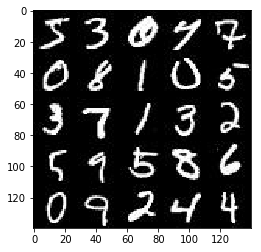

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
[CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) 是一个包含 20 多万张名人图片及相关图片说明的数据集。你将用此数据集生成人脸，不会用不到相关说明。你可以更改 `show_n_images` 探索此数据集。

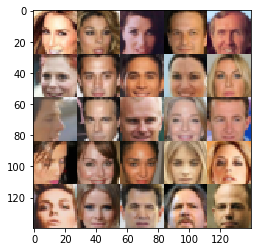

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## 预处理数据（Preprocess the Data）
由于该项目的重点是建立 GANs 模型，我们将为你预处理数据。

经过数据预处理，MNIST 和 CelebA 数据集的值在 28×28 维度图像的 [-0.5, 0.5] 范围内。CelebA 数据集中的图像裁剪了非脸部的图像部分，然后调整到 28x28 维度。

MNIST 数据集中的图像是单[通道](https://en.wikipedia.org/wiki/Channel_(digital_image%29)的黑白图像，CelebA 数据集中的图像是 [三通道的 RGB 彩色图像](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images)。

## 建立神经网络（Build the Neural Network）
你将通过部署以下函数来建立 GANs 的主要组成部分:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### 检查 TensorFlow 版本并获取 GPU 型号
检查你是否使用正确的 TensorFlow 版本，并获取 GPU 型号

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.0-rc1
Default GPU Device: /gpu:0


### 输入（Input）
部署 `model_inputs` 函数以创建用于神经网络的 [占位符 (TF Placeholders)](https://www.tensorflow.org/versions/r0.11/api_docs/python/io_ops/placeholders)。请创建以下占位符：
- 输入图像占位符: 使用 `image_width`，`image_height` 和 `image_channels` 设置为 rank 4。
- 输入 Z 占位符: 设置为 rank 2，并命名为 `z_dim`。
- 学习速率占位符: 设置为 rank 0。

返回占位符元组的形状为 (tensor of real input images, tensor of z data, learning rate)。


In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    image = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name = 'real_input')
    z = tf.placeholder(tf.float32, [None, z_dim], name = 'z_dim')
    lr = tf.placeholder(tf.float32, name = 'learning_rate')
    return image, z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "D:\\Anaconda3\\lib\\runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "D:\\Anaconda3\\lib\\runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "D:\\Anaconda3\\lib\\site-packages\\ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "D:\\Anaconda3\\lib\\site-packages\\traitlets\\config\\application.py", line 658, in launch_instance\n    app.start()', 'File "D:\\Anaconda3\\lib\\site-packages\\ipykernel\\kernelapp.py", line 477, in start\n    ioloop.IOLoop.instance().start()', 'File "D:\\Anaconda3\\lib\\site-packages\\zmq\\eventloop\\ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'File "D:\\Anaconda3\\l

### 辨别器（Discriminator）
部署 `discriminator` 函数创建辨别器神经网络以辨别 `images`。该函数应能够重复使用神经网络中的各种变量。 在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "discriminator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回形如 (tensor output of the discriminator, tensor logits of the discriminator) 的元组。

In [6]:
def discriminator(images, reuse=False, alpha = 0.2):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x3 or 28x28x1
        x1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='SAME', kernel_initializer= tf.contrib.layers.xavier_initializer())
        relu1 = tf.maximum(alpha * x1, x1)
        relu1 = tf.nn.dropout(relu1, 0.8)
        #print(x1.get_shape())
        # 14x14x128
        
        x2 = tf.layers.conv2d(relu1, 256, 5, strides=2, padding='SAME', kernel_initializer= tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        relu2 = tf.nn.dropout(relu2, 0.8)
        #print(x2.get_shape())
        # 7x7x256
        
        x3 = tf.layers.conv2d(relu2, 512, 5, strides=2, padding='SAME', kernel_initializer= tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        relu3 = tf.nn.dropout(relu3, 0.8)
        # 4x4x512
        #print(x3.get_shape())

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*512))
        logits = tf.layers.dense(flat, 1)
        output = tf.sigmoid(logits)
        
        
        return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### 生成器（Generator）
部署 `generator` 函数以使用 `z` 生成图像。该函数应能够重复使用神经网络中的各种变量。
在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "generator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回所生成的 28 x 28 x `out_channel_dim` 维度图像。

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha = 0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator',reuse = not is_train):
        x1 = tf.layers.dense(z, 7*7*512)
        
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        x1 = tf.nn.dropout(x1, 0.8)
        #print(x1.get_shape())
        # 7x7x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='SAME', kernel_initializer = tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        #print(x2.get_shape())
        # 14x14x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='SAME', kernel_initializer = tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        #print(x3.get_shape())
        # 28x28x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=1, padding='SAME', 
                                            kernel_initializer = tf.contrib.layers.xavier_initializer())
        # 28x28x3 now
        
        output = tf.tanh(logits)     
        
        
        return output * 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### 损失函数（Loss）
部署 `model_loss` 函数训练并计算 GANs 的损失。该函数应返回形如 (discriminator loss, generator loss) 的元组。

使用你已实现的函数：
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * 0.9))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return g_loss, d_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### 优化（Optimization）
部署 `model_opt` 函数实现对 GANs 的优化。使用 [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) 获取可训练的所有变量。通过变量空间名 `discriminator` 和 `generator` 来过滤变量。该函数应返回形如 (discriminator training operation, generator training operation) 的元组。

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## 训练神经网络（Neural Network Training）
### 输出显示
使用该函数可以显示生成器 (Generator) 在训练过程中的当前输出，这会帮你评估 GANs 模型的训练程度。

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练
部署 `train` 函数以建立并训练 GANs 模型。记得使用以下你已完成的函数：
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

使用 `show_generator_output` 函数显示 `generator` 在训练过程中的输出。

**注意**：在每个批次 (batch) 中运行 `show_generator_output` 函数会显著增加训练时间与该 notebook 的体积。推荐每 100 批次输出一次 `generator` 的输出。 

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    image_width = data_shape[1]
    image_height = data_shape[2]
    image_channels = data_shape[3]
    
    input_real, input_z, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    g_loss, d_loss = model_loss(input_real, input_z, image_channels)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    loss_d, loss_g = [], []
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            step = 0
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                step += 1
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim)).astype(np.float32)
                # 不知道是什么原因，放大到-1到1后，g_loss变得很大，于是将tanh的输出缩放到-0.5到0.5
                #batch_images = batch_images * 2
                
                # 这里run两次g_train_opt，为了避免辨别器收敛太快，导致生成的图片完全没有能力PK
                # 参考 https://github.com/carpedm20/DCGAN-tensorflow
                
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                
                if step % 10 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    loss_d.append(train_loss_d)
                    loss_g.append(train_loss_g)
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count), "Batch {} ".format(step),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                if step % 100 == 0:
                    show_generator_output(sess, 25, input_z, image_channels, data_image_mode)
        return loss_d, loss_g

### MNIST
在 MNIST 上测试你的 GANs 模型。经过 2 次迭代，GANs 应该能够生成类似手写数字的图像。确保生成器 (generator) 低于辨别器 (discriminator) 的损失，或接近 0。

Epoch 1/2... Batch 10  Discriminator Loss: 3.1505... Generator Loss: 0.1574
Epoch 1/2... Batch 20  Discriminator Loss: 0.4022... Generator Loss: 6.2334
Epoch 1/2... Batch 30  Discriminator Loss: 0.3854... Generator Loss: 5.6580
Epoch 1/2... Batch 40  Discriminator Loss: 2.1076... Generator Loss: 0.4358
Epoch 1/2... Batch 50  Discriminator Loss: 1.5201... Generator Loss: 1.8188
Epoch 1/2... Batch 60  Discriminator Loss: 2.7243... Generator Loss: 0.4288
Epoch 1/2... Batch 70  Discriminator Loss: 1.9254... Generator Loss: 0.6638
Epoch 1/2... Batch 80  Discriminator Loss: 0.9059... Generator Loss: 1.2986
Epoch 1/2... Batch 90  Discriminator Loss: 1.8479... Generator Loss: 0.5618
Epoch 1/2... Batch 100  Discriminator Loss: 1.3742... Generator Loss: 0.8914


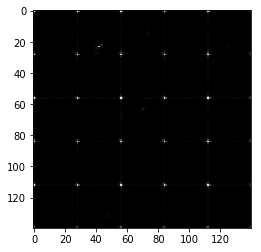

Epoch 1/2... Batch 110  Discriminator Loss: 1.4778... Generator Loss: 0.7693
Epoch 1/2... Batch 120  Discriminator Loss: 1.4035... Generator Loss: 1.2067
Epoch 1/2... Batch 130  Discriminator Loss: 1.4173... Generator Loss: 1.2127
Epoch 1/2... Batch 140  Discriminator Loss: 1.7627... Generator Loss: 0.4710
Epoch 1/2... Batch 150  Discriminator Loss: 1.8127... Generator Loss: 0.4515
Epoch 1/2... Batch 160  Discriminator Loss: 1.7373... Generator Loss: 0.7082
Epoch 1/2... Batch 170  Discriminator Loss: 1.6547... Generator Loss: 0.6542
Epoch 1/2... Batch 180  Discriminator Loss: 1.7679... Generator Loss: 0.6173
Epoch 1/2... Batch 190  Discriminator Loss: 1.5722... Generator Loss: 0.7403
Epoch 1/2... Batch 200  Discriminator Loss: 1.4693... Generator Loss: 0.6776


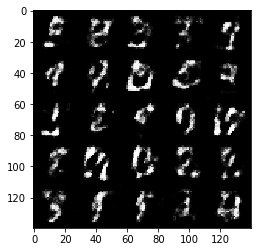

Epoch 1/2... Batch 210  Discriminator Loss: 1.2390... Generator Loss: 1.0140
Epoch 1/2... Batch 220  Discriminator Loss: 1.5497... Generator Loss: 0.7767
Epoch 1/2... Batch 230  Discriminator Loss: 1.4413... Generator Loss: 0.6109
Epoch 1/2... Batch 240  Discriminator Loss: 1.5819... Generator Loss: 0.7183
Epoch 1/2... Batch 250  Discriminator Loss: 1.4917... Generator Loss: 0.8840
Epoch 1/2... Batch 260  Discriminator Loss: 1.3610... Generator Loss: 0.8013
Epoch 1/2... Batch 270  Discriminator Loss: 1.3385... Generator Loss: 0.9811
Epoch 1/2... Batch 280  Discriminator Loss: 1.5133... Generator Loss: 0.6366
Epoch 1/2... Batch 290  Discriminator Loss: 1.5110... Generator Loss: 0.6250
Epoch 1/2... Batch 300  Discriminator Loss: 1.3658... Generator Loss: 0.9430


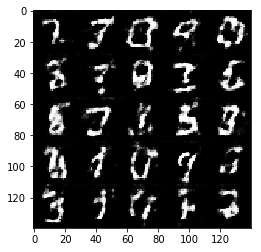

Epoch 1/2... Batch 310  Discriminator Loss: 1.3748... Generator Loss: 0.7377
Epoch 1/2... Batch 320  Discriminator Loss: 1.4442... Generator Loss: 0.6260
Epoch 1/2... Batch 330  Discriminator Loss: 1.3476... Generator Loss: 0.9196
Epoch 1/2... Batch 340  Discriminator Loss: 1.4841... Generator Loss: 0.6621
Epoch 1/2... Batch 350  Discriminator Loss: 1.4058... Generator Loss: 1.0552
Epoch 1/2... Batch 360  Discriminator Loss: 1.5038... Generator Loss: 0.9391
Epoch 1/2... Batch 370  Discriminator Loss: 1.4998... Generator Loss: 0.8521
Epoch 1/2... Batch 380  Discriminator Loss: 1.4481... Generator Loss: 0.6678
Epoch 1/2... Batch 390  Discriminator Loss: 1.5796... Generator Loss: 0.9383
Epoch 1/2... Batch 400  Discriminator Loss: 1.4674... Generator Loss: 0.6494


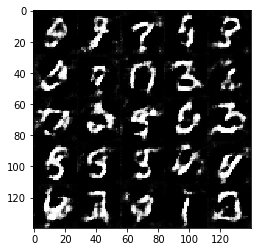

Epoch 1/2... Batch 410  Discriminator Loss: 1.5500... Generator Loss: 0.5450
Epoch 1/2... Batch 420  Discriminator Loss: 1.4625... Generator Loss: 0.9100
Epoch 1/2... Batch 430  Discriminator Loss: 1.2867... Generator Loss: 0.8892
Epoch 1/2... Batch 440  Discriminator Loss: 1.3729... Generator Loss: 0.6358
Epoch 1/2... Batch 450  Discriminator Loss: 1.2963... Generator Loss: 0.9808
Epoch 1/2... Batch 460  Discriminator Loss: 1.4967... Generator Loss: 0.6870
Epoch 1/2... Batch 470  Discriminator Loss: 1.3654... Generator Loss: 0.9550
Epoch 1/2... Batch 480  Discriminator Loss: 1.4465... Generator Loss: 0.8229
Epoch 1/2... Batch 490  Discriminator Loss: 1.4017... Generator Loss: 1.0538
Epoch 1/2... Batch 500  Discriminator Loss: 1.3583... Generator Loss: 0.9896


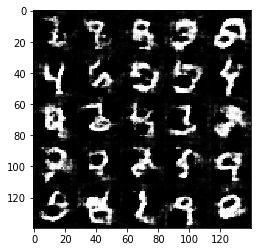

Epoch 1/2... Batch 510  Discriminator Loss: 1.4222... Generator Loss: 1.0621
Epoch 1/2... Batch 520  Discriminator Loss: 1.4090... Generator Loss: 0.5954
Epoch 1/2... Batch 530  Discriminator Loss: 1.3977... Generator Loss: 1.1705
Epoch 1/2... Batch 540  Discriminator Loss: 1.3752... Generator Loss: 0.8506
Epoch 1/2... Batch 550  Discriminator Loss: 1.4866... Generator Loss: 1.1832
Epoch 1/2... Batch 560  Discriminator Loss: 1.4226... Generator Loss: 0.7932
Epoch 1/2... Batch 570  Discriminator Loss: 1.5518... Generator Loss: 0.5451
Epoch 1/2... Batch 580  Discriminator Loss: 1.3644... Generator Loss: 1.2490
Epoch 1/2... Batch 590  Discriminator Loss: 1.4470... Generator Loss: 0.6646
Epoch 1/2... Batch 600  Discriminator Loss: 1.2464... Generator Loss: 1.0372


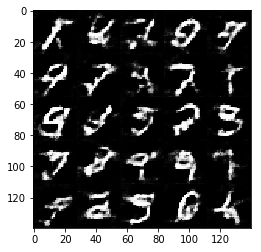

Epoch 1/2... Batch 610  Discriminator Loss: 1.3468... Generator Loss: 0.7565
Epoch 1/2... Batch 620  Discriminator Loss: 1.2948... Generator Loss: 0.8812
Epoch 1/2... Batch 630  Discriminator Loss: 1.3305... Generator Loss: 0.8032
Epoch 1/2... Batch 640  Discriminator Loss: 1.3082... Generator Loss: 1.0318
Epoch 1/2... Batch 650  Discriminator Loss: 1.3843... Generator Loss: 0.8220
Epoch 1/2... Batch 660  Discriminator Loss: 1.5766... Generator Loss: 0.5611
Epoch 1/2... Batch 670  Discriminator Loss: 1.3369... Generator Loss: 0.6561
Epoch 1/2... Batch 680  Discriminator Loss: 1.4229... Generator Loss: 0.7487
Epoch 1/2... Batch 690  Discriminator Loss: 1.3079... Generator Loss: 0.8618
Epoch 1/2... Batch 700  Discriminator Loss: 1.4759... Generator Loss: 1.0133


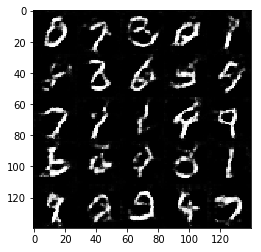

Epoch 1/2... Batch 710  Discriminator Loss: 1.4139... Generator Loss: 0.6344
Epoch 1/2... Batch 720  Discriminator Loss: 1.4945... Generator Loss: 0.6736
Epoch 1/2... Batch 730  Discriminator Loss: 1.3985... Generator Loss: 1.0230
Epoch 1/2... Batch 740  Discriminator Loss: 1.3291... Generator Loss: 1.2151
Epoch 1/2... Batch 750  Discriminator Loss: 1.3812... Generator Loss: 0.9332
Epoch 1/2... Batch 760  Discriminator Loss: 1.3103... Generator Loss: 0.7235
Epoch 1/2... Batch 770  Discriminator Loss: 1.4938... Generator Loss: 0.6050
Epoch 1/2... Batch 780  Discriminator Loss: 1.3482... Generator Loss: 0.8679
Epoch 1/2... Batch 790  Discriminator Loss: 1.3275... Generator Loss: 0.9760
Epoch 1/2... Batch 800  Discriminator Loss: 1.5106... Generator Loss: 0.5249


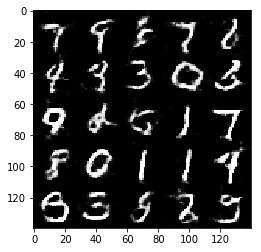

Epoch 1/2... Batch 810  Discriminator Loss: 1.4172... Generator Loss: 0.6712
Epoch 1/2... Batch 820  Discriminator Loss: 1.3336... Generator Loss: 0.7340
Epoch 1/2... Batch 830  Discriminator Loss: 1.3987... Generator Loss: 1.2491
Epoch 1/2... Batch 840  Discriminator Loss: 1.1503... Generator Loss: 1.2891
Epoch 1/2... Batch 850  Discriminator Loss: 1.3422... Generator Loss: 0.7985
Epoch 1/2... Batch 860  Discriminator Loss: 1.6132... Generator Loss: 0.5247
Epoch 1/2... Batch 870  Discriminator Loss: 1.6160... Generator Loss: 0.9690
Epoch 1/2... Batch 880  Discriminator Loss: 1.2825... Generator Loss: 0.9425
Epoch 1/2... Batch 890  Discriminator Loss: 1.2930... Generator Loss: 1.0428
Epoch 1/2... Batch 900  Discriminator Loss: 1.2603... Generator Loss: 0.8181


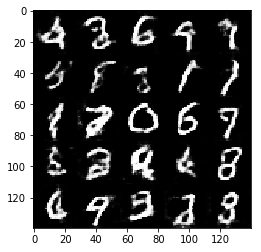

Epoch 1/2... Batch 910  Discriminator Loss: 1.3729... Generator Loss: 0.8209
Epoch 1/2... Batch 920  Discriminator Loss: 1.3569... Generator Loss: 0.9890
Epoch 1/2... Batch 930  Discriminator Loss: 1.4524... Generator Loss: 0.6276
Epoch 2/2... Batch 10  Discriminator Loss: 1.3067... Generator Loss: 0.9549
Epoch 2/2... Batch 20  Discriminator Loss: 1.4887... Generator Loss: 0.5381
Epoch 2/2... Batch 30  Discriminator Loss: 1.3426... Generator Loss: 0.7347
Epoch 2/2... Batch 40  Discriminator Loss: 1.3203... Generator Loss: 0.7249
Epoch 2/2... Batch 50  Discriminator Loss: 1.3889... Generator Loss: 0.9330
Epoch 2/2... Batch 60  Discriminator Loss: 1.4431... Generator Loss: 0.9428
Epoch 2/2... Batch 70  Discriminator Loss: 1.4395... Generator Loss: 0.5695
Epoch 2/2... Batch 80  Discriminator Loss: 1.3897... Generator Loss: 0.8041
Epoch 2/2... Batch 90  Discriminator Loss: 1.3478... Generator Loss: 0.9324
Epoch 2/2... Batch 100  Discriminator Loss: 1.4356... Generator Loss: 0.6739


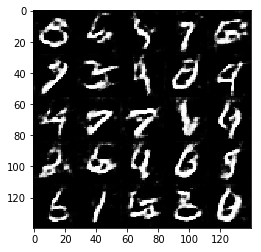

Epoch 2/2... Batch 110  Discriminator Loss: 1.2177... Generator Loss: 0.8389
Epoch 2/2... Batch 120  Discriminator Loss: 1.3762... Generator Loss: 0.6579
Epoch 2/2... Batch 130  Discriminator Loss: 1.1625... Generator Loss: 0.9861
Epoch 2/2... Batch 140  Discriminator Loss: 1.3567... Generator Loss: 0.6183
Epoch 2/2... Batch 150  Discriminator Loss: 1.4474... Generator Loss: 0.9292
Epoch 2/2... Batch 160  Discriminator Loss: 1.3495... Generator Loss: 0.8733
Epoch 2/2... Batch 170  Discriminator Loss: 1.4260... Generator Loss: 1.2522
Epoch 2/2... Batch 180  Discriminator Loss: 1.3252... Generator Loss: 1.3393
Epoch 2/2... Batch 190  Discriminator Loss: 1.3012... Generator Loss: 0.8120
Epoch 2/2... Batch 200  Discriminator Loss: 1.3558... Generator Loss: 1.4188


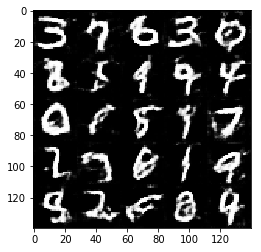

Epoch 2/2... Batch 210  Discriminator Loss: 1.3103... Generator Loss: 0.8859
Epoch 2/2... Batch 220  Discriminator Loss: 1.3449... Generator Loss: 1.0498
Epoch 2/2... Batch 230  Discriminator Loss: 1.3834... Generator Loss: 0.9628
Epoch 2/2... Batch 240  Discriminator Loss: 1.6867... Generator Loss: 0.6316
Epoch 2/2... Batch 250  Discriminator Loss: 1.2361... Generator Loss: 0.9183
Epoch 2/2... Batch 260  Discriminator Loss: 1.2786... Generator Loss: 1.2328
Epoch 2/2... Batch 270  Discriminator Loss: 1.2184... Generator Loss: 0.9004
Epoch 2/2... Batch 280  Discriminator Loss: 1.5782... Generator Loss: 0.5947
Epoch 2/2... Batch 290  Discriminator Loss: 1.4073... Generator Loss: 0.6143
Epoch 2/2... Batch 300  Discriminator Loss: 1.3832... Generator Loss: 0.6997


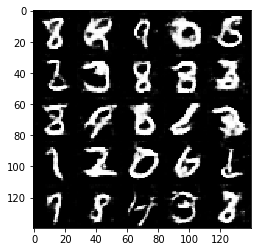

Epoch 2/2... Batch 310  Discriminator Loss: 1.3497... Generator Loss: 1.0541
Epoch 2/2... Batch 320  Discriminator Loss: 1.4720... Generator Loss: 0.6074
Epoch 2/2... Batch 330  Discriminator Loss: 1.3070... Generator Loss: 0.8880
Epoch 2/2... Batch 340  Discriminator Loss: 1.3302... Generator Loss: 0.7846
Epoch 2/2... Batch 350  Discriminator Loss: 1.2537... Generator Loss: 0.8157
Epoch 2/2... Batch 360  Discriminator Loss: 1.3679... Generator Loss: 0.7370
Epoch 2/2... Batch 370  Discriminator Loss: 1.4101... Generator Loss: 0.7188
Epoch 2/2... Batch 380  Discriminator Loss: 1.2149... Generator Loss: 1.0858
Epoch 2/2... Batch 390  Discriminator Loss: 1.3295... Generator Loss: 0.7294
Epoch 2/2... Batch 400  Discriminator Loss: 1.4326... Generator Loss: 0.7869


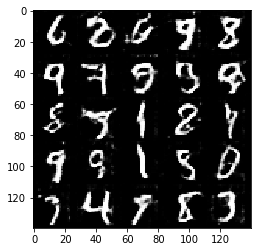

Epoch 2/2... Batch 410  Discriminator Loss: 1.4309... Generator Loss: 1.0548
Epoch 2/2... Batch 420  Discriminator Loss: 1.2627... Generator Loss: 1.0050
Epoch 2/2... Batch 430  Discriminator Loss: 1.4892... Generator Loss: 0.5073
Epoch 2/2... Batch 440  Discriminator Loss: 1.2406... Generator Loss: 0.9818
Epoch 2/2... Batch 450  Discriminator Loss: 1.2722... Generator Loss: 0.9300
Epoch 2/2... Batch 460  Discriminator Loss: 1.4112... Generator Loss: 0.6315
Epoch 2/2... Batch 470  Discriminator Loss: 1.3049... Generator Loss: 0.8902
Epoch 2/2... Batch 480  Discriminator Loss: 1.2967... Generator Loss: 0.9579
Epoch 2/2... Batch 490  Discriminator Loss: 1.4070... Generator Loss: 0.6981
Epoch 2/2... Batch 500  Discriminator Loss: 1.3476... Generator Loss: 0.7651


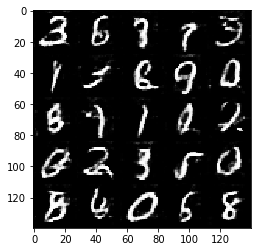

Epoch 2/2... Batch 510  Discriminator Loss: 1.2618... Generator Loss: 0.8701
Epoch 2/2... Batch 520  Discriminator Loss: 1.3094... Generator Loss: 1.0558
Epoch 2/2... Batch 530  Discriminator Loss: 1.3533... Generator Loss: 1.2331
Epoch 2/2... Batch 540  Discriminator Loss: 1.3104... Generator Loss: 0.7259
Epoch 2/2... Batch 550  Discriminator Loss: 1.2893... Generator Loss: 0.9562
Epoch 2/2... Batch 560  Discriminator Loss: 1.4890... Generator Loss: 0.6961
Epoch 2/2... Batch 570  Discriminator Loss: 1.4021... Generator Loss: 0.6445
Epoch 2/2... Batch 580  Discriminator Loss: 1.3540... Generator Loss: 0.8021
Epoch 2/2... Batch 590  Discriminator Loss: 1.3833... Generator Loss: 0.6096
Epoch 2/2... Batch 600  Discriminator Loss: 1.3238... Generator Loss: 1.0275


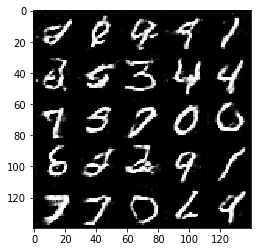

Epoch 2/2... Batch 610  Discriminator Loss: 1.3513... Generator Loss: 0.7324
Epoch 2/2... Batch 620  Discriminator Loss: 1.3615... Generator Loss: 0.7155
Epoch 2/2... Batch 630  Discriminator Loss: 1.4502... Generator Loss: 0.5815
Epoch 2/2... Batch 640  Discriminator Loss: 1.1912... Generator Loss: 0.8000
Epoch 2/2... Batch 650  Discriminator Loss: 1.5990... Generator Loss: 0.4521
Epoch 2/2... Batch 660  Discriminator Loss: 1.3654... Generator Loss: 0.8428
Epoch 2/2... Batch 670  Discriminator Loss: 1.3421... Generator Loss: 1.0344
Epoch 2/2... Batch 680  Discriminator Loss: 1.4916... Generator Loss: 0.5372
Epoch 2/2... Batch 690  Discriminator Loss: 1.2511... Generator Loss: 0.9596
Epoch 2/2... Batch 700  Discriminator Loss: 1.3389... Generator Loss: 1.1122


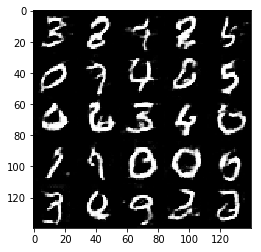

Epoch 2/2... Batch 710  Discriminator Loss: 1.2900... Generator Loss: 0.7702
Epoch 2/2... Batch 720  Discriminator Loss: 1.3635... Generator Loss: 0.7597
Epoch 2/2... Batch 730  Discriminator Loss: 1.1868... Generator Loss: 0.9955
Epoch 2/2... Batch 740  Discriminator Loss: 1.1706... Generator Loss: 0.9575
Epoch 2/2... Batch 750  Discriminator Loss: 1.2736... Generator Loss: 1.1491
Epoch 2/2... Batch 760  Discriminator Loss: 1.3438... Generator Loss: 0.6835
Epoch 2/2... Batch 770  Discriminator Loss: 1.2411... Generator Loss: 0.8868
Epoch 2/2... Batch 780  Discriminator Loss: 1.4242... Generator Loss: 0.9278
Epoch 2/2... Batch 790  Discriminator Loss: 1.2714... Generator Loss: 0.8650
Epoch 2/2... Batch 800  Discriminator Loss: 1.4906... Generator Loss: 0.4924


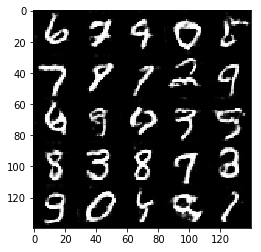

Epoch 2/2... Batch 810  Discriminator Loss: 1.3291... Generator Loss: 0.8623
Epoch 2/2... Batch 820  Discriminator Loss: 1.3278... Generator Loss: 1.2029
Epoch 2/2... Batch 830  Discriminator Loss: 1.3151... Generator Loss: 0.7150
Epoch 2/2... Batch 840  Discriminator Loss: 0.9886... Generator Loss: 1.2906
Epoch 2/2... Batch 850  Discriminator Loss: 1.0955... Generator Loss: 1.1167
Epoch 2/2... Batch 860  Discriminator Loss: 1.1170... Generator Loss: 1.0771
Epoch 2/2... Batch 870  Discriminator Loss: 1.5756... Generator Loss: 0.9049
Epoch 2/2... Batch 880  Discriminator Loss: 1.4063... Generator Loss: 0.5833
Epoch 2/2... Batch 890  Discriminator Loss: 1.3768... Generator Loss: 0.8133
Epoch 2/2... Batch 900  Discriminator Loss: 1.3019... Generator Loss: 0.8715


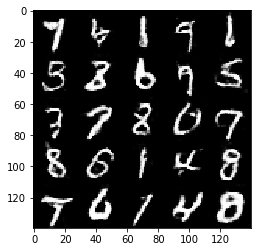

Epoch 2/2... Batch 910  Discriminator Loss: 1.2606... Generator Loss: 0.6257
Epoch 2/2... Batch 920  Discriminator Loss: 1.1744... Generator Loss: 0.9974
Epoch 2/2... Batch 930  Discriminator Loss: 1.3268... Generator Loss: 0.8731


In [22]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### 调参记录

初始参数：
* batch_size = 64
* z_dim = 100
* learning_rate = 0.001
* beta1 = 0.5

模型架构（filter =5, stride = 1 or 2）：
* Discriminator：28x28x1 ---> 14x14x64 ---> 7x7x256 ---> 7x7x512
* Generator: 7x7x512 ---> 7x7x256 ---> 14x14x64 ---> 28x28x1

第一次结果：Discriminator Loss: 0.8251... Generator Loss: 0.9614 效果不是很好，基本形状出来了，但是图片灰蒙蒙的

调整beta1：
* 0.3 ---> Discriminator Loss: 0.8399... Generator Loss: 0.8489 与0.5的结果接近
* 0.1 ---> Discriminator Loss: 2.1238... Generator Loss: 3.7789 非常糟糕

调整结构：减小辨别器的大小
* Discriminator：28x28x1 ---> 14x14x64 ---> 7x7x128 ---> 7x7x256
* 保持初始参数 --->  Discriminator Loss: 1.6704... Generator Loss: 0.2734 
* 辨别器的loss从一开始就比生成器的loss就来得大，不太合理，感觉互换了竞争地位，还是换回之前的模型结构

调整学习率：
* 0.005 ---> Discriminator Loss: 1.1054... Generator Loss: 1.7795
* 0.0005 ---> Discriminator Loss: 0.9000... Generator Loss: 0.6375
* 0.0001 ---> Discriminator Loss: 0.6731... Generator Loss: 0.9542

z_dim：
* 128 ---> Discriminator Loss: 0.1254... Generator Loss: 2.7208 糟糕
* 增加z_dim会更多的增加noise信息

加入dropout感觉提升也不大 Discriminator Loss: 1.1555... Generator Loss: 0.8900

尝试增加迭代次数到3

感觉差别也不大 Discriminator Loss: 0.6617... Generator Loss: 1.0947

根据审阅老师的建议，增加了卷积网络的权重初始化，增加了d_loss的计算平滑，对数据进行了放缩（摆脱了之前图片灰蒙蒙的样子）

目前的loss为：稳定在Discriminator Loss: 1.2-1.4... Generator Loss: 0.7-0.9 Excellent!

### CelebA
在 CelebA 上运行你的 GANs 模型。在一般的GPU上运行每次迭代大约需要 20 分钟。你可以运行整个迭代，或者当 GANs 开始产生真实人脸图像时停止它。

Epoch 1/3... Batch 10  Discriminator Loss: 1.2115... Generator Loss: 1.5248
Epoch 1/3... Batch 20  Discriminator Loss: 1.9405... Generator Loss: 0.6462
Epoch 1/3... Batch 30  Discriminator Loss: 3.6731... Generator Loss: 0.2453
Epoch 1/3... Batch 40  Discriminator Loss: 1.7223... Generator Loss: 0.6057
Epoch 1/3... Batch 50  Discriminator Loss: 2.3389... Generator Loss: 0.1931
Epoch 1/3... Batch 60  Discriminator Loss: 1.3297... Generator Loss: 1.6193
Epoch 1/3... Batch 70  Discriminator Loss: 2.8518... Generator Loss: 0.1680
Epoch 1/3... Batch 80  Discriminator Loss: 2.4531... Generator Loss: 0.2130
Epoch 1/3... Batch 90  Discriminator Loss: 1.2981... Generator Loss: 1.4584
Epoch 1/3... Batch 100  Discriminator Loss: 1.6343... Generator Loss: 0.6648


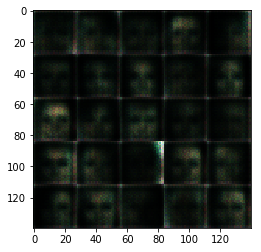

Epoch 1/3... Batch 110  Discriminator Loss: 2.1845... Generator Loss: 0.8512
Epoch 1/3... Batch 120  Discriminator Loss: 1.9541... Generator Loss: 0.5157
Epoch 1/3... Batch 130  Discriminator Loss: 1.9722... Generator Loss: 0.5076
Epoch 1/3... Batch 140  Discriminator Loss: 0.9135... Generator Loss: 1.8038
Epoch 1/3... Batch 150  Discriminator Loss: 1.1755... Generator Loss: 1.3146
Epoch 1/3... Batch 160  Discriminator Loss: 1.6851... Generator Loss: 0.5875
Epoch 1/3... Batch 170  Discriminator Loss: 2.1325... Generator Loss: 0.2475
Epoch 1/3... Batch 180  Discriminator Loss: 2.0633... Generator Loss: 0.2858
Epoch 1/3... Batch 190  Discriminator Loss: 0.5516... Generator Loss: 2.3470
Epoch 1/3... Batch 200  Discriminator Loss: 1.8524... Generator Loss: 0.4235


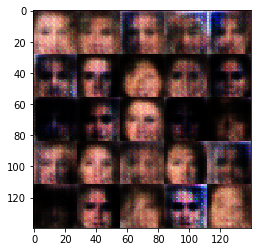

Epoch 1/3... Batch 210  Discriminator Loss: 1.5055... Generator Loss: 0.7165
Epoch 1/3... Batch 220  Discriminator Loss: 1.3766... Generator Loss: 0.9411
Epoch 1/3... Batch 230  Discriminator Loss: 1.6069... Generator Loss: 0.7454
Epoch 1/3... Batch 240  Discriminator Loss: 1.3536... Generator Loss: 0.9239
Epoch 1/3... Batch 250  Discriminator Loss: 1.1646... Generator Loss: 1.0169
Epoch 1/3... Batch 260  Discriminator Loss: 1.5339... Generator Loss: 0.8095
Epoch 1/3... Batch 270  Discriminator Loss: 1.4510... Generator Loss: 0.7384
Epoch 1/3... Batch 280  Discriminator Loss: 1.9922... Generator Loss: 0.3889
Epoch 1/3... Batch 290  Discriminator Loss: 1.3988... Generator Loss: 0.6076
Epoch 1/3... Batch 300  Discriminator Loss: 1.4691... Generator Loss: 0.6003


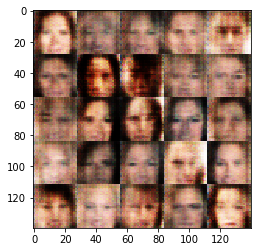

Epoch 1/3... Batch 310  Discriminator Loss: 1.8233... Generator Loss: 0.6377
Epoch 1/3... Batch 320  Discriminator Loss: 1.1222... Generator Loss: 2.0573
Epoch 1/3... Batch 330  Discriminator Loss: 1.5125... Generator Loss: 0.8328
Epoch 1/3... Batch 340  Discriminator Loss: 1.5569... Generator Loss: 0.7651
Epoch 1/3... Batch 350  Discriminator Loss: 1.5277... Generator Loss: 0.7475
Epoch 1/3... Batch 360  Discriminator Loss: 1.7685... Generator Loss: 0.8820
Epoch 1/3... Batch 370  Discriminator Loss: 1.5610... Generator Loss: 0.5346
Epoch 1/3... Batch 380  Discriminator Loss: 1.5669... Generator Loss: 0.8540
Epoch 1/3... Batch 390  Discriminator Loss: 1.8144... Generator Loss: 0.6676
Epoch 1/3... Batch 400  Discriminator Loss: 1.5360... Generator Loss: 0.6488


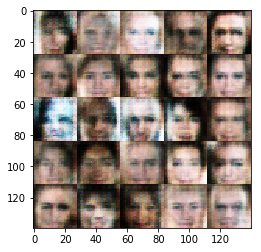

Epoch 1/3... Batch 410  Discriminator Loss: 1.3761... Generator Loss: 0.8338
Epoch 1/3... Batch 420  Discriminator Loss: 1.3720... Generator Loss: 0.8423
Epoch 1/3... Batch 430  Discriminator Loss: 1.3440... Generator Loss: 0.8140
Epoch 1/3... Batch 440  Discriminator Loss: 1.4375... Generator Loss: 0.9776
Epoch 1/3... Batch 450  Discriminator Loss: 1.5140... Generator Loss: 0.6799
Epoch 1/3... Batch 460  Discriminator Loss: 1.3141... Generator Loss: 0.7173
Epoch 1/3... Batch 470  Discriminator Loss: 1.4957... Generator Loss: 0.6676
Epoch 1/3... Batch 480  Discriminator Loss: 1.1672... Generator Loss: 1.1536
Epoch 1/3... Batch 490  Discriminator Loss: 1.4209... Generator Loss: 1.0291
Epoch 1/3... Batch 500  Discriminator Loss: 1.5152... Generator Loss: 0.6822


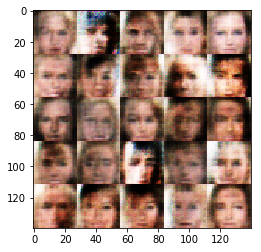

Epoch 1/3... Batch 510  Discriminator Loss: 1.3872... Generator Loss: 0.9097
Epoch 1/3... Batch 520  Discriminator Loss: 1.3335... Generator Loss: 0.8283
Epoch 1/3... Batch 530  Discriminator Loss: 1.4014... Generator Loss: 0.9294
Epoch 1/3... Batch 540  Discriminator Loss: 1.5751... Generator Loss: 0.5025
Epoch 1/3... Batch 550  Discriminator Loss: 1.6162... Generator Loss: 0.6402
Epoch 1/3... Batch 560  Discriminator Loss: 1.4570... Generator Loss: 0.8418
Epoch 1/3... Batch 570  Discriminator Loss: 1.8743... Generator Loss: 0.7050
Epoch 1/3... Batch 580  Discriminator Loss: 1.2654... Generator Loss: 0.7746
Epoch 1/3... Batch 590  Discriminator Loss: 1.4023... Generator Loss: 0.8201
Epoch 1/3... Batch 600  Discriminator Loss: 1.4003... Generator Loss: 0.9353


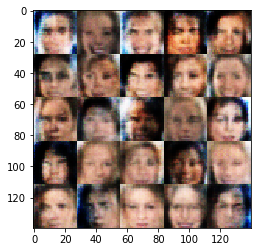

Epoch 1/3... Batch 610  Discriminator Loss: 1.2960... Generator Loss: 0.8946
Epoch 1/3... Batch 620  Discriminator Loss: 1.2364... Generator Loss: 0.7683
Epoch 1/3... Batch 630  Discriminator Loss: 1.1433... Generator Loss: 1.4115
Epoch 1/3... Batch 640  Discriminator Loss: 1.7714... Generator Loss: 0.6413
Epoch 1/3... Batch 650  Discriminator Loss: 1.4730... Generator Loss: 0.8012
Epoch 1/3... Batch 660  Discriminator Loss: 1.2733... Generator Loss: 1.6777
Epoch 1/3... Batch 670  Discriminator Loss: 1.0288... Generator Loss: 1.2907
Epoch 1/3... Batch 680  Discriminator Loss: 1.4785... Generator Loss: 1.4629
Epoch 1/3... Batch 690  Discriminator Loss: 1.5512... Generator Loss: 0.7885
Epoch 1/3... Batch 700  Discriminator Loss: 1.3005... Generator Loss: 1.0756


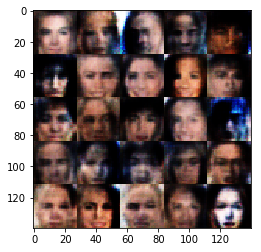

Epoch 1/3... Batch 710  Discriminator Loss: 1.1415... Generator Loss: 1.1558
Epoch 1/3... Batch 720  Discriminator Loss: 1.5284... Generator Loss: 1.1594
Epoch 1/3... Batch 730  Discriminator Loss: 1.2542... Generator Loss: 1.0307
Epoch 1/3... Batch 740  Discriminator Loss: 1.5477... Generator Loss: 0.6311
Epoch 1/3... Batch 750  Discriminator Loss: 1.5123... Generator Loss: 0.6482
Epoch 1/3... Batch 760  Discriminator Loss: 1.6779... Generator Loss: 0.5824
Epoch 1/3... Batch 770  Discriminator Loss: 1.6002... Generator Loss: 0.7740
Epoch 1/3... Batch 780  Discriminator Loss: 1.3952... Generator Loss: 1.1074
Epoch 1/3... Batch 790  Discriminator Loss: 0.9805... Generator Loss: 1.4949
Epoch 1/3... Batch 800  Discriminator Loss: 1.3628... Generator Loss: 0.8112


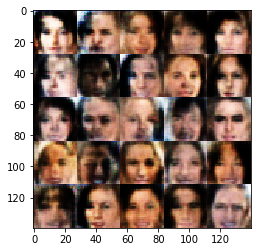

Epoch 1/3... Batch 810  Discriminator Loss: 1.4831... Generator Loss: 0.8823
Epoch 1/3... Batch 820  Discriminator Loss: 1.5711... Generator Loss: 0.7207
Epoch 1/3... Batch 830  Discriminator Loss: 1.5298... Generator Loss: 0.6622
Epoch 1/3... Batch 840  Discriminator Loss: 1.3070... Generator Loss: 0.9274
Epoch 1/3... Batch 850  Discriminator Loss: 1.5108... Generator Loss: 1.0278
Epoch 1/3... Batch 860  Discriminator Loss: 1.5795... Generator Loss: 0.7446
Epoch 1/3... Batch 870  Discriminator Loss: 1.5483... Generator Loss: 1.1663
Epoch 1/3... Batch 880  Discriminator Loss: 1.7073... Generator Loss: 0.5900
Epoch 1/3... Batch 890  Discriminator Loss: 1.3564... Generator Loss: 0.7881
Epoch 1/3... Batch 900  Discriminator Loss: 1.2896... Generator Loss: 1.0580


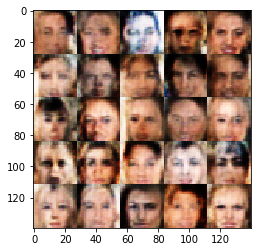

Epoch 1/3... Batch 910  Discriminator Loss: 1.1108... Generator Loss: 1.8433
Epoch 1/3... Batch 920  Discriminator Loss: 1.5374... Generator Loss: 0.6690
Epoch 1/3... Batch 930  Discriminator Loss: 1.2722... Generator Loss: 0.6709
Epoch 1/3... Batch 940  Discriminator Loss: 1.5990... Generator Loss: 0.7263
Epoch 1/3... Batch 950  Discriminator Loss: 1.5372... Generator Loss: 0.8007
Epoch 1/3... Batch 960  Discriminator Loss: 1.3975... Generator Loss: 0.8384
Epoch 1/3... Batch 970  Discriminator Loss: 1.1756... Generator Loss: 0.9768
Epoch 1/3... Batch 980  Discriminator Loss: 1.4310... Generator Loss: 0.8622
Epoch 1/3... Batch 990  Discriminator Loss: 1.5833... Generator Loss: 0.8628
Epoch 1/3... Batch 1000  Discriminator Loss: 1.3363... Generator Loss: 0.9547


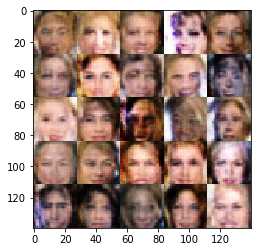

Epoch 1/3... Batch 1010  Discriminator Loss: 1.3970... Generator Loss: 0.6948
Epoch 1/3... Batch 1020  Discriminator Loss: 1.4217... Generator Loss: 0.6930
Epoch 1/3... Batch 1030  Discriminator Loss: 1.2104... Generator Loss: 0.7784
Epoch 1/3... Batch 1040  Discriminator Loss: 1.5151... Generator Loss: 1.0598
Epoch 1/3... Batch 1050  Discriminator Loss: 1.2939... Generator Loss: 0.6826
Epoch 1/3... Batch 1060  Discriminator Loss: 1.0312... Generator Loss: 1.1900
Epoch 1/3... Batch 1070  Discriminator Loss: 1.4481... Generator Loss: 0.6423
Epoch 1/3... Batch 1080  Discriminator Loss: 1.5263... Generator Loss: 0.9687
Epoch 1/3... Batch 1090  Discriminator Loss: 1.3585... Generator Loss: 1.2190
Epoch 1/3... Batch 1100  Discriminator Loss: 1.1672... Generator Loss: 1.0243


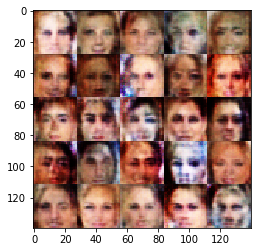

Epoch 1/3... Batch 1110  Discriminator Loss: 1.4951... Generator Loss: 0.6387
Epoch 1/3... Batch 1120  Discriminator Loss: 1.6863... Generator Loss: 0.6584
Epoch 1/3... Batch 1130  Discriminator Loss: 1.5950... Generator Loss: 0.6494
Epoch 1/3... Batch 1140  Discriminator Loss: 1.5743... Generator Loss: 0.6532
Epoch 1/3... Batch 1150  Discriminator Loss: 1.3767... Generator Loss: 0.7978
Epoch 1/3... Batch 1160  Discriminator Loss: 1.2741... Generator Loss: 1.0219
Epoch 1/3... Batch 1170  Discriminator Loss: 1.5590... Generator Loss: 0.5073
Epoch 1/3... Batch 1180  Discriminator Loss: 1.2949... Generator Loss: 1.0284
Epoch 1/3... Batch 1190  Discriminator Loss: 1.4784... Generator Loss: 0.6016
Epoch 1/3... Batch 1200  Discriminator Loss: 1.0358... Generator Loss: 2.7007


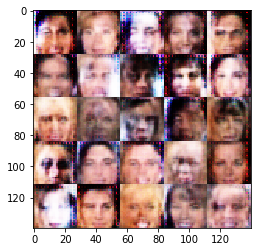

Epoch 1/3... Batch 1210  Discriminator Loss: 1.6858... Generator Loss: 0.4831
Epoch 1/3... Batch 1220  Discriminator Loss: 1.4852... Generator Loss: 0.7290
Epoch 1/3... Batch 1230  Discriminator Loss: 1.4347... Generator Loss: 0.6788
Epoch 1/3... Batch 1240  Discriminator Loss: 1.1202... Generator Loss: 1.9879
Epoch 1/3... Batch 1250  Discriminator Loss: 1.3098... Generator Loss: 0.7409
Epoch 1/3... Batch 1260  Discriminator Loss: 1.4458... Generator Loss: 0.7206
Epoch 1/3... Batch 1270  Discriminator Loss: 1.6603... Generator Loss: 1.2343
Epoch 1/3... Batch 1280  Discriminator Loss: 1.4936... Generator Loss: 0.6739
Epoch 1/3... Batch 1290  Discriminator Loss: 1.3659... Generator Loss: 0.8362
Epoch 1/3... Batch 1300  Discriminator Loss: 1.1757... Generator Loss: 1.0393


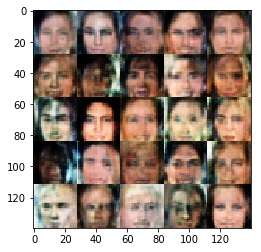

Epoch 1/3... Batch 1310  Discriminator Loss: 1.3497... Generator Loss: 0.9017
Epoch 1/3... Batch 1320  Discriminator Loss: 1.6300... Generator Loss: 0.6018
Epoch 1/3... Batch 1330  Discriminator Loss: 1.5347... Generator Loss: 0.5410
Epoch 1/3... Batch 1340  Discriminator Loss: 1.5709... Generator Loss: 0.4470
Epoch 1/3... Batch 1350  Discriminator Loss: 1.4242... Generator Loss: 0.9163
Epoch 1/3... Batch 1360  Discriminator Loss: 1.3119... Generator Loss: 0.9216
Epoch 1/3... Batch 1370  Discriminator Loss: 1.4250... Generator Loss: 0.9518
Epoch 1/3... Batch 1380  Discriminator Loss: 1.5711... Generator Loss: 0.5863
Epoch 1/3... Batch 1390  Discriminator Loss: 1.5402... Generator Loss: 0.6273
Epoch 1/3... Batch 1400  Discriminator Loss: 1.2376... Generator Loss: 0.9944


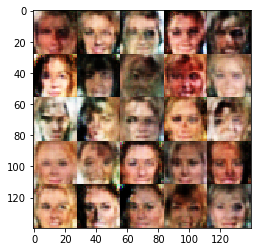

Epoch 1/3... Batch 1410  Discriminator Loss: 1.4449... Generator Loss: 0.6527
Epoch 1/3... Batch 1420  Discriminator Loss: 1.3509... Generator Loss: 0.9454
Epoch 1/3... Batch 1430  Discriminator Loss: 1.7281... Generator Loss: 0.8028
Epoch 1/3... Batch 1440  Discriminator Loss: 1.3180... Generator Loss: 0.9105
Epoch 1/3... Batch 1450  Discriminator Loss: 1.5223... Generator Loss: 0.7369
Epoch 1/3... Batch 1460  Discriminator Loss: 1.4311... Generator Loss: 0.6754
Epoch 1/3... Batch 1470  Discriminator Loss: 1.6733... Generator Loss: 0.5348
Epoch 1/3... Batch 1480  Discriminator Loss: 1.4064... Generator Loss: 0.9243
Epoch 1/3... Batch 1490  Discriminator Loss: 1.1972... Generator Loss: 1.0538
Epoch 1/3... Batch 1500  Discriminator Loss: 1.1247... Generator Loss: 1.4432


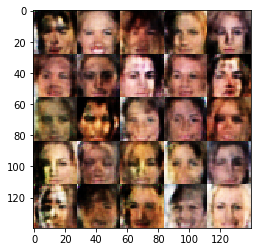

Epoch 1/3... Batch 1510  Discriminator Loss: 1.3529... Generator Loss: 0.7436
Epoch 1/3... Batch 1520  Discriminator Loss: 1.2891... Generator Loss: 0.6169
Epoch 1/3... Batch 1530  Discriminator Loss: 1.3608... Generator Loss: 0.9743
Epoch 1/3... Batch 1540  Discriminator Loss: 1.6533... Generator Loss: 0.7660
Epoch 1/3... Batch 1550  Discriminator Loss: 1.5320... Generator Loss: 0.7474
Epoch 1/3... Batch 1560  Discriminator Loss: 1.3949... Generator Loss: 0.9836
Epoch 1/3... Batch 1570  Discriminator Loss: 1.0900... Generator Loss: 1.2250
Epoch 1/3... Batch 1580  Discriminator Loss: 1.4401... Generator Loss: 0.7701
Epoch 1/3... Batch 1590  Discriminator Loss: 1.5128... Generator Loss: 0.6671
Epoch 1/3... Batch 1600  Discriminator Loss: 1.3341... Generator Loss: 0.7253


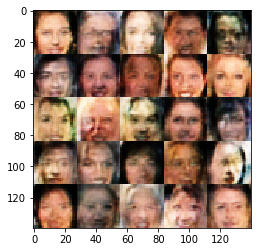

Epoch 1/3... Batch 1610  Discriminator Loss: 1.3891... Generator Loss: 0.8566
Epoch 1/3... Batch 1620  Discriminator Loss: 1.3038... Generator Loss: 0.7219
Epoch 1/3... Batch 1630  Discriminator Loss: 1.2580... Generator Loss: 0.8298
Epoch 1/3... Batch 1640  Discriminator Loss: 1.3454... Generator Loss: 0.6675
Epoch 1/3... Batch 1650  Discriminator Loss: 1.4560... Generator Loss: 0.6681
Epoch 1/3... Batch 1660  Discriminator Loss: 1.4123... Generator Loss: 0.9073
Epoch 1/3... Batch 1670  Discriminator Loss: 1.3375... Generator Loss: 0.7142
Epoch 1/3... Batch 1680  Discriminator Loss: 1.4531... Generator Loss: 0.7063
Epoch 1/3... Batch 1690  Discriminator Loss: 1.4646... Generator Loss: 0.7556
Epoch 1/3... Batch 1700  Discriminator Loss: 1.2970... Generator Loss: 0.7476


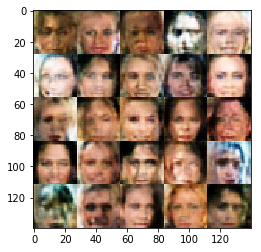

Epoch 1/3... Batch 1710  Discriminator Loss: 1.4642... Generator Loss: 0.7265
Epoch 1/3... Batch 1720  Discriminator Loss: 1.0759... Generator Loss: 1.1718
Epoch 1/3... Batch 1730  Discriminator Loss: 1.2062... Generator Loss: 1.1605
Epoch 1/3... Batch 1740  Discriminator Loss: 1.3601... Generator Loss: 1.0906
Epoch 1/3... Batch 1750  Discriminator Loss: 1.5997... Generator Loss: 0.5434
Epoch 1/3... Batch 1760  Discriminator Loss: 1.3110... Generator Loss: 1.1469
Epoch 1/3... Batch 1770  Discriminator Loss: 1.2253... Generator Loss: 1.1993
Epoch 1/3... Batch 1780  Discriminator Loss: 1.2890... Generator Loss: 0.5958
Epoch 1/3... Batch 1790  Discriminator Loss: 1.3355... Generator Loss: 0.8078
Epoch 1/3... Batch 1800  Discriminator Loss: 1.4901... Generator Loss: 0.7303


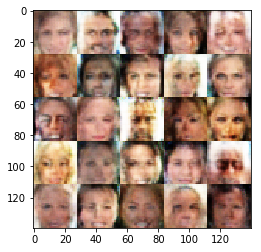

Epoch 1/3... Batch 1810  Discriminator Loss: 1.4252... Generator Loss: 0.7086
Epoch 1/3... Batch 1820  Discriminator Loss: 1.4452... Generator Loss: 0.8962
Epoch 1/3... Batch 1830  Discriminator Loss: 1.4049... Generator Loss: 1.0339
Epoch 1/3... Batch 1840  Discriminator Loss: 1.3374... Generator Loss: 1.0243
Epoch 1/3... Batch 1850  Discriminator Loss: 1.4495... Generator Loss: 0.5324
Epoch 1/3... Batch 1860  Discriminator Loss: 1.2357... Generator Loss: 0.8284
Epoch 1/3... Batch 1870  Discriminator Loss: 1.5319... Generator Loss: 0.4880
Epoch 1/3... Batch 1880  Discriminator Loss: 1.2729... Generator Loss: 1.0794
Epoch 1/3... Batch 1890  Discriminator Loss: 1.3714... Generator Loss: 0.4990
Epoch 1/3... Batch 1900  Discriminator Loss: 1.4461... Generator Loss: 0.7122


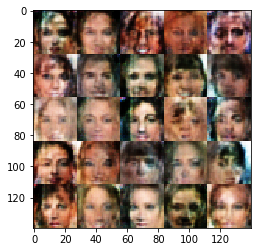

Epoch 1/3... Batch 1910  Discriminator Loss: 1.1630... Generator Loss: 1.1237
Epoch 1/3... Batch 1920  Discriminator Loss: 1.4757... Generator Loss: 0.7203
Epoch 1/3... Batch 1930  Discriminator Loss: 1.2081... Generator Loss: 1.2571
Epoch 1/3... Batch 1940  Discriminator Loss: 1.3474... Generator Loss: 0.9252
Epoch 1/3... Batch 1950  Discriminator Loss: 1.3418... Generator Loss: 1.3849
Epoch 1/3... Batch 1960  Discriminator Loss: 1.5614... Generator Loss: 0.7695
Epoch 1/3... Batch 1970  Discriminator Loss: 1.3394... Generator Loss: 0.6847
Epoch 1/3... Batch 1980  Discriminator Loss: 1.3047... Generator Loss: 0.8034
Epoch 1/3... Batch 1990  Discriminator Loss: 1.8495... Generator Loss: 0.3551
Epoch 1/3... Batch 2000  Discriminator Loss: 1.5406... Generator Loss: 0.7156


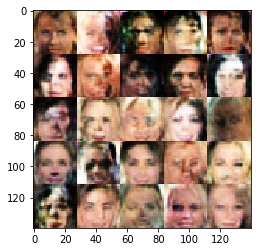

Epoch 1/3... Batch 2010  Discriminator Loss: 1.5612... Generator Loss: 0.6268
Epoch 1/3... Batch 2020  Discriminator Loss: 1.2971... Generator Loss: 0.9557
Epoch 1/3... Batch 2030  Discriminator Loss: 1.4777... Generator Loss: 0.6466
Epoch 1/3... Batch 2040  Discriminator Loss: 1.3373... Generator Loss: 0.7959
Epoch 1/3... Batch 2050  Discriminator Loss: 1.6088... Generator Loss: 0.5624
Epoch 1/3... Batch 2060  Discriminator Loss: 1.5118... Generator Loss: 0.8573
Epoch 1/3... Batch 2070  Discriminator Loss: 1.5134... Generator Loss: 0.9577
Epoch 1/3... Batch 2080  Discriminator Loss: 1.3716... Generator Loss: 1.0372
Epoch 1/3... Batch 2090  Discriminator Loss: 0.9369... Generator Loss: 1.4032
Epoch 1/3... Batch 2100  Discriminator Loss: 1.4658... Generator Loss: 0.5466


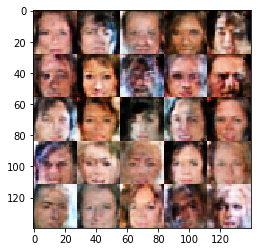

Epoch 1/3... Batch 2110  Discriminator Loss: 1.3932... Generator Loss: 1.5446
Epoch 1/3... Batch 2120  Discriminator Loss: 1.0991... Generator Loss: 2.1668
Epoch 1/3... Batch 2130  Discriminator Loss: 1.3082... Generator Loss: 0.6664
Epoch 1/3... Batch 2140  Discriminator Loss: 1.2942... Generator Loss: 1.0322
Epoch 1/3... Batch 2150  Discriminator Loss: 1.4720... Generator Loss: 0.6505
Epoch 1/3... Batch 2160  Discriminator Loss: 1.4689... Generator Loss: 0.5278
Epoch 1/3... Batch 2170  Discriminator Loss: 1.4799... Generator Loss: 0.7337
Epoch 1/3... Batch 2180  Discriminator Loss: 1.4624... Generator Loss: 0.8575
Epoch 1/3... Batch 2190  Discriminator Loss: 1.2309... Generator Loss: 1.3993
Epoch 1/3... Batch 2200  Discriminator Loss: 1.3529... Generator Loss: 0.7990


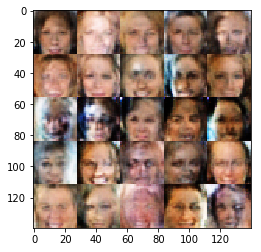

Epoch 1/3... Batch 2210  Discriminator Loss: 1.3777... Generator Loss: 0.7770
Epoch 1/3... Batch 2220  Discriminator Loss: 1.6108... Generator Loss: 0.7133
Epoch 1/3... Batch 2230  Discriminator Loss: 1.4131... Generator Loss: 0.5878
Epoch 1/3... Batch 2240  Discriminator Loss: 1.4931... Generator Loss: 0.7456
Epoch 1/3... Batch 2250  Discriminator Loss: 1.4068... Generator Loss: 0.5263
Epoch 1/3... Batch 2260  Discriminator Loss: 1.6117... Generator Loss: 0.5429
Epoch 1/3... Batch 2270  Discriminator Loss: 1.4795... Generator Loss: 0.7391
Epoch 1/3... Batch 2280  Discriminator Loss: 1.4057... Generator Loss: 0.6697
Epoch 1/3... Batch 2290  Discriminator Loss: 1.3838... Generator Loss: 0.8324
Epoch 1/3... Batch 2300  Discriminator Loss: 1.4506... Generator Loss: 1.5183


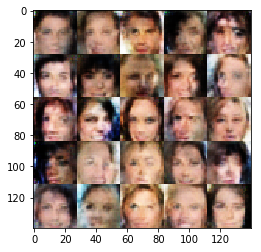

Epoch 1/3... Batch 2310  Discriminator Loss: 1.3665... Generator Loss: 0.7710
Epoch 1/3... Batch 2320  Discriminator Loss: 1.7121... Generator Loss: 0.5697
Epoch 1/3... Batch 2330  Discriminator Loss: 1.3026... Generator Loss: 0.8506
Epoch 1/3... Batch 2340  Discriminator Loss: 1.4794... Generator Loss: 0.8584
Epoch 1/3... Batch 2350  Discriminator Loss: 1.4896... Generator Loss: 0.7231
Epoch 1/3... Batch 2360  Discriminator Loss: 1.3560... Generator Loss: 0.7912
Epoch 1/3... Batch 2370  Discriminator Loss: 1.3752... Generator Loss: 0.9613
Epoch 1/3... Batch 2380  Discriminator Loss: 1.4428... Generator Loss: 0.9177
Epoch 1/3... Batch 2390  Discriminator Loss: 1.2531... Generator Loss: 0.8082
Epoch 1/3... Batch 2400  Discriminator Loss: 1.2820... Generator Loss: 0.8509


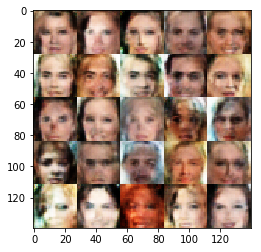

Epoch 1/3... Batch 2410  Discriminator Loss: 1.4951... Generator Loss: 0.6762
Epoch 1/3... Batch 2420  Discriminator Loss: 1.1732... Generator Loss: 0.9845
Epoch 1/3... Batch 2430  Discriminator Loss: 1.2495... Generator Loss: 0.8165
Epoch 1/3... Batch 2440  Discriminator Loss: 1.3629... Generator Loss: 0.6332
Epoch 1/3... Batch 2450  Discriminator Loss: 1.3784... Generator Loss: 0.5604
Epoch 1/3... Batch 2460  Discriminator Loss: 1.4651... Generator Loss: 0.5284
Epoch 1/3... Batch 2470  Discriminator Loss: 1.3221... Generator Loss: 0.7932
Epoch 1/3... Batch 2480  Discriminator Loss: 1.4417... Generator Loss: 0.7962
Epoch 1/3... Batch 2490  Discriminator Loss: 1.3036... Generator Loss: 0.7925
Epoch 1/3... Batch 2500  Discriminator Loss: 1.1710... Generator Loss: 1.3019


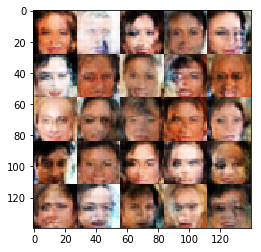

Epoch 1/3... Batch 2510  Discriminator Loss: 1.4257... Generator Loss: 0.7172
Epoch 1/3... Batch 2520  Discriminator Loss: 1.6278... Generator Loss: 0.5432
Epoch 1/3... Batch 2530  Discriminator Loss: 1.3459... Generator Loss: 0.9684
Epoch 1/3... Batch 2540  Discriminator Loss: 1.3808... Generator Loss: 0.7873
Epoch 1/3... Batch 2550  Discriminator Loss: 1.4070... Generator Loss: 0.8417
Epoch 1/3... Batch 2560  Discriminator Loss: 1.4397... Generator Loss: 0.6318
Epoch 1/3... Batch 2570  Discriminator Loss: 1.2936... Generator Loss: 0.7853
Epoch 1/3... Batch 2580  Discriminator Loss: 1.7231... Generator Loss: 0.5279
Epoch 1/3... Batch 2590  Discriminator Loss: 1.2732... Generator Loss: 0.9003
Epoch 1/3... Batch 2600  Discriminator Loss: 1.5121... Generator Loss: 0.8071


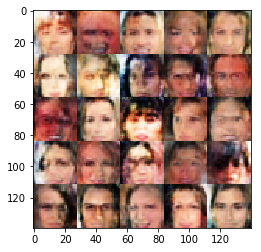

Epoch 1/3... Batch 2610  Discriminator Loss: 1.4794... Generator Loss: 0.7052
Epoch 1/3... Batch 2620  Discriminator Loss: 1.2676... Generator Loss: 1.1772
Epoch 1/3... Batch 2630  Discriminator Loss: 1.5726... Generator Loss: 0.9956
Epoch 1/3... Batch 2640  Discriminator Loss: 1.4595... Generator Loss: 0.6585
Epoch 1/3... Batch 2650  Discriminator Loss: 1.4863... Generator Loss: 0.6779
Epoch 1/3... Batch 2660  Discriminator Loss: 1.3648... Generator Loss: 0.7129
Epoch 1/3... Batch 2670  Discriminator Loss: 1.3593... Generator Loss: 0.8682
Epoch 1/3... Batch 2680  Discriminator Loss: 1.3497... Generator Loss: 0.7722
Epoch 1/3... Batch 2690  Discriminator Loss: 1.5383... Generator Loss: 0.6500
Epoch 1/3... Batch 2700  Discriminator Loss: 1.3000... Generator Loss: 0.8417


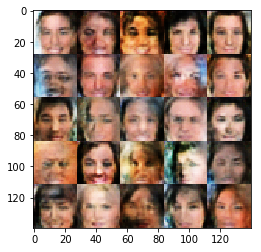

Epoch 1/3... Batch 2710  Discriminator Loss: 1.3737... Generator Loss: 0.8311
Epoch 1/3... Batch 2720  Discriminator Loss: 1.5161... Generator Loss: 0.9659
Epoch 1/3... Batch 2730  Discriminator Loss: 1.2615... Generator Loss: 0.7004
Epoch 1/3... Batch 2740  Discriminator Loss: 1.4527... Generator Loss: 1.0697
Epoch 1/3... Batch 2750  Discriminator Loss: 1.4242... Generator Loss: 0.7777
Epoch 1/3... Batch 2760  Discriminator Loss: 1.4150... Generator Loss: 0.6988
Epoch 1/3... Batch 2770  Discriminator Loss: 1.6131... Generator Loss: 0.5167
Epoch 1/3... Batch 2780  Discriminator Loss: 1.5461... Generator Loss: 0.6864
Epoch 1/3... Batch 2790  Discriminator Loss: 1.5245... Generator Loss: 0.7341
Epoch 1/3... Batch 2800  Discriminator Loss: 1.2761... Generator Loss: 0.9258


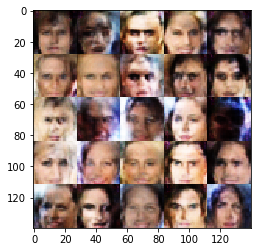

Epoch 1/3... Batch 2810  Discriminator Loss: 1.4721... Generator Loss: 0.7773
Epoch 1/3... Batch 2820  Discriminator Loss: 1.3955... Generator Loss: 0.5964
Epoch 1/3... Batch 2830  Discriminator Loss: 1.4856... Generator Loss: 0.7603
Epoch 1/3... Batch 2840  Discriminator Loss: 1.4183... Generator Loss: 0.6804
Epoch 1/3... Batch 2850  Discriminator Loss: 1.2802... Generator Loss: 0.8017
Epoch 1/3... Batch 2860  Discriminator Loss: 1.4582... Generator Loss: 0.6744
Epoch 1/3... Batch 2870  Discriminator Loss: 1.4060... Generator Loss: 0.8770
Epoch 1/3... Batch 2880  Discriminator Loss: 1.4828... Generator Loss: 0.5536
Epoch 1/3... Batch 2890  Discriminator Loss: 1.4639... Generator Loss: 0.9190
Epoch 1/3... Batch 2900  Discriminator Loss: 1.3806... Generator Loss: 0.6828


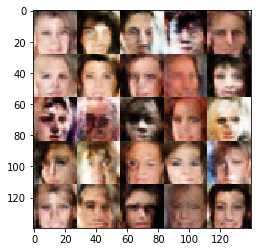

Epoch 1/3... Batch 2910  Discriminator Loss: 1.3922... Generator Loss: 0.5825
Epoch 1/3... Batch 2920  Discriminator Loss: 1.4857... Generator Loss: 0.7380
Epoch 1/3... Batch 2930  Discriminator Loss: 1.3948... Generator Loss: 0.8269
Epoch 1/3... Batch 2940  Discriminator Loss: 1.6989... Generator Loss: 0.5796
Epoch 1/3... Batch 2950  Discriminator Loss: 1.4179... Generator Loss: 0.8899
Epoch 1/3... Batch 2960  Discriminator Loss: 1.4353... Generator Loss: 0.7008
Epoch 1/3... Batch 2970  Discriminator Loss: 1.4088... Generator Loss: 0.7303
Epoch 1/3... Batch 2980  Discriminator Loss: 1.3691... Generator Loss: 0.6922
Epoch 1/3... Batch 2990  Discriminator Loss: 1.2385... Generator Loss: 0.9997
Epoch 1/3... Batch 3000  Discriminator Loss: 1.5377... Generator Loss: 0.5495


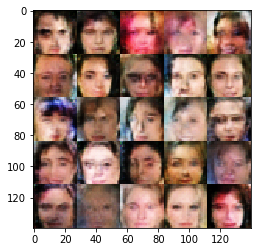

Epoch 1/3... Batch 3010  Discriminator Loss: 1.4397... Generator Loss: 0.6533
Epoch 1/3... Batch 3020  Discriminator Loss: 1.4026... Generator Loss: 0.7831
Epoch 1/3... Batch 3030  Discriminator Loss: 1.3876... Generator Loss: 0.8751
Epoch 1/3... Batch 3040  Discriminator Loss: 1.3049... Generator Loss: 0.7745
Epoch 1/3... Batch 3050  Discriminator Loss: 1.2537... Generator Loss: 0.9340
Epoch 1/3... Batch 3060  Discriminator Loss: 1.3921... Generator Loss: 0.7290
Epoch 1/3... Batch 3070  Discriminator Loss: 1.5430... Generator Loss: 0.7105
Epoch 1/3... Batch 3080  Discriminator Loss: 1.2296... Generator Loss: 0.7598
Epoch 1/3... Batch 3090  Discriminator Loss: 1.5310... Generator Loss: 0.7570
Epoch 1/3... Batch 3100  Discriminator Loss: 1.4859... Generator Loss: 0.8538


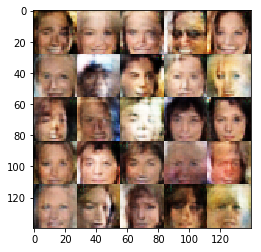

Epoch 1/3... Batch 3110  Discriminator Loss: 1.5013... Generator Loss: 0.7235
Epoch 1/3... Batch 3120  Discriminator Loss: 1.5556... Generator Loss: 0.6480
Epoch 1/3... Batch 3130  Discriminator Loss: 1.1939... Generator Loss: 1.2900
Epoch 1/3... Batch 3140  Discriminator Loss: 1.3923... Generator Loss: 1.0177
Epoch 1/3... Batch 3150  Discriminator Loss: 1.4696... Generator Loss: 0.6168
Epoch 1/3... Batch 3160  Discriminator Loss: 1.3486... Generator Loss: 0.6982
Epoch 1/3... Batch 3170  Discriminator Loss: 1.3413... Generator Loss: 0.6922
Epoch 1/3... Batch 3180  Discriminator Loss: 1.6347... Generator Loss: 0.9929
Epoch 1/3... Batch 3190  Discriminator Loss: 1.4404... Generator Loss: 0.6629
Epoch 1/3... Batch 3200  Discriminator Loss: 1.5026... Generator Loss: 0.7068


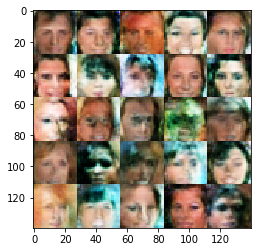

Epoch 1/3... Batch 3210  Discriminator Loss: 1.4884... Generator Loss: 0.8000
Epoch 1/3... Batch 3220  Discriminator Loss: 1.3874... Generator Loss: 0.8601
Epoch 1/3... Batch 3230  Discriminator Loss: 1.3519... Generator Loss: 1.0279
Epoch 1/3... Batch 3240  Discriminator Loss: 1.2892... Generator Loss: 0.7235
Epoch 1/3... Batch 3250  Discriminator Loss: 1.3977... Generator Loss: 0.6807
Epoch 1/3... Batch 3260  Discriminator Loss: 1.5800... Generator Loss: 0.6747
Epoch 1/3... Batch 3270  Discriminator Loss: 1.3915... Generator Loss: 0.9670
Epoch 1/3... Batch 3280  Discriminator Loss: 1.4315... Generator Loss: 0.6226
Epoch 1/3... Batch 3290  Discriminator Loss: 1.5151... Generator Loss: 0.6332
Epoch 1/3... Batch 3300  Discriminator Loss: 1.5422... Generator Loss: 0.9797


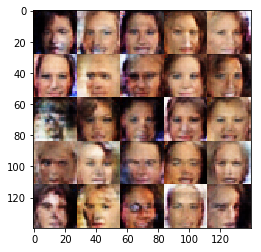

Epoch 1/3... Batch 3310  Discriminator Loss: 1.3970... Generator Loss: 0.9815
Epoch 1/3... Batch 3320  Discriminator Loss: 1.3399... Generator Loss: 0.8328
Epoch 1/3... Batch 3330  Discriminator Loss: 1.4237... Generator Loss: 0.6559
Epoch 1/3... Batch 3340  Discriminator Loss: 1.3499... Generator Loss: 0.8821
Epoch 1/3... Batch 3350  Discriminator Loss: 1.4967... Generator Loss: 0.6152
Epoch 1/3... Batch 3360  Discriminator Loss: 1.3121... Generator Loss: 0.9420
Epoch 1/3... Batch 3370  Discriminator Loss: 1.4783... Generator Loss: 0.5743
Epoch 1/3... Batch 3380  Discriminator Loss: 1.3475... Generator Loss: 0.7240
Epoch 1/3... Batch 3390  Discriminator Loss: 1.3345... Generator Loss: 1.0495
Epoch 1/3... Batch 3400  Discriminator Loss: 1.4612... Generator Loss: 0.7155


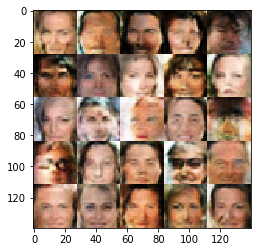

Epoch 1/3... Batch 3410  Discriminator Loss: 1.3080... Generator Loss: 0.6926
Epoch 1/3... Batch 3420  Discriminator Loss: 1.3982... Generator Loss: 0.8060
Epoch 1/3... Batch 3430  Discriminator Loss: 1.3093... Generator Loss: 0.9897
Epoch 1/3... Batch 3440  Discriminator Loss: 1.4468... Generator Loss: 0.5474
Epoch 1/3... Batch 3450  Discriminator Loss: 1.3278... Generator Loss: 0.7076
Epoch 1/3... Batch 3460  Discriminator Loss: 1.5026... Generator Loss: 0.7565
Epoch 1/3... Batch 3470  Discriminator Loss: 1.2668... Generator Loss: 0.8520
Epoch 1/3... Batch 3480  Discriminator Loss: 1.4487... Generator Loss: 0.6198
Epoch 1/3... Batch 3490  Discriminator Loss: 1.4700... Generator Loss: 0.7216
Epoch 1/3... Batch 3500  Discriminator Loss: 1.3235... Generator Loss: 0.7919


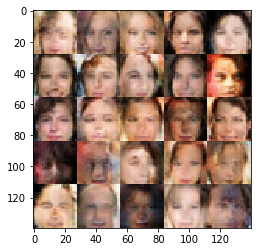

Epoch 1/3... Batch 3510  Discriminator Loss: 1.3647... Generator Loss: 0.7510
Epoch 1/3... Batch 3520  Discriminator Loss: 1.3577... Generator Loss: 0.8329
Epoch 1/3... Batch 3530  Discriminator Loss: 1.6384... Generator Loss: 0.4653
Epoch 1/3... Batch 3540  Discriminator Loss: 1.5188... Generator Loss: 0.7461
Epoch 1/3... Batch 3550  Discriminator Loss: 1.3789... Generator Loss: 0.7817
Epoch 1/3... Batch 3560  Discriminator Loss: 1.5128... Generator Loss: 0.5574
Epoch 1/3... Batch 3570  Discriminator Loss: 1.3006... Generator Loss: 0.9287
Epoch 1/3... Batch 3580  Discriminator Loss: 1.4077... Generator Loss: 0.7445
Epoch 1/3... Batch 3590  Discriminator Loss: 1.4315... Generator Loss: 0.5971
Epoch 1/3... Batch 3600  Discriminator Loss: 1.4218... Generator Loss: 0.8694


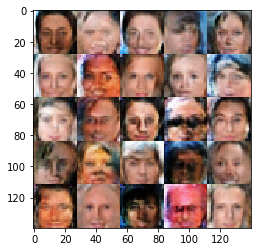

Epoch 1/3... Batch 3610  Discriminator Loss: 1.4859... Generator Loss: 0.7033
Epoch 1/3... Batch 3620  Discriminator Loss: 1.4478... Generator Loss: 0.6666
Epoch 1/3... Batch 3630  Discriminator Loss: 1.2501... Generator Loss: 0.9745
Epoch 1/3... Batch 3640  Discriminator Loss: 1.3859... Generator Loss: 0.6510
Epoch 1/3... Batch 3650  Discriminator Loss: 1.4140... Generator Loss: 0.8133
Epoch 1/3... Batch 3660  Discriminator Loss: 1.1767... Generator Loss: 0.9802
Epoch 1/3... Batch 3670  Discriminator Loss: 1.6072... Generator Loss: 0.5823
Epoch 1/3... Batch 3680  Discriminator Loss: 1.4422... Generator Loss: 0.9368
Epoch 1/3... Batch 3690  Discriminator Loss: 1.5042... Generator Loss: 0.6128
Epoch 1/3... Batch 3700  Discriminator Loss: 1.3140... Generator Loss: 0.6580


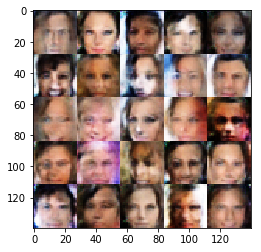

Epoch 1/3... Batch 3710  Discriminator Loss: 1.6449... Generator Loss: 0.6562
Epoch 1/3... Batch 3720  Discriminator Loss: 1.3521... Generator Loss: 0.7915
Epoch 1/3... Batch 3730  Discriminator Loss: 1.1828... Generator Loss: 0.9576
Epoch 1/3... Batch 3740  Discriminator Loss: 1.6688... Generator Loss: 0.6131
Epoch 1/3... Batch 3750  Discriminator Loss: 1.4466... Generator Loss: 0.8115
Epoch 1/3... Batch 3760  Discriminator Loss: 1.4417... Generator Loss: 0.6792
Epoch 1/3... Batch 3770  Discriminator Loss: 1.4462... Generator Loss: 0.6635
Epoch 1/3... Batch 3780  Discriminator Loss: 1.4476... Generator Loss: 0.5767
Epoch 1/3... Batch 3790  Discriminator Loss: 1.4890... Generator Loss: 0.6173
Epoch 1/3... Batch 3800  Discriminator Loss: 1.3770... Generator Loss: 0.8046


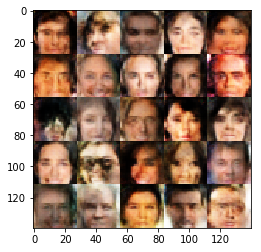

Epoch 1/3... Batch 3810  Discriminator Loss: 1.3310... Generator Loss: 0.8247
Epoch 1/3... Batch 3820  Discriminator Loss: 1.4437... Generator Loss: 0.7672
Epoch 1/3... Batch 3830  Discriminator Loss: 1.1674... Generator Loss: 1.0930
Epoch 1/3... Batch 3840  Discriminator Loss: 1.5558... Generator Loss: 0.6704
Epoch 1/3... Batch 3850  Discriminator Loss: 1.4462... Generator Loss: 0.8197
Epoch 1/3... Batch 3860  Discriminator Loss: 1.3447... Generator Loss: 0.7866
Epoch 1/3... Batch 3870  Discriminator Loss: 1.3858... Generator Loss: 0.9015
Epoch 1/3... Batch 3880  Discriminator Loss: 1.4750... Generator Loss: 0.7574
Epoch 1/3... Batch 3890  Discriminator Loss: 1.4045... Generator Loss: 0.7843
Epoch 1/3... Batch 3900  Discriminator Loss: 1.3626... Generator Loss: 0.7406


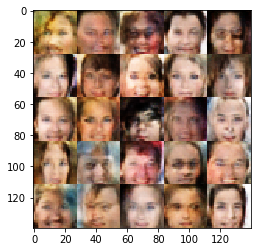

Epoch 1/3... Batch 3910  Discriminator Loss: 1.4984... Generator Loss: 0.8665
Epoch 1/3... Batch 3920  Discriminator Loss: 1.4312... Generator Loss: 0.7423
Epoch 1/3... Batch 3930  Discriminator Loss: 1.4514... Generator Loss: 0.7887
Epoch 1/3... Batch 3940  Discriminator Loss: 1.4624... Generator Loss: 0.8528
Epoch 1/3... Batch 3950  Discriminator Loss: 1.5342... Generator Loss: 0.6369
Epoch 1/3... Batch 3960  Discriminator Loss: 1.2764... Generator Loss: 1.0546
Epoch 1/3... Batch 3970  Discriminator Loss: 1.2856... Generator Loss: 0.8614
Epoch 1/3... Batch 3980  Discriminator Loss: 1.4895... Generator Loss: 0.8006
Epoch 1/3... Batch 3990  Discriminator Loss: 1.4585... Generator Loss: 0.7790
Epoch 1/3... Batch 4000  Discriminator Loss: 1.4193... Generator Loss: 0.8849


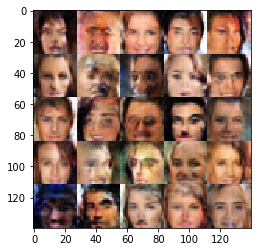

Epoch 1/3... Batch 4010  Discriminator Loss: 1.3946... Generator Loss: 0.8204
Epoch 1/3... Batch 4020  Discriminator Loss: 1.4733... Generator Loss: 0.6891
Epoch 1/3... Batch 4030  Discriminator Loss: 1.4676... Generator Loss: 0.6756
Epoch 1/3... Batch 4040  Discriminator Loss: 1.3410... Generator Loss: 1.0953
Epoch 1/3... Batch 4050  Discriminator Loss: 1.3590... Generator Loss: 0.8349
Epoch 1/3... Batch 4060  Discriminator Loss: 1.3996... Generator Loss: 0.7039
Epoch 1/3... Batch 4070  Discriminator Loss: 1.5167... Generator Loss: 0.7088
Epoch 1/3... Batch 4080  Discriminator Loss: 1.4348... Generator Loss: 0.9396
Epoch 1/3... Batch 4090  Discriminator Loss: 1.5005... Generator Loss: 0.6323
Epoch 1/3... Batch 4100  Discriminator Loss: 1.7096... Generator Loss: 0.3051


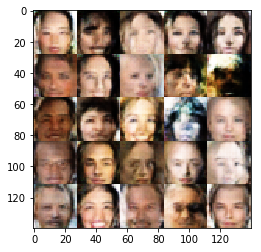

Epoch 1/3... Batch 4110  Discriminator Loss: 1.4029... Generator Loss: 0.7785
Epoch 1/3... Batch 4120  Discriminator Loss: 1.3338... Generator Loss: 0.8951
Epoch 1/3... Batch 4130  Discriminator Loss: 1.3983... Generator Loss: 0.7840
Epoch 1/3... Batch 4140  Discriminator Loss: 1.4106... Generator Loss: 0.6496
Epoch 1/3... Batch 4150  Discriminator Loss: 1.5059... Generator Loss: 0.7150
Epoch 1/3... Batch 4160  Discriminator Loss: 1.6658... Generator Loss: 0.5256
Epoch 1/3... Batch 4170  Discriminator Loss: 1.3543... Generator Loss: 0.7917
Epoch 1/3... Batch 4180  Discriminator Loss: 1.4940... Generator Loss: 0.6227
Epoch 1/3... Batch 4190  Discriminator Loss: 1.4194... Generator Loss: 0.6894
Epoch 1/3... Batch 4200  Discriminator Loss: 1.4702... Generator Loss: 0.7224


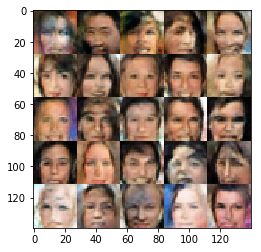

Epoch 1/3... Batch 4210  Discriminator Loss: 1.3017... Generator Loss: 0.8123
Epoch 1/3... Batch 4220  Discriminator Loss: 1.4391... Generator Loss: 0.6303
Epoch 1/3... Batch 4230  Discriminator Loss: 1.5453... Generator Loss: 0.6184
Epoch 1/3... Batch 4240  Discriminator Loss: 1.4721... Generator Loss: 0.7705
Epoch 1/3... Batch 4250  Discriminator Loss: 1.3465... Generator Loss: 0.8664
Epoch 1/3... Batch 4260  Discriminator Loss: 1.4092... Generator Loss: 0.7310
Epoch 1/3... Batch 4270  Discriminator Loss: 1.3799... Generator Loss: 0.6889
Epoch 1/3... Batch 4280  Discriminator Loss: 1.4044... Generator Loss: 0.7913
Epoch 1/3... Batch 4290  Discriminator Loss: 1.4246... Generator Loss: 0.7914
Epoch 1/3... Batch 4300  Discriminator Loss: 1.4794... Generator Loss: 0.7236


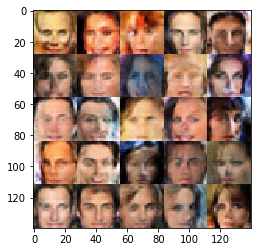

Epoch 1/3... Batch 4310  Discriminator Loss: 1.3231... Generator Loss: 0.8357
Epoch 1/3... Batch 4320  Discriminator Loss: 1.3443... Generator Loss: 0.6609
Epoch 1/3... Batch 4330  Discriminator Loss: 1.4249... Generator Loss: 0.6372
Epoch 1/3... Batch 4340  Discriminator Loss: 1.5260... Generator Loss: 0.5573
Epoch 1/3... Batch 4350  Discriminator Loss: 1.6419... Generator Loss: 0.5227
Epoch 1/3... Batch 4360  Discriminator Loss: 1.3808... Generator Loss: 0.6678
Epoch 1/3... Batch 4370  Discriminator Loss: 1.5114... Generator Loss: 0.6578
Epoch 1/3... Batch 4380  Discriminator Loss: 1.6046... Generator Loss: 0.5961
Epoch 1/3... Batch 4390  Discriminator Loss: 1.3784... Generator Loss: 0.7446
Epoch 1/3... Batch 4400  Discriminator Loss: 1.4058... Generator Loss: 0.6936


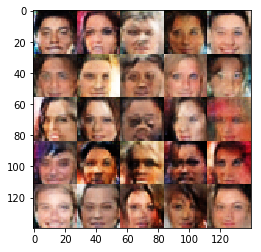

Epoch 1/3... Batch 4410  Discriminator Loss: 1.5071... Generator Loss: 0.6512
Epoch 1/3... Batch 4420  Discriminator Loss: 1.3292... Generator Loss: 0.7515
Epoch 1/3... Batch 4430  Discriminator Loss: 1.3817... Generator Loss: 0.8644
Epoch 1/3... Batch 4440  Discriminator Loss: 1.3926... Generator Loss: 0.7761
Epoch 1/3... Batch 4450  Discriminator Loss: 1.3312... Generator Loss: 0.8111
Epoch 1/3... Batch 4460  Discriminator Loss: 1.4010... Generator Loss: 0.7148
Epoch 1/3... Batch 4470  Discriminator Loss: 1.3922... Generator Loss: 0.6899
Epoch 1/3... Batch 4480  Discriminator Loss: 1.4473... Generator Loss: 0.7463
Epoch 1/3... Batch 4490  Discriminator Loss: 1.4389... Generator Loss: 0.6898
Epoch 1/3... Batch 4500  Discriminator Loss: 1.4334... Generator Loss: 0.8949


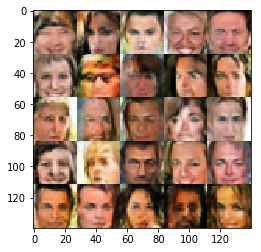

Epoch 1/3... Batch 4510  Discriminator Loss: 1.4256... Generator Loss: 0.7919
Epoch 1/3... Batch 4520  Discriminator Loss: 1.3617... Generator Loss: 0.7957
Epoch 1/3... Batch 4530  Discriminator Loss: 1.5195... Generator Loss: 0.5170
Epoch 1/3... Batch 4540  Discriminator Loss: 1.4522... Generator Loss: 0.6894
Epoch 1/3... Batch 4550  Discriminator Loss: 1.4124... Generator Loss: 0.8132
Epoch 1/3... Batch 4560  Discriminator Loss: 1.4833... Generator Loss: 0.6322
Epoch 1/3... Batch 4570  Discriminator Loss: 1.2138... Generator Loss: 0.9627
Epoch 1/3... Batch 4580  Discriminator Loss: 1.2818... Generator Loss: 0.9147
Epoch 1/3... Batch 4590  Discriminator Loss: 1.3105... Generator Loss: 0.7512
Epoch 1/3... Batch 4600  Discriminator Loss: 1.2710... Generator Loss: 0.7809


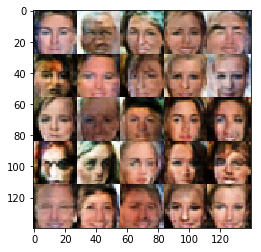

Epoch 1/3... Batch 4610  Discriminator Loss: 1.4313... Generator Loss: 0.7451
Epoch 1/3... Batch 4620  Discriminator Loss: 1.3461... Generator Loss: 0.8832
Epoch 1/3... Batch 4630  Discriminator Loss: 1.5432... Generator Loss: 0.5488
Epoch 1/3... Batch 4640  Discriminator Loss: 1.5022... Generator Loss: 0.6235
Epoch 1/3... Batch 4650  Discriminator Loss: 1.5333... Generator Loss: 0.6803
Epoch 1/3... Batch 4660  Discriminator Loss: 1.4450... Generator Loss: 0.7186
Epoch 1/3... Batch 4670  Discriminator Loss: 1.3632... Generator Loss: 0.6753
Epoch 1/3... Batch 4680  Discriminator Loss: 1.3021... Generator Loss: 0.9110
Epoch 1/3... Batch 4690  Discriminator Loss: 1.5920... Generator Loss: 0.4751
Epoch 1/3... Batch 4700  Discriminator Loss: 1.3571... Generator Loss: 0.8595


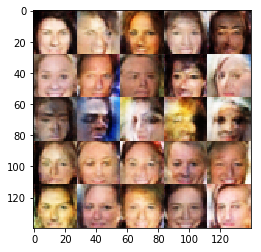

Epoch 1/3... Batch 4710  Discriminator Loss: 1.4099... Generator Loss: 0.7877
Epoch 1/3... Batch 4720  Discriminator Loss: 1.5108... Generator Loss: 0.7982
Epoch 1/3... Batch 4730  Discriminator Loss: 1.4051... Generator Loss: 0.6686
Epoch 1/3... Batch 4740  Discriminator Loss: 1.5718... Generator Loss: 0.6273
Epoch 1/3... Batch 4750  Discriminator Loss: 1.5881... Generator Loss: 0.5181
Epoch 1/3... Batch 4760  Discriminator Loss: 1.3655... Generator Loss: 0.9137
Epoch 1/3... Batch 4770  Discriminator Loss: 1.3691... Generator Loss: 0.7831
Epoch 1/3... Batch 4780  Discriminator Loss: 1.4203... Generator Loss: 0.7521
Epoch 1/3... Batch 4790  Discriminator Loss: 1.4636... Generator Loss: 0.7527
Epoch 1/3... Batch 4800  Discriminator Loss: 1.4243... Generator Loss: 0.7733


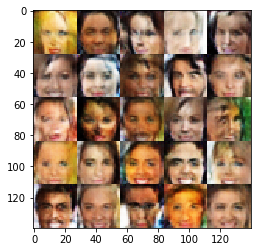

Epoch 1/3... Batch 4810  Discriminator Loss: 1.4738... Generator Loss: 0.5770
Epoch 1/3... Batch 4820  Discriminator Loss: 1.2567... Generator Loss: 0.7537
Epoch 1/3... Batch 4830  Discriminator Loss: 1.4317... Generator Loss: 0.7994
Epoch 1/3... Batch 4840  Discriminator Loss: 1.4740... Generator Loss: 0.7831
Epoch 1/3... Batch 4850  Discriminator Loss: 1.4589... Generator Loss: 0.8597
Epoch 1/3... Batch 4860  Discriminator Loss: 1.5027... Generator Loss: 0.6923
Epoch 1/3... Batch 4870  Discriminator Loss: 1.4838... Generator Loss: 0.6726
Epoch 1/3... Batch 4880  Discriminator Loss: 1.3754... Generator Loss: 0.7874
Epoch 1/3... Batch 4890  Discriminator Loss: 1.3275... Generator Loss: 0.7892
Epoch 1/3... Batch 4900  Discriminator Loss: 1.4580... Generator Loss: 0.8697


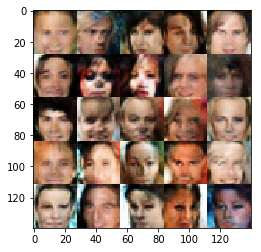

Epoch 1/3... Batch 4910  Discriminator Loss: 1.4462... Generator Loss: 0.6529
Epoch 1/3... Batch 4920  Discriminator Loss: 1.4196... Generator Loss: 0.7735
Epoch 1/3... Batch 4930  Discriminator Loss: 1.3302... Generator Loss: 0.7525
Epoch 1/3... Batch 4940  Discriminator Loss: 1.4890... Generator Loss: 0.8364
Epoch 1/3... Batch 4950  Discriminator Loss: 1.4411... Generator Loss: 0.6909
Epoch 1/3... Batch 4960  Discriminator Loss: 1.4889... Generator Loss: 0.7048
Epoch 1/3... Batch 4970  Discriminator Loss: 1.4679... Generator Loss: 0.7095
Epoch 1/3... Batch 4980  Discriminator Loss: 1.4224... Generator Loss: 0.7343
Epoch 1/3... Batch 4990  Discriminator Loss: 1.5155... Generator Loss: 0.6204
Epoch 1/3... Batch 5000  Discriminator Loss: 1.3905... Generator Loss: 0.7875


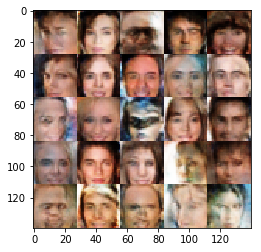

Epoch 1/3... Batch 5010  Discriminator Loss: 1.3105... Generator Loss: 0.8309
Epoch 1/3... Batch 5020  Discriminator Loss: 1.5373... Generator Loss: 0.7286
Epoch 1/3... Batch 5030  Discriminator Loss: 1.4968... Generator Loss: 0.6091
Epoch 1/3... Batch 5040  Discriminator Loss: 1.1891... Generator Loss: 0.9208
Epoch 1/3... Batch 5050  Discriminator Loss: 1.3365... Generator Loss: 0.7371
Epoch 1/3... Batch 5060  Discriminator Loss: 1.2580... Generator Loss: 0.7085
Epoch 1/3... Batch 5070  Discriminator Loss: 1.2462... Generator Loss: 0.8594
Epoch 1/3... Batch 5080  Discriminator Loss: 1.4309... Generator Loss: 0.7045
Epoch 1/3... Batch 5090  Discriminator Loss: 1.6167... Generator Loss: 0.5095
Epoch 1/3... Batch 5100  Discriminator Loss: 1.4800... Generator Loss: 0.7512


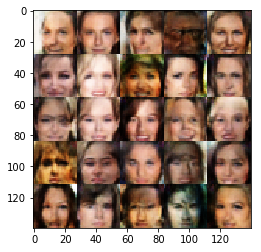

Epoch 1/3... Batch 5110  Discriminator Loss: 1.4693... Generator Loss: 0.6784
Epoch 1/3... Batch 5120  Discriminator Loss: 1.4658... Generator Loss: 0.6318
Epoch 1/3... Batch 5130  Discriminator Loss: 1.4267... Generator Loss: 0.6195
Epoch 1/3... Batch 5140  Discriminator Loss: 1.3482... Generator Loss: 0.8258
Epoch 1/3... Batch 5150  Discriminator Loss: 1.5449... Generator Loss: 0.6480
Epoch 1/3... Batch 5160  Discriminator Loss: 1.2616... Generator Loss: 0.8314
Epoch 1/3... Batch 5170  Discriminator Loss: 1.4648... Generator Loss: 0.7085
Epoch 1/3... Batch 5180  Discriminator Loss: 1.4623... Generator Loss: 0.7110
Epoch 1/3... Batch 5190  Discriminator Loss: 1.3840... Generator Loss: 0.6997
Epoch 1/3... Batch 5200  Discriminator Loss: 1.3636... Generator Loss: 0.8685


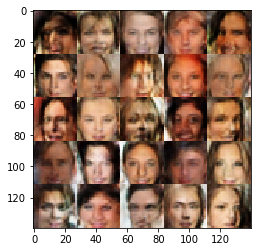

Epoch 1/3... Batch 5210  Discriminator Loss: 1.5190... Generator Loss: 0.7285
Epoch 1/3... Batch 5220  Discriminator Loss: 1.3336... Generator Loss: 0.8918
Epoch 1/3... Batch 5230  Discriminator Loss: 1.3892... Generator Loss: 0.6778
Epoch 1/3... Batch 5240  Discriminator Loss: 1.4841... Generator Loss: 0.6830
Epoch 1/3... Batch 5250  Discriminator Loss: 1.3137... Generator Loss: 0.8177
Epoch 1/3... Batch 5260  Discriminator Loss: 1.3179... Generator Loss: 0.8640
Epoch 1/3... Batch 5270  Discriminator Loss: 1.3659... Generator Loss: 0.8542
Epoch 1/3... Batch 5280  Discriminator Loss: 1.4007... Generator Loss: 0.6614
Epoch 1/3... Batch 5290  Discriminator Loss: 1.4842... Generator Loss: 0.7297
Epoch 1/3... Batch 5300  Discriminator Loss: 1.4187... Generator Loss: 0.6407


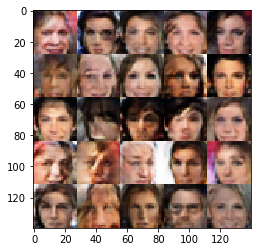

Epoch 1/3... Batch 5310  Discriminator Loss: 1.4942... Generator Loss: 0.6941
Epoch 1/3... Batch 5320  Discriminator Loss: 1.4101... Generator Loss: 0.7728
Epoch 1/3... Batch 5330  Discriminator Loss: 1.3917... Generator Loss: 0.8417
Epoch 1/3... Batch 5340  Discriminator Loss: 1.3456... Generator Loss: 0.7863
Epoch 1/3... Batch 5350  Discriminator Loss: 1.3457... Generator Loss: 0.8155
Epoch 1/3... Batch 5360  Discriminator Loss: 1.3845... Generator Loss: 0.8043
Epoch 1/3... Batch 5370  Discriminator Loss: 1.3403... Generator Loss: 0.8869
Epoch 1/3... Batch 5380  Discriminator Loss: 1.4973... Generator Loss: 0.7504
Epoch 1/3... Batch 5390  Discriminator Loss: 1.4061... Generator Loss: 0.6723
Epoch 1/3... Batch 5400  Discriminator Loss: 1.4200... Generator Loss: 0.7182


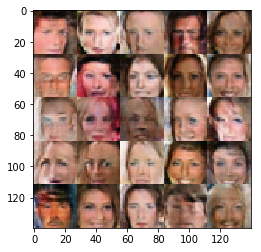

Epoch 1/3... Batch 5410  Discriminator Loss: 1.3955... Generator Loss: 0.8916
Epoch 1/3... Batch 5420  Discriminator Loss: 1.2895... Generator Loss: 0.7606
Epoch 1/3... Batch 5430  Discriminator Loss: 1.5097... Generator Loss: 0.6573
Epoch 1/3... Batch 5440  Discriminator Loss: 1.5265... Generator Loss: 0.6997
Epoch 1/3... Batch 5450  Discriminator Loss: 1.4660... Generator Loss: 0.7159
Epoch 1/3... Batch 5460  Discriminator Loss: 1.5204... Generator Loss: 0.6139
Epoch 1/3... Batch 5470  Discriminator Loss: 1.3914... Generator Loss: 0.8112
Epoch 1/3... Batch 5480  Discriminator Loss: 1.4340... Generator Loss: 0.6096
Epoch 1/3... Batch 5490  Discriminator Loss: 1.3876... Generator Loss: 0.7114
Epoch 1/3... Batch 5500  Discriminator Loss: 1.5131... Generator Loss: 0.7089


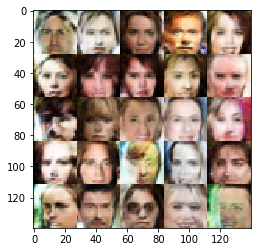

Epoch 1/3... Batch 5510  Discriminator Loss: 1.3777... Generator Loss: 0.8013
Epoch 1/3... Batch 5520  Discriminator Loss: 1.5000... Generator Loss: 0.7380
Epoch 1/3... Batch 5530  Discriminator Loss: 1.4476... Generator Loss: 0.7193
Epoch 1/3... Batch 5540  Discriminator Loss: 1.3740... Generator Loss: 0.7492
Epoch 1/3... Batch 5550  Discriminator Loss: 1.4807... Generator Loss: 0.6874
Epoch 1/3... Batch 5560  Discriminator Loss: 1.3700... Generator Loss: 0.8418
Epoch 1/3... Batch 5570  Discriminator Loss: 1.4329... Generator Loss: 1.0104
Epoch 1/3... Batch 5580  Discriminator Loss: 1.4796... Generator Loss: 0.6586
Epoch 1/3... Batch 5590  Discriminator Loss: 1.3619... Generator Loss: 0.8027
Epoch 1/3... Batch 5600  Discriminator Loss: 1.4607... Generator Loss: 0.7633


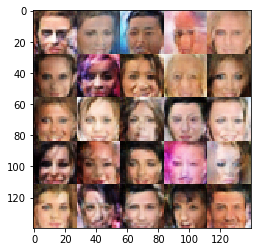

Epoch 1/3... Batch 5610  Discriminator Loss: 1.4608... Generator Loss: 0.6518
Epoch 1/3... Batch 5620  Discriminator Loss: 1.5687... Generator Loss: 0.5397
Epoch 1/3... Batch 5630  Discriminator Loss: 1.4582... Generator Loss: 0.6899
Epoch 1/3... Batch 5640  Discriminator Loss: 1.3271... Generator Loss: 0.7775
Epoch 1/3... Batch 5650  Discriminator Loss: 1.5153... Generator Loss: 0.6854
Epoch 1/3... Batch 5660  Discriminator Loss: 1.5242... Generator Loss: 0.8074
Epoch 1/3... Batch 5670  Discriminator Loss: 1.3771... Generator Loss: 0.6686
Epoch 1/3... Batch 5680  Discriminator Loss: 1.4906... Generator Loss: 0.7044
Epoch 1/3... Batch 5690  Discriminator Loss: 1.5318... Generator Loss: 0.7271
Epoch 1/3... Batch 5700  Discriminator Loss: 1.4488... Generator Loss: 0.6743


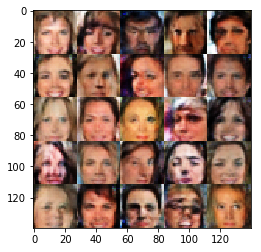

Epoch 1/3... Batch 5710  Discriminator Loss: 1.4388... Generator Loss: 0.7911
Epoch 1/3... Batch 5720  Discriminator Loss: 1.3496... Generator Loss: 0.7832
Epoch 1/3... Batch 5730  Discriminator Loss: 1.4534... Generator Loss: 0.7226
Epoch 1/3... Batch 5740  Discriminator Loss: 1.5015... Generator Loss: 0.6862
Epoch 1/3... Batch 5750  Discriminator Loss: 1.4904... Generator Loss: 0.7060
Epoch 1/3... Batch 5760  Discriminator Loss: 1.3763... Generator Loss: 0.8243
Epoch 1/3... Batch 5770  Discriminator Loss: 1.4003... Generator Loss: 0.6700
Epoch 1/3... Batch 5780  Discriminator Loss: 1.4772... Generator Loss: 0.6572
Epoch 1/3... Batch 5790  Discriminator Loss: 1.3202... Generator Loss: 0.8379
Epoch 1/3... Batch 5800  Discriminator Loss: 1.6082... Generator Loss: 0.5774


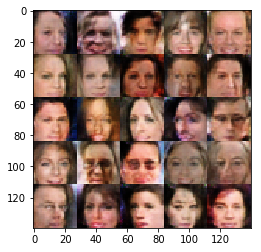

Epoch 1/3... Batch 5810  Discriminator Loss: 1.3308... Generator Loss: 0.8200
Epoch 1/3... Batch 5820  Discriminator Loss: 1.4297... Generator Loss: 0.7437
Epoch 1/3... Batch 5830  Discriminator Loss: 1.3712... Generator Loss: 0.6971
Epoch 1/3... Batch 5840  Discriminator Loss: 1.4481... Generator Loss: 0.7375
Epoch 1/3... Batch 5850  Discriminator Loss: 1.3955... Generator Loss: 0.7536
Epoch 1/3... Batch 5860  Discriminator Loss: 1.4241... Generator Loss: 0.7674
Epoch 1/3... Batch 5870  Discriminator Loss: 1.3091... Generator Loss: 1.0132
Epoch 1/3... Batch 5880  Discriminator Loss: 1.3504... Generator Loss: 0.7380
Epoch 1/3... Batch 5890  Discriminator Loss: 1.4000... Generator Loss: 0.8086
Epoch 1/3... Batch 5900  Discriminator Loss: 1.3237... Generator Loss: 0.8102


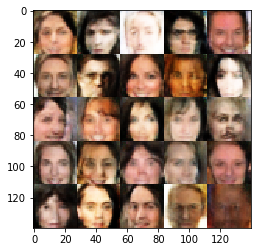

Epoch 1/3... Batch 5910  Discriminator Loss: 1.3795... Generator Loss: 0.6899
Epoch 1/3... Batch 5920  Discriminator Loss: 1.4110... Generator Loss: 0.6700
Epoch 1/3... Batch 5930  Discriminator Loss: 1.4524... Generator Loss: 0.6850
Epoch 1/3... Batch 5940  Discriminator Loss: 1.3779... Generator Loss: 0.7718
Epoch 1/3... Batch 5950  Discriminator Loss: 1.5080... Generator Loss: 0.7132
Epoch 1/3... Batch 5960  Discriminator Loss: 1.4083... Generator Loss: 0.7625
Epoch 1/3... Batch 5970  Discriminator Loss: 1.4839... Generator Loss: 0.6905
Epoch 1/3... Batch 5980  Discriminator Loss: 1.4759... Generator Loss: 0.6354
Epoch 1/3... Batch 5990  Discriminator Loss: 1.4323... Generator Loss: 0.6760
Epoch 1/3... Batch 6000  Discriminator Loss: 1.4371... Generator Loss: 0.6391


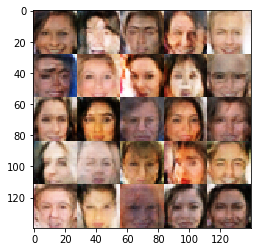

Epoch 1/3... Batch 6010  Discriminator Loss: 1.4178... Generator Loss: 0.7861
Epoch 1/3... Batch 6020  Discriminator Loss: 1.3715... Generator Loss: 0.7677
Epoch 1/3... Batch 6030  Discriminator Loss: 1.4187... Generator Loss: 0.7705
Epoch 1/3... Batch 6040  Discriminator Loss: 1.3873... Generator Loss: 0.7050
Epoch 1/3... Batch 6050  Discriminator Loss: 1.5464... Generator Loss: 0.6143
Epoch 1/3... Batch 6060  Discriminator Loss: 1.3315... Generator Loss: 0.8033
Epoch 1/3... Batch 6070  Discriminator Loss: 1.4550... Generator Loss: 0.7327
Epoch 1/3... Batch 6080  Discriminator Loss: 1.5113... Generator Loss: 0.5965
Epoch 1/3... Batch 6090  Discriminator Loss: 1.4536... Generator Loss: 0.6717
Epoch 1/3... Batch 6100  Discriminator Loss: 1.3886... Generator Loss: 0.7332


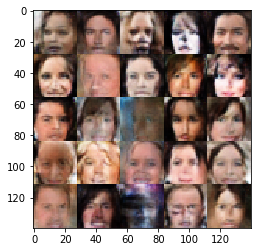

Epoch 1/3... Batch 6110  Discriminator Loss: 1.5661... Generator Loss: 0.5643
Epoch 1/3... Batch 6120  Discriminator Loss: 1.4478... Generator Loss: 0.6623
Epoch 1/3... Batch 6130  Discriminator Loss: 1.3473... Generator Loss: 0.8463
Epoch 1/3... Batch 6140  Discriminator Loss: 1.4550... Generator Loss: 0.7704
Epoch 1/3... Batch 6150  Discriminator Loss: 1.4107... Generator Loss: 0.7923
Epoch 1/3... Batch 6160  Discriminator Loss: 1.3258... Generator Loss: 0.7970
Epoch 1/3... Batch 6170  Discriminator Loss: 1.4088... Generator Loss: 0.7046
Epoch 1/3... Batch 6180  Discriminator Loss: 1.3727... Generator Loss: 0.8755
Epoch 1/3... Batch 6190  Discriminator Loss: 1.3899... Generator Loss: 0.8098
Epoch 1/3... Batch 6200  Discriminator Loss: 1.3801... Generator Loss: 0.7408


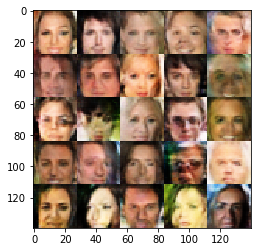

Epoch 1/3... Batch 6210  Discriminator Loss: 1.3593... Generator Loss: 0.7074
Epoch 1/3... Batch 6220  Discriminator Loss: 1.4392... Generator Loss: 0.6311
Epoch 1/3... Batch 6230  Discriminator Loss: 1.3345... Generator Loss: 0.7976
Epoch 1/3... Batch 6240  Discriminator Loss: 1.3880... Generator Loss: 0.7229
Epoch 1/3... Batch 6250  Discriminator Loss: 1.4110... Generator Loss: 0.7474
Epoch 1/3... Batch 6260  Discriminator Loss: 1.4060... Generator Loss: 0.6917
Epoch 1/3... Batch 6270  Discriminator Loss: 1.4091... Generator Loss: 0.7299
Epoch 1/3... Batch 6280  Discriminator Loss: 1.3473... Generator Loss: 0.8867
Epoch 1/3... Batch 6290  Discriminator Loss: 1.3850... Generator Loss: 0.7647
Epoch 1/3... Batch 6300  Discriminator Loss: 1.4437... Generator Loss: 0.6375


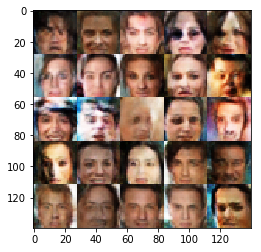

Epoch 1/3... Batch 6310  Discriminator Loss: 1.4146... Generator Loss: 0.8926
Epoch 1/3... Batch 6320  Discriminator Loss: 1.4419... Generator Loss: 0.7259
Epoch 1/3... Batch 6330  Discriminator Loss: 1.3924... Generator Loss: 0.6832
Epoch 2/3... Batch 10  Discriminator Loss: 1.4935... Generator Loss: 0.6002
Epoch 2/3... Batch 20  Discriminator Loss: 1.3683... Generator Loss: 0.8291
Epoch 2/3... Batch 30  Discriminator Loss: 1.3791... Generator Loss: 0.7587
Epoch 2/3... Batch 40  Discriminator Loss: 1.3912... Generator Loss: 0.8409
Epoch 2/3... Batch 50  Discriminator Loss: 1.4904... Generator Loss: 0.6805
Epoch 2/3... Batch 60  Discriminator Loss: 1.3527... Generator Loss: 0.9177
Epoch 2/3... Batch 70  Discriminator Loss: 1.4675... Generator Loss: 0.7577
Epoch 2/3... Batch 80  Discriminator Loss: 1.3662... Generator Loss: 0.6715
Epoch 2/3... Batch 90  Discriminator Loss: 1.4008... Generator Loss: 0.7501
Epoch 2/3... Batch 100  Discriminator Loss: 1.4462... Generator Loss: 0.6400


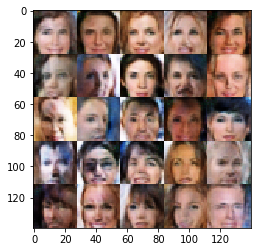

Epoch 2/3... Batch 110  Discriminator Loss: 1.3019... Generator Loss: 0.8601
Epoch 2/3... Batch 120  Discriminator Loss: 1.4987... Generator Loss: 0.7387
Epoch 2/3... Batch 130  Discriminator Loss: 1.4540... Generator Loss: 0.6574
Epoch 2/3... Batch 140  Discriminator Loss: 1.3441... Generator Loss: 0.7220
Epoch 2/3... Batch 150  Discriminator Loss: 1.4991... Generator Loss: 0.6426
Epoch 2/3... Batch 160  Discriminator Loss: 1.4904... Generator Loss: 0.6507
Epoch 2/3... Batch 170  Discriminator Loss: 1.4573... Generator Loss: 0.7422
Epoch 2/3... Batch 180  Discriminator Loss: 1.3804... Generator Loss: 0.7108
Epoch 2/3... Batch 190  Discriminator Loss: 1.3956... Generator Loss: 0.7220
Epoch 2/3... Batch 200  Discriminator Loss: 1.5104... Generator Loss: 0.6854


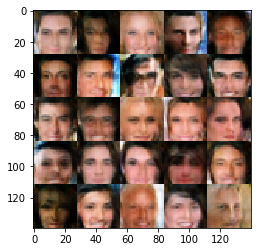

Epoch 2/3... Batch 210  Discriminator Loss: 1.4365... Generator Loss: 0.7085
Epoch 2/3... Batch 220  Discriminator Loss: 1.4014... Generator Loss: 0.7660
Epoch 2/3... Batch 230  Discriminator Loss: 1.4330... Generator Loss: 0.6840
Epoch 2/3... Batch 240  Discriminator Loss: 1.5352... Generator Loss: 0.6671
Epoch 2/3... Batch 250  Discriminator Loss: 1.2306... Generator Loss: 0.9197
Epoch 2/3... Batch 260  Discriminator Loss: 1.4087... Generator Loss: 0.7126
Epoch 2/3... Batch 270  Discriminator Loss: 1.4096... Generator Loss: 0.8023
Epoch 2/3... Batch 280  Discriminator Loss: 1.4147... Generator Loss: 0.6154
Epoch 2/3... Batch 290  Discriminator Loss: 1.3965... Generator Loss: 0.7921
Epoch 2/3... Batch 300  Discriminator Loss: 1.2221... Generator Loss: 1.0735


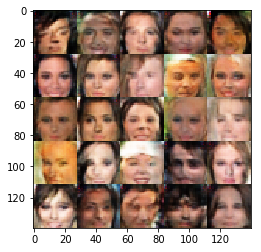

Epoch 2/3... Batch 310  Discriminator Loss: 1.3937... Generator Loss: 0.7461
Epoch 2/3... Batch 320  Discriminator Loss: 1.4792... Generator Loss: 0.5003
Epoch 2/3... Batch 330  Discriminator Loss: 1.4856... Generator Loss: 0.7043
Epoch 2/3... Batch 340  Discriminator Loss: 1.5371... Generator Loss: 0.7964
Epoch 2/3... Batch 350  Discriminator Loss: 1.3587... Generator Loss: 0.7245
Epoch 2/3... Batch 360  Discriminator Loss: 1.3891... Generator Loss: 0.6873
Epoch 2/3... Batch 370  Discriminator Loss: 1.5709... Generator Loss: 0.5765
Epoch 2/3... Batch 380  Discriminator Loss: 1.3273... Generator Loss: 0.7166
Epoch 2/3... Batch 390  Discriminator Loss: 1.4025... Generator Loss: 0.7364
Epoch 2/3... Batch 400  Discriminator Loss: 1.3161... Generator Loss: 0.9043


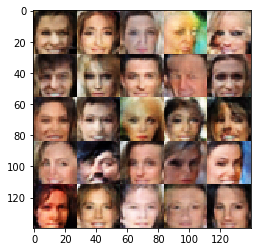

Epoch 2/3... Batch 410  Discriminator Loss: 1.4178... Generator Loss: 0.6365
Epoch 2/3... Batch 420  Discriminator Loss: 1.4919... Generator Loss: 0.6878
Epoch 2/3... Batch 430  Discriminator Loss: 1.3732... Generator Loss: 0.6470
Epoch 2/3... Batch 440  Discriminator Loss: 1.2835... Generator Loss: 0.9346
Epoch 2/3... Batch 450  Discriminator Loss: 1.2571... Generator Loss: 0.8173
Epoch 2/3... Batch 460  Discriminator Loss: 1.4177... Generator Loss: 0.6950
Epoch 2/3... Batch 470  Discriminator Loss: 1.5167... Generator Loss: 0.5753
Epoch 2/3... Batch 480  Discriminator Loss: 1.3735... Generator Loss: 0.9825
Epoch 2/3... Batch 490  Discriminator Loss: 1.3878... Generator Loss: 0.8825
Epoch 2/3... Batch 500  Discriminator Loss: 1.4733... Generator Loss: 0.8012


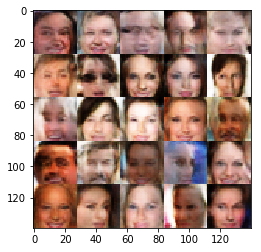

Epoch 2/3... Batch 510  Discriminator Loss: 1.2960... Generator Loss: 0.7719
Epoch 2/3... Batch 520  Discriminator Loss: 1.4354... Generator Loss: 0.6799
Epoch 2/3... Batch 530  Discriminator Loss: 1.3498... Generator Loss: 0.7672
Epoch 2/3... Batch 540  Discriminator Loss: 1.4013... Generator Loss: 0.7380
Epoch 2/3... Batch 550  Discriminator Loss: 1.4186... Generator Loss: 0.7419
Epoch 2/3... Batch 560  Discriminator Loss: 1.5109... Generator Loss: 0.6858
Epoch 2/3... Batch 570  Discriminator Loss: 1.3855... Generator Loss: 0.7919
Epoch 2/3... Batch 580  Discriminator Loss: 1.2639... Generator Loss: 0.8594
Epoch 2/3... Batch 590  Discriminator Loss: 1.4737... Generator Loss: 0.7359
Epoch 2/3... Batch 600  Discriminator Loss: 1.5204... Generator Loss: 0.7591


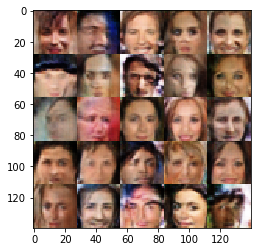

Epoch 2/3... Batch 610  Discriminator Loss: 1.3828... Generator Loss: 0.8109
Epoch 2/3... Batch 620  Discriminator Loss: 1.3246... Generator Loss: 0.8829
Epoch 2/3... Batch 630  Discriminator Loss: 1.4651... Generator Loss: 0.6741
Epoch 2/3... Batch 640  Discriminator Loss: 1.4470... Generator Loss: 0.7422
Epoch 2/3... Batch 650  Discriminator Loss: 1.3826... Generator Loss: 0.8023
Epoch 2/3... Batch 660  Discriminator Loss: 1.4657... Generator Loss: 0.8157
Epoch 2/3... Batch 670  Discriminator Loss: 1.4296... Generator Loss: 0.7070
Epoch 2/3... Batch 680  Discriminator Loss: 1.3956... Generator Loss: 0.7240
Epoch 2/3... Batch 690  Discriminator Loss: 1.3421... Generator Loss: 0.9195
Epoch 2/3... Batch 700  Discriminator Loss: 1.4603... Generator Loss: 0.9155


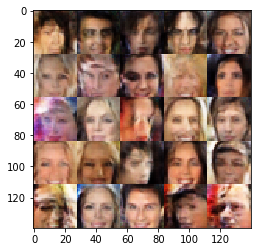

Epoch 2/3... Batch 710  Discriminator Loss: 1.4875... Generator Loss: 0.7016
Epoch 2/3... Batch 720  Discriminator Loss: 1.3499... Generator Loss: 0.9047
Epoch 2/3... Batch 730  Discriminator Loss: 1.4076... Generator Loss: 0.8035
Epoch 2/3... Batch 740  Discriminator Loss: 1.3248... Generator Loss: 0.8816
Epoch 2/3... Batch 750  Discriminator Loss: 1.3408... Generator Loss: 0.8076
Epoch 2/3... Batch 760  Discriminator Loss: 1.4030... Generator Loss: 0.7012
Epoch 2/3... Batch 770  Discriminator Loss: 1.3908... Generator Loss: 0.7414
Epoch 2/3... Batch 780  Discriminator Loss: 1.4029... Generator Loss: 0.7484
Epoch 2/3... Batch 790  Discriminator Loss: 1.3672... Generator Loss: 0.7565
Epoch 2/3... Batch 800  Discriminator Loss: 1.4531... Generator Loss: 0.7413


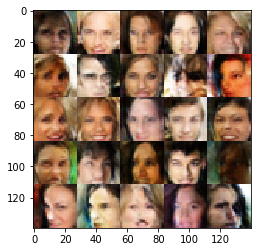

Epoch 2/3... Batch 810  Discriminator Loss: 1.4840... Generator Loss: 0.6851
Epoch 2/3... Batch 820  Discriminator Loss: 1.4003... Generator Loss: 0.7172
Epoch 2/3... Batch 830  Discriminator Loss: 1.5018... Generator Loss: 0.7326
Epoch 2/3... Batch 840  Discriminator Loss: 1.4127... Generator Loss: 0.8207
Epoch 2/3... Batch 850  Discriminator Loss: 1.2629... Generator Loss: 0.9191
Epoch 2/3... Batch 860  Discriminator Loss: 1.3086... Generator Loss: 0.8427
Epoch 2/3... Batch 870  Discriminator Loss: 1.3667... Generator Loss: 0.6568
Epoch 2/3... Batch 880  Discriminator Loss: 1.3690... Generator Loss: 0.7527
Epoch 2/3... Batch 890  Discriminator Loss: 1.2800... Generator Loss: 0.8699
Epoch 2/3... Batch 900  Discriminator Loss: 1.4629... Generator Loss: 0.6536


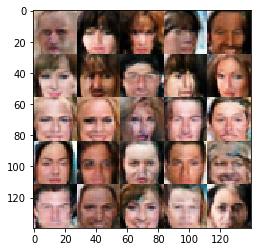

Epoch 2/3... Batch 910  Discriminator Loss: 1.4480... Generator Loss: 0.7450
Epoch 2/3... Batch 920  Discriminator Loss: 1.4671... Generator Loss: 0.6407
Epoch 2/3... Batch 930  Discriminator Loss: 1.4417... Generator Loss: 0.6655
Epoch 2/3... Batch 940  Discriminator Loss: 1.3967... Generator Loss: 0.8590
Epoch 2/3... Batch 950  Discriminator Loss: 1.3067... Generator Loss: 0.8296
Epoch 2/3... Batch 960  Discriminator Loss: 1.4537... Generator Loss: 0.6726
Epoch 2/3... Batch 970  Discriminator Loss: 1.4574... Generator Loss: 0.6670
Epoch 2/3... Batch 980  Discriminator Loss: 1.4693... Generator Loss: 0.6946
Epoch 2/3... Batch 990  Discriminator Loss: 1.4328... Generator Loss: 0.7458
Epoch 2/3... Batch 1000  Discriminator Loss: 1.3403... Generator Loss: 0.8195


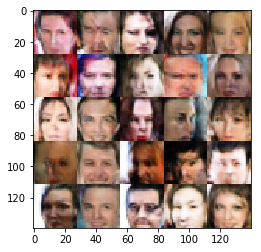

Epoch 2/3... Batch 1010  Discriminator Loss: 1.3828... Generator Loss: 0.7489
Epoch 2/3... Batch 1020  Discriminator Loss: 1.5845... Generator Loss: 0.6454
Epoch 2/3... Batch 1030  Discriminator Loss: 1.3379... Generator Loss: 0.8446
Epoch 2/3... Batch 1040  Discriminator Loss: 1.2968... Generator Loss: 0.8443
Epoch 2/3... Batch 1050  Discriminator Loss: 1.3467... Generator Loss: 0.7500
Epoch 2/3... Batch 1060  Discriminator Loss: 1.4106... Generator Loss: 0.7702
Epoch 2/3... Batch 1070  Discriminator Loss: 1.3455... Generator Loss: 0.7313
Epoch 2/3... Batch 1080  Discriminator Loss: 1.4270... Generator Loss: 0.7033
Epoch 2/3... Batch 1090  Discriminator Loss: 1.5063... Generator Loss: 0.6701
Epoch 2/3... Batch 1100  Discriminator Loss: 1.3504... Generator Loss: 0.7594


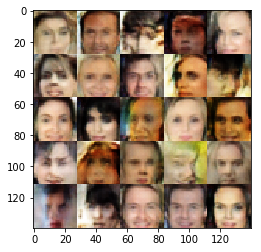

Epoch 2/3... Batch 1110  Discriminator Loss: 1.4914... Generator Loss: 0.7303
Epoch 2/3... Batch 1120  Discriminator Loss: 1.3682... Generator Loss: 0.8156
Epoch 2/3... Batch 1130  Discriminator Loss: 1.3383... Generator Loss: 0.8137
Epoch 2/3... Batch 1140  Discriminator Loss: 1.5229... Generator Loss: 0.7424
Epoch 2/3... Batch 1150  Discriminator Loss: 1.4152... Generator Loss: 0.7239
Epoch 2/3... Batch 1160  Discriminator Loss: 1.3688... Generator Loss: 0.7039
Epoch 2/3... Batch 1170  Discriminator Loss: 1.3739... Generator Loss: 0.7424
Epoch 2/3... Batch 1180  Discriminator Loss: 1.4434... Generator Loss: 0.7436
Epoch 2/3... Batch 1190  Discriminator Loss: 1.3584... Generator Loss: 0.6766
Epoch 2/3... Batch 1200  Discriminator Loss: 1.3819... Generator Loss: 0.6716


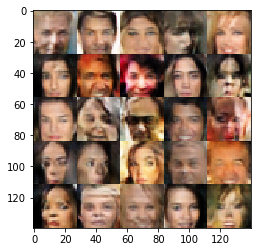

Epoch 2/3... Batch 1210  Discriminator Loss: 1.4346... Generator Loss: 0.7083
Epoch 2/3... Batch 1220  Discriminator Loss: 1.4759... Generator Loss: 0.7168
Epoch 2/3... Batch 1230  Discriminator Loss: 1.4261... Generator Loss: 0.6595
Epoch 2/3... Batch 1240  Discriminator Loss: 1.5023... Generator Loss: 0.6685
Epoch 2/3... Batch 1250  Discriminator Loss: 1.4244... Generator Loss: 0.7110
Epoch 2/3... Batch 1260  Discriminator Loss: 1.5019... Generator Loss: 0.7557
Epoch 2/3... Batch 1270  Discriminator Loss: 1.4442... Generator Loss: 0.7535
Epoch 2/3... Batch 1280  Discriminator Loss: 1.3665... Generator Loss: 0.8321
Epoch 2/3... Batch 1290  Discriminator Loss: 1.3812... Generator Loss: 0.7623
Epoch 2/3... Batch 1300  Discriminator Loss: 1.4063... Generator Loss: 0.6841


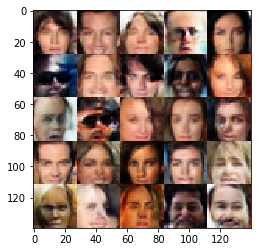

Epoch 2/3... Batch 1310  Discriminator Loss: 1.3725... Generator Loss: 0.8316
Epoch 2/3... Batch 1320  Discriminator Loss: 1.3134... Generator Loss: 0.7323
Epoch 2/3... Batch 1330  Discriminator Loss: 1.3623... Generator Loss: 0.8634
Epoch 2/3... Batch 1340  Discriminator Loss: 1.4887... Generator Loss: 0.7383
Epoch 2/3... Batch 1350  Discriminator Loss: 1.3948... Generator Loss: 0.8019
Epoch 2/3... Batch 1360  Discriminator Loss: 1.3039... Generator Loss: 0.7969
Epoch 2/3... Batch 1370  Discriminator Loss: 1.3680... Generator Loss: 0.7501
Epoch 2/3... Batch 1380  Discriminator Loss: 1.3981... Generator Loss: 0.7996
Epoch 2/3... Batch 1390  Discriminator Loss: 1.4260... Generator Loss: 0.8410
Epoch 2/3... Batch 1400  Discriminator Loss: 1.4730... Generator Loss: 0.6625


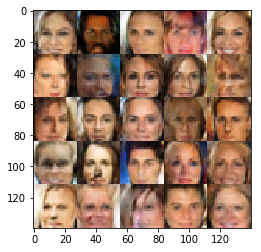

Epoch 2/3... Batch 1410  Discriminator Loss: 1.3098... Generator Loss: 0.8181
Epoch 2/3... Batch 1420  Discriminator Loss: 1.4651... Generator Loss: 0.7789
Epoch 2/3... Batch 1430  Discriminator Loss: 1.4905... Generator Loss: 0.8022
Epoch 2/3... Batch 1440  Discriminator Loss: 1.4891... Generator Loss: 0.7442
Epoch 2/3... Batch 1450  Discriminator Loss: 1.4274... Generator Loss: 0.7557
Epoch 2/3... Batch 1460  Discriminator Loss: 1.4714... Generator Loss: 0.7374
Epoch 2/3... Batch 1470  Discriminator Loss: 1.4862... Generator Loss: 0.6726
Epoch 2/3... Batch 1480  Discriminator Loss: 1.3915... Generator Loss: 0.8259
Epoch 2/3... Batch 1490  Discriminator Loss: 1.4277... Generator Loss: 0.7238
Epoch 2/3... Batch 1500  Discriminator Loss: 1.3968... Generator Loss: 0.7923


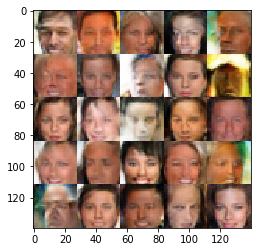

Epoch 2/3... Batch 1510  Discriminator Loss: 1.7859... Generator Loss: 0.4438
Epoch 2/3... Batch 1520  Discriminator Loss: 1.4041... Generator Loss: 0.6795
Epoch 2/3... Batch 1530  Discriminator Loss: 1.3799... Generator Loss: 0.7790
Epoch 2/3... Batch 1540  Discriminator Loss: 1.4094... Generator Loss: 0.6970
Epoch 2/3... Batch 1550  Discriminator Loss: 1.3767... Generator Loss: 0.8403
Epoch 2/3... Batch 1560  Discriminator Loss: 1.3760... Generator Loss: 0.8103
Epoch 2/3... Batch 1570  Discriminator Loss: 1.3598... Generator Loss: 0.7640
Epoch 2/3... Batch 1580  Discriminator Loss: 1.3989... Generator Loss: 0.7277
Epoch 2/3... Batch 1590  Discriminator Loss: 1.4302... Generator Loss: 0.7882
Epoch 2/3... Batch 1600  Discriminator Loss: 1.4953... Generator Loss: 0.6165


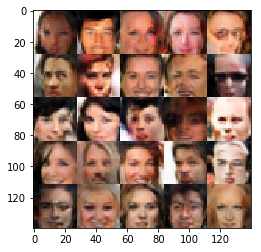

Epoch 2/3... Batch 1610  Discriminator Loss: 1.4054... Generator Loss: 0.7745
Epoch 2/3... Batch 1620  Discriminator Loss: 1.5130... Generator Loss: 0.6312
Epoch 2/3... Batch 1630  Discriminator Loss: 1.3645... Generator Loss: 0.9039
Epoch 2/3... Batch 1640  Discriminator Loss: 1.3705... Generator Loss: 0.7970
Epoch 2/3... Batch 1650  Discriminator Loss: 1.2740... Generator Loss: 0.8110
Epoch 2/3... Batch 1660  Discriminator Loss: 1.3729... Generator Loss: 0.7388
Epoch 2/3... Batch 1670  Discriminator Loss: 1.3358... Generator Loss: 0.7752
Epoch 2/3... Batch 1680  Discriminator Loss: 1.4483... Generator Loss: 0.6942
Epoch 2/3... Batch 1690  Discriminator Loss: 1.4042... Generator Loss: 0.7324
Epoch 2/3... Batch 1700  Discriminator Loss: 1.4646... Generator Loss: 0.7384


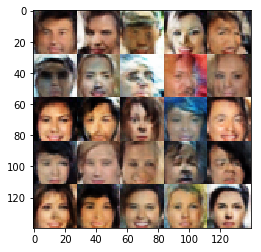

Epoch 2/3... Batch 1710  Discriminator Loss: 1.4248... Generator Loss: 0.7791
Epoch 2/3... Batch 1720  Discriminator Loss: 1.4479... Generator Loss: 0.7045
Epoch 2/3... Batch 1730  Discriminator Loss: 1.4259... Generator Loss: 0.8333
Epoch 2/3... Batch 1740  Discriminator Loss: 1.4057... Generator Loss: 0.8052
Epoch 2/3... Batch 1750  Discriminator Loss: 1.3464... Generator Loss: 0.8818
Epoch 2/3... Batch 1760  Discriminator Loss: 1.3807... Generator Loss: 0.7880
Epoch 2/3... Batch 1770  Discriminator Loss: 1.3858... Generator Loss: 0.7151
Epoch 2/3... Batch 1780  Discriminator Loss: 1.3910... Generator Loss: 0.6762
Epoch 2/3... Batch 1790  Discriminator Loss: 1.5999... Generator Loss: 0.5798
Epoch 2/3... Batch 1800  Discriminator Loss: 1.3162... Generator Loss: 0.8357


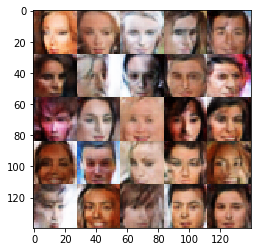

Epoch 2/3... Batch 1810  Discriminator Loss: 1.4585... Generator Loss: 0.7756
Epoch 2/3... Batch 1820  Discriminator Loss: 1.5491... Generator Loss: 0.7146
Epoch 2/3... Batch 1830  Discriminator Loss: 1.3733... Generator Loss: 0.7585
Epoch 2/3... Batch 1840  Discriminator Loss: 1.4546... Generator Loss: 0.6872
Epoch 2/3... Batch 1850  Discriminator Loss: 1.4167... Generator Loss: 0.7771
Epoch 2/3... Batch 1860  Discriminator Loss: 1.3763... Generator Loss: 0.7680
Epoch 2/3... Batch 1870  Discriminator Loss: 1.3582... Generator Loss: 0.7180
Epoch 2/3... Batch 1880  Discriminator Loss: 1.3938... Generator Loss: 0.8752
Epoch 2/3... Batch 1890  Discriminator Loss: 1.4244... Generator Loss: 0.6605
Epoch 2/3... Batch 1900  Discriminator Loss: 1.3802... Generator Loss: 0.8116


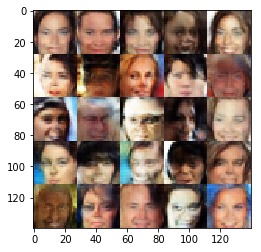

Epoch 2/3... Batch 1910  Discriminator Loss: 1.4497... Generator Loss: 0.7776
Epoch 2/3... Batch 1920  Discriminator Loss: 1.5027... Generator Loss: 0.6784
Epoch 2/3... Batch 1930  Discriminator Loss: 1.4460... Generator Loss: 0.7871
Epoch 2/3... Batch 1940  Discriminator Loss: 1.3392... Generator Loss: 0.7879
Epoch 2/3... Batch 1950  Discriminator Loss: 1.4621... Generator Loss: 0.6434
Epoch 2/3... Batch 1960  Discriminator Loss: 1.4395... Generator Loss: 0.7175
Epoch 2/3... Batch 1970  Discriminator Loss: 1.3166... Generator Loss: 0.9093
Epoch 2/3... Batch 1980  Discriminator Loss: 1.3737... Generator Loss: 0.7848
Epoch 2/3... Batch 1990  Discriminator Loss: 1.4419... Generator Loss: 0.8213
Epoch 2/3... Batch 2000  Discriminator Loss: 1.4627... Generator Loss: 0.7342


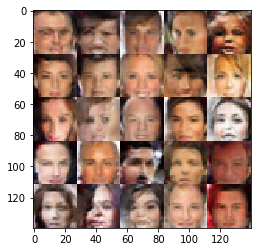

Epoch 2/3... Batch 2010  Discriminator Loss: 1.4955... Generator Loss: 0.7190
Epoch 2/3... Batch 2020  Discriminator Loss: 1.2791... Generator Loss: 0.8234
Epoch 2/3... Batch 2030  Discriminator Loss: 1.3953... Generator Loss: 0.7701
Epoch 2/3... Batch 2040  Discriminator Loss: 1.4111... Generator Loss: 0.7933
Epoch 2/3... Batch 2050  Discriminator Loss: 1.4320... Generator Loss: 0.6984
Epoch 2/3... Batch 2060  Discriminator Loss: 1.4044... Generator Loss: 0.7583
Epoch 2/3... Batch 2070  Discriminator Loss: 1.4261... Generator Loss: 0.8640
Epoch 2/3... Batch 2080  Discriminator Loss: 1.3965... Generator Loss: 0.7150
Epoch 2/3... Batch 2090  Discriminator Loss: 1.4832... Generator Loss: 0.7238
Epoch 2/3... Batch 2100  Discriminator Loss: 1.4000... Generator Loss: 0.6322


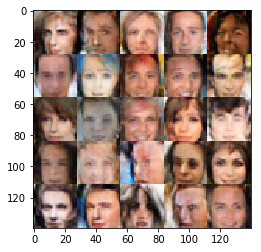

Epoch 2/3... Batch 2110  Discriminator Loss: 1.5226... Generator Loss: 0.7312
Epoch 2/3... Batch 2120  Discriminator Loss: 1.4511... Generator Loss: 0.7523
Epoch 2/3... Batch 2130  Discriminator Loss: 1.3280... Generator Loss: 0.8995
Epoch 2/3... Batch 2140  Discriminator Loss: 1.4070... Generator Loss: 0.7254
Epoch 2/3... Batch 2150  Discriminator Loss: 1.3953... Generator Loss: 0.7285
Epoch 2/3... Batch 2160  Discriminator Loss: 1.4885... Generator Loss: 0.7702
Epoch 2/3... Batch 2170  Discriminator Loss: 1.3719... Generator Loss: 0.9129
Epoch 2/3... Batch 2180  Discriminator Loss: 1.3812... Generator Loss: 0.8026
Epoch 2/3... Batch 2190  Discriminator Loss: 1.5204... Generator Loss: 0.7284
Epoch 2/3... Batch 2200  Discriminator Loss: 1.4186... Generator Loss: 0.7740


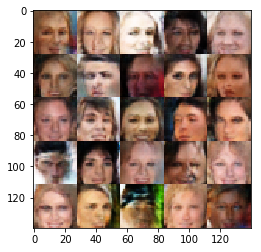

Epoch 2/3... Batch 2210  Discriminator Loss: 1.2988... Generator Loss: 0.8786
Epoch 2/3... Batch 2220  Discriminator Loss: 1.4180... Generator Loss: 0.6991
Epoch 2/3... Batch 2230  Discriminator Loss: 1.4756... Generator Loss: 0.6667
Epoch 2/3... Batch 2240  Discriminator Loss: 1.4227... Generator Loss: 0.6418
Epoch 2/3... Batch 2250  Discriminator Loss: 1.4501... Generator Loss: 0.7369
Epoch 2/3... Batch 2260  Discriminator Loss: 1.4337... Generator Loss: 0.6222
Epoch 2/3... Batch 2270  Discriminator Loss: 1.3201... Generator Loss: 0.9212
Epoch 2/3... Batch 2280  Discriminator Loss: 1.4757... Generator Loss: 0.7316
Epoch 2/3... Batch 2290  Discriminator Loss: 1.4796... Generator Loss: 0.7853
Epoch 2/3... Batch 2300  Discriminator Loss: 1.3558... Generator Loss: 0.8317


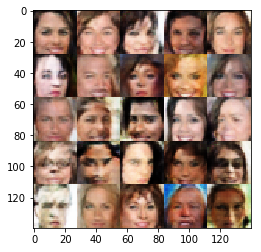

Epoch 2/3... Batch 2310  Discriminator Loss: 1.4397... Generator Loss: 0.7305
Epoch 2/3... Batch 2320  Discriminator Loss: 1.4274... Generator Loss: 0.7754
Epoch 2/3... Batch 2330  Discriminator Loss: 1.3738... Generator Loss: 0.7649
Epoch 2/3... Batch 2340  Discriminator Loss: 1.4100... Generator Loss: 0.7594
Epoch 2/3... Batch 2350  Discriminator Loss: 1.4731... Generator Loss: 0.6762
Epoch 2/3... Batch 2360  Discriminator Loss: 1.4681... Generator Loss: 0.7077
Epoch 2/3... Batch 2370  Discriminator Loss: 1.4980... Generator Loss: 0.7811
Epoch 2/3... Batch 2380  Discriminator Loss: 1.4201... Generator Loss: 0.7774
Epoch 2/3... Batch 2390  Discriminator Loss: 1.4877... Generator Loss: 0.6246
Epoch 2/3... Batch 2400  Discriminator Loss: 1.3193... Generator Loss: 0.7778


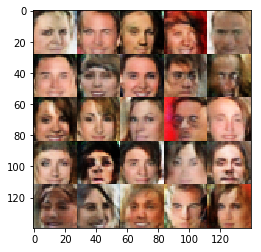

Epoch 2/3... Batch 2410  Discriminator Loss: 1.4219... Generator Loss: 0.7670
Epoch 2/3... Batch 2420  Discriminator Loss: 1.3857... Generator Loss: 0.8311
Epoch 2/3... Batch 2430  Discriminator Loss: 1.3624... Generator Loss: 0.6950
Epoch 2/3... Batch 2440  Discriminator Loss: 1.4453... Generator Loss: 0.7012
Epoch 2/3... Batch 2450  Discriminator Loss: 1.4055... Generator Loss: 0.7925
Epoch 2/3... Batch 2460  Discriminator Loss: 1.3551... Generator Loss: 0.7155
Epoch 2/3... Batch 2470  Discriminator Loss: 1.3721... Generator Loss: 0.7395
Epoch 2/3... Batch 2480  Discriminator Loss: 1.4573... Generator Loss: 0.6575
Epoch 2/3... Batch 2490  Discriminator Loss: 1.4924... Generator Loss: 0.7065
Epoch 2/3... Batch 2500  Discriminator Loss: 1.4548... Generator Loss: 0.7619


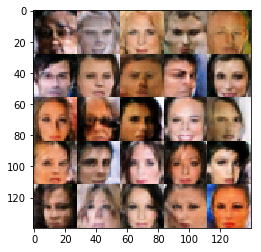

Epoch 2/3... Batch 2510  Discriminator Loss: 1.3735... Generator Loss: 0.7933
Epoch 2/3... Batch 2520  Discriminator Loss: 1.4773... Generator Loss: 0.7380
Epoch 2/3... Batch 2530  Discriminator Loss: 1.3378... Generator Loss: 0.7786
Epoch 2/3... Batch 2540  Discriminator Loss: 1.4597... Generator Loss: 0.7853
Epoch 2/3... Batch 2550  Discriminator Loss: 1.3513... Generator Loss: 0.7881
Epoch 2/3... Batch 2560  Discriminator Loss: 1.4023... Generator Loss: 0.7666
Epoch 2/3... Batch 2570  Discriminator Loss: 1.3338... Generator Loss: 0.8074
Epoch 2/3... Batch 2580  Discriminator Loss: 1.3855... Generator Loss: 0.7656
Epoch 2/3... Batch 2590  Discriminator Loss: 1.5218... Generator Loss: 0.7706
Epoch 2/3... Batch 2600  Discriminator Loss: 1.3764... Generator Loss: 0.7106


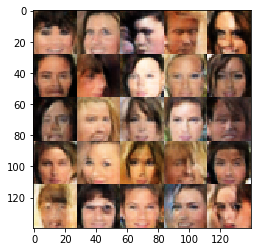

Epoch 2/3... Batch 2610  Discriminator Loss: 1.4297... Generator Loss: 0.7188
Epoch 2/3... Batch 2620  Discriminator Loss: 1.3885... Generator Loss: 0.8259
Epoch 2/3... Batch 2630  Discriminator Loss: 1.2752... Generator Loss: 0.9103
Epoch 2/3... Batch 2640  Discriminator Loss: 1.3291... Generator Loss: 0.7501
Epoch 2/3... Batch 2650  Discriminator Loss: 1.3619... Generator Loss: 0.8104
Epoch 2/3... Batch 2660  Discriminator Loss: 1.4312... Generator Loss: 0.8621
Epoch 2/3... Batch 2670  Discriminator Loss: 1.4036... Generator Loss: 0.7052
Epoch 2/3... Batch 2680  Discriminator Loss: 1.3335... Generator Loss: 0.7011
Epoch 2/3... Batch 2690  Discriminator Loss: 1.3960... Generator Loss: 0.7199
Epoch 2/3... Batch 2700  Discriminator Loss: 1.3906... Generator Loss: 0.7150


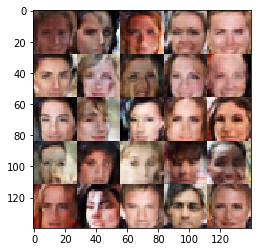

Epoch 2/3... Batch 2710  Discriminator Loss: 1.3891... Generator Loss: 0.7415
Epoch 2/3... Batch 2720  Discriminator Loss: 1.2681... Generator Loss: 0.7907
Epoch 2/3... Batch 2730  Discriminator Loss: 1.5182... Generator Loss: 0.6900
Epoch 2/3... Batch 2740  Discriminator Loss: 1.5461... Generator Loss: 0.6567
Epoch 2/3... Batch 2750  Discriminator Loss: 1.3052... Generator Loss: 0.8188
Epoch 2/3... Batch 2760  Discriminator Loss: 1.4509... Generator Loss: 0.7500
Epoch 2/3... Batch 2770  Discriminator Loss: 1.2951... Generator Loss: 0.7676
Epoch 2/3... Batch 2780  Discriminator Loss: 1.4871... Generator Loss: 0.7386
Epoch 2/3... Batch 2790  Discriminator Loss: 1.3613... Generator Loss: 0.7060
Epoch 2/3... Batch 2800  Discriminator Loss: 1.4779... Generator Loss: 0.7885


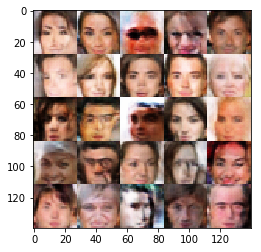

Epoch 2/3... Batch 2810  Discriminator Loss: 1.4002... Generator Loss: 0.7525
Epoch 2/3... Batch 2820  Discriminator Loss: 1.4277... Generator Loss: 0.7600
Epoch 2/3... Batch 2830  Discriminator Loss: 1.3879... Generator Loss: 0.7418
Epoch 2/3... Batch 2840  Discriminator Loss: 1.3577... Generator Loss: 0.7746
Epoch 2/3... Batch 2850  Discriminator Loss: 1.3875... Generator Loss: 0.7278
Epoch 2/3... Batch 2860  Discriminator Loss: 1.3167... Generator Loss: 0.8173
Epoch 2/3... Batch 2870  Discriminator Loss: 1.4145... Generator Loss: 0.8109
Epoch 2/3... Batch 2880  Discriminator Loss: 1.3901... Generator Loss: 0.7970
Epoch 2/3... Batch 2890  Discriminator Loss: 1.4118... Generator Loss: 0.6544
Epoch 2/3... Batch 2900  Discriminator Loss: 1.3832... Generator Loss: 0.7583


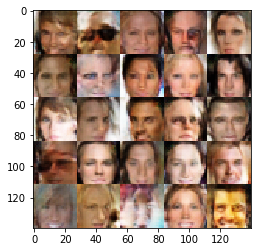

Epoch 2/3... Batch 2910  Discriminator Loss: 1.3838... Generator Loss: 0.7806
Epoch 2/3... Batch 2920  Discriminator Loss: 1.4186... Generator Loss: 0.7759
Epoch 2/3... Batch 2930  Discriminator Loss: 1.4343... Generator Loss: 0.7344
Epoch 2/3... Batch 2940  Discriminator Loss: 1.3619... Generator Loss: 0.7662
Epoch 2/3... Batch 2950  Discriminator Loss: 1.3786... Generator Loss: 0.8360
Epoch 2/3... Batch 2960  Discriminator Loss: 1.4273... Generator Loss: 0.8165
Epoch 2/3... Batch 2970  Discriminator Loss: 1.3742... Generator Loss: 0.7523
Epoch 2/3... Batch 2980  Discriminator Loss: 1.3902... Generator Loss: 0.7556
Epoch 2/3... Batch 2990  Discriminator Loss: 1.3787... Generator Loss: 0.7474
Epoch 2/3... Batch 3000  Discriminator Loss: 1.4154... Generator Loss: 0.6893


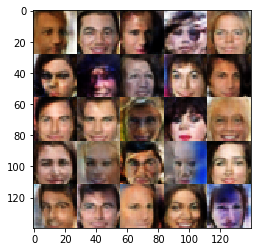

Epoch 2/3... Batch 3010  Discriminator Loss: 1.4801... Generator Loss: 0.6895
Epoch 2/3... Batch 3020  Discriminator Loss: 1.4060... Generator Loss: 0.7663
Epoch 2/3... Batch 3030  Discriminator Loss: 1.4681... Generator Loss: 0.7000
Epoch 2/3... Batch 3040  Discriminator Loss: 1.4156... Generator Loss: 0.7725
Epoch 2/3... Batch 3050  Discriminator Loss: 1.4517... Generator Loss: 0.7833
Epoch 2/3... Batch 3060  Discriminator Loss: 1.4137... Generator Loss: 0.7307
Epoch 2/3... Batch 3070  Discriminator Loss: 1.4041... Generator Loss: 0.7539
Epoch 2/3... Batch 3080  Discriminator Loss: 1.2850... Generator Loss: 0.8336
Epoch 2/3... Batch 3090  Discriminator Loss: 1.3964... Generator Loss: 0.7718
Epoch 2/3... Batch 3100  Discriminator Loss: 1.5431... Generator Loss: 0.6061


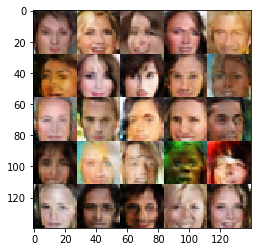

Epoch 2/3... Batch 3110  Discriminator Loss: 1.4398... Generator Loss: 0.6839
Epoch 2/3... Batch 3120  Discriminator Loss: 1.3458... Generator Loss: 0.8346
Epoch 2/3... Batch 3130  Discriminator Loss: 1.3345... Generator Loss: 0.8660
Epoch 2/3... Batch 3140  Discriminator Loss: 1.3138... Generator Loss: 0.8610
Epoch 2/3... Batch 3150  Discriminator Loss: 1.4372... Generator Loss: 0.7479
Epoch 2/3... Batch 3160  Discriminator Loss: 1.2709... Generator Loss: 0.8372
Epoch 2/3... Batch 3170  Discriminator Loss: 1.4244... Generator Loss: 0.7915
Epoch 2/3... Batch 3180  Discriminator Loss: 1.3823... Generator Loss: 0.8096
Epoch 2/3... Batch 3190  Discriminator Loss: 1.5442... Generator Loss: 0.5713
Epoch 2/3... Batch 3200  Discriminator Loss: 1.4738... Generator Loss: 0.5982


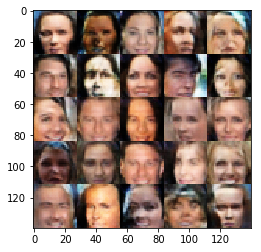

Epoch 2/3... Batch 3210  Discriminator Loss: 1.4005... Generator Loss: 0.7824
Epoch 2/3... Batch 3220  Discriminator Loss: 1.4391... Generator Loss: 0.8150
Epoch 2/3... Batch 3230  Discriminator Loss: 1.3424... Generator Loss: 0.7823
Epoch 2/3... Batch 3240  Discriminator Loss: 1.4061... Generator Loss: 0.7866
Epoch 2/3... Batch 3250  Discriminator Loss: 1.2620... Generator Loss: 0.8356
Epoch 2/3... Batch 3260  Discriminator Loss: 1.3403... Generator Loss: 0.7703
Epoch 2/3... Batch 3270  Discriminator Loss: 1.3868... Generator Loss: 0.7862
Epoch 2/3... Batch 3280  Discriminator Loss: 1.4051... Generator Loss: 0.7159
Epoch 2/3... Batch 3290  Discriminator Loss: 1.3241... Generator Loss: 0.7511
Epoch 2/3... Batch 3300  Discriminator Loss: 1.3347... Generator Loss: 0.8237


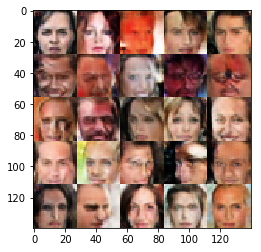

Epoch 2/3... Batch 3310  Discriminator Loss: 1.3970... Generator Loss: 0.8239
Epoch 2/3... Batch 3320  Discriminator Loss: 1.3962... Generator Loss: 0.7971
Epoch 2/3... Batch 3330  Discriminator Loss: 1.3875... Generator Loss: 0.7761
Epoch 2/3... Batch 3340  Discriminator Loss: 1.4107... Generator Loss: 0.7813
Epoch 2/3... Batch 3350  Discriminator Loss: 1.4006... Generator Loss: 0.7116
Epoch 2/3... Batch 3360  Discriminator Loss: 1.4320... Generator Loss: 0.8048
Epoch 2/3... Batch 3370  Discriminator Loss: 1.3851... Generator Loss: 0.7521
Epoch 2/3... Batch 3380  Discriminator Loss: 1.3911... Generator Loss: 0.7644
Epoch 2/3... Batch 3390  Discriminator Loss: 1.3134... Generator Loss: 0.7582
Epoch 2/3... Batch 3400  Discriminator Loss: 1.3184... Generator Loss: 0.7791


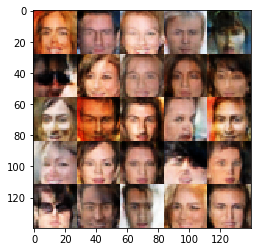

Epoch 2/3... Batch 3410  Discriminator Loss: 1.3921... Generator Loss: 0.7768
Epoch 2/3... Batch 3420  Discriminator Loss: 1.4637... Generator Loss: 0.7299
Epoch 2/3... Batch 3430  Discriminator Loss: 1.4079... Generator Loss: 0.8374
Epoch 2/3... Batch 3440  Discriminator Loss: 1.4267... Generator Loss: 0.7149
Epoch 2/3... Batch 3450  Discriminator Loss: 1.3747... Generator Loss: 0.8147
Epoch 2/3... Batch 3460  Discriminator Loss: 1.3597... Generator Loss: 0.7793
Epoch 2/3... Batch 3470  Discriminator Loss: 1.3365... Generator Loss: 0.8380
Epoch 2/3... Batch 3480  Discriminator Loss: 1.4504... Generator Loss: 0.7270
Epoch 2/3... Batch 3490  Discriminator Loss: 1.2901... Generator Loss: 0.9164
Epoch 2/3... Batch 3500  Discriminator Loss: 1.3986... Generator Loss: 0.8170


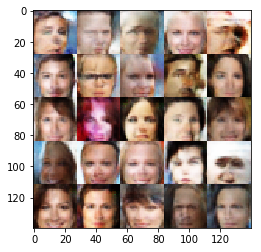

Epoch 2/3... Batch 3510  Discriminator Loss: 1.4212... Generator Loss: 0.8358
Epoch 2/3... Batch 3520  Discriminator Loss: 1.3998... Generator Loss: 0.7940
Epoch 2/3... Batch 3530  Discriminator Loss: 1.2961... Generator Loss: 0.8453
Epoch 2/3... Batch 3540  Discriminator Loss: 1.4562... Generator Loss: 0.6638
Epoch 2/3... Batch 3550  Discriminator Loss: 1.4501... Generator Loss: 0.7649
Epoch 2/3... Batch 3560  Discriminator Loss: 1.4496... Generator Loss: 0.7242
Epoch 2/3... Batch 3570  Discriminator Loss: 1.4372... Generator Loss: 0.7234
Epoch 2/3... Batch 3580  Discriminator Loss: 1.4293... Generator Loss: 0.7858
Epoch 2/3... Batch 3590  Discriminator Loss: 1.3903... Generator Loss: 0.7369
Epoch 2/3... Batch 3600  Discriminator Loss: 1.4019... Generator Loss: 0.7054


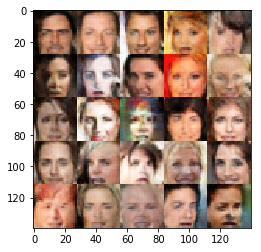

Epoch 2/3... Batch 3610  Discriminator Loss: 1.3104... Generator Loss: 0.7965
Epoch 2/3... Batch 3620  Discriminator Loss: 1.4358... Generator Loss: 0.8143
Epoch 2/3... Batch 3630  Discriminator Loss: 1.3198... Generator Loss: 0.8069
Epoch 2/3... Batch 3640  Discriminator Loss: 1.3883... Generator Loss: 0.7519
Epoch 2/3... Batch 3650  Discriminator Loss: 1.4174... Generator Loss: 0.7997
Epoch 2/3... Batch 3660  Discriminator Loss: 1.3304... Generator Loss: 0.7433
Epoch 2/3... Batch 3670  Discriminator Loss: 1.3831... Generator Loss: 0.7933
Epoch 2/3... Batch 3680  Discriminator Loss: 1.3163... Generator Loss: 0.8835
Epoch 2/3... Batch 3690  Discriminator Loss: 1.3932... Generator Loss: 0.7847
Epoch 2/3... Batch 3700  Discriminator Loss: 1.3718... Generator Loss: 0.7798


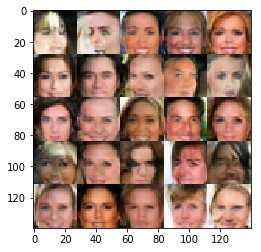

Epoch 2/3... Batch 3710  Discriminator Loss: 1.4314... Generator Loss: 0.7625
Epoch 2/3... Batch 3720  Discriminator Loss: 1.3176... Generator Loss: 0.8427
Epoch 2/3... Batch 3730  Discriminator Loss: 1.3595... Generator Loss: 0.7693
Epoch 2/3... Batch 3740  Discriminator Loss: 1.4415... Generator Loss: 0.7518
Epoch 2/3... Batch 3750  Discriminator Loss: 1.3993... Generator Loss: 0.6622
Epoch 2/3... Batch 3760  Discriminator Loss: 1.3480... Generator Loss: 0.7486
Epoch 2/3... Batch 3770  Discriminator Loss: 1.3952... Generator Loss: 0.7254
Epoch 2/3... Batch 3780  Discriminator Loss: 1.4126... Generator Loss: 0.7484
Epoch 2/3... Batch 3790  Discriminator Loss: 1.4257... Generator Loss: 0.7137
Epoch 2/3... Batch 3800  Discriminator Loss: 1.4061... Generator Loss: 0.7015


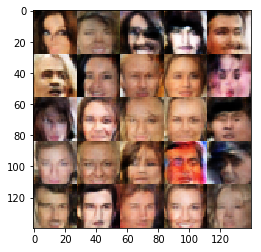

Epoch 2/3... Batch 3810  Discriminator Loss: 1.4155... Generator Loss: 0.7753
Epoch 2/3... Batch 3820  Discriminator Loss: 1.3413... Generator Loss: 0.8012
Epoch 2/3... Batch 3830  Discriminator Loss: 1.3384... Generator Loss: 0.7904
Epoch 2/3... Batch 3840  Discriminator Loss: 1.3420... Generator Loss: 0.7247
Epoch 2/3... Batch 3850  Discriminator Loss: 1.3886... Generator Loss: 0.7929
Epoch 2/3... Batch 3860  Discriminator Loss: 1.3610... Generator Loss: 0.8543
Epoch 2/3... Batch 3870  Discriminator Loss: 1.3702... Generator Loss: 0.8825
Epoch 2/3... Batch 3880  Discriminator Loss: 1.4077... Generator Loss: 0.7482
Epoch 2/3... Batch 3890  Discriminator Loss: 1.3088... Generator Loss: 0.7816
Epoch 2/3... Batch 3900  Discriminator Loss: 1.4186... Generator Loss: 0.8071


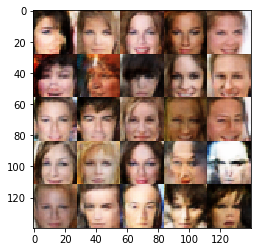

Epoch 2/3... Batch 3910  Discriminator Loss: 1.4364... Generator Loss: 0.7727
Epoch 2/3... Batch 3920  Discriminator Loss: 1.3838... Generator Loss: 0.7856
Epoch 2/3... Batch 3930  Discriminator Loss: 1.4073... Generator Loss: 0.7795
Epoch 2/3... Batch 3940  Discriminator Loss: 1.4855... Generator Loss: 0.7261
Epoch 2/3... Batch 3950  Discriminator Loss: 1.4253... Generator Loss: 0.7929
Epoch 2/3... Batch 3960  Discriminator Loss: 1.2786... Generator Loss: 0.7751
Epoch 2/3... Batch 3970  Discriminator Loss: 1.3656... Generator Loss: 0.8824
Epoch 2/3... Batch 3980  Discriminator Loss: 1.4160... Generator Loss: 0.7938
Epoch 2/3... Batch 3990  Discriminator Loss: 1.4207... Generator Loss: 0.7357
Epoch 2/3... Batch 4000  Discriminator Loss: 1.3185... Generator Loss: 0.7665


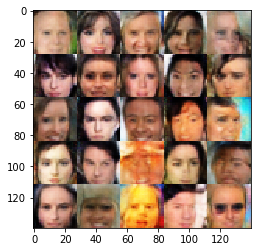

Epoch 2/3... Batch 4010  Discriminator Loss: 1.3767... Generator Loss: 0.7359
Epoch 2/3... Batch 4020  Discriminator Loss: 1.4601... Generator Loss: 0.7091
Epoch 2/3... Batch 4030  Discriminator Loss: 1.3540... Generator Loss: 0.7755
Epoch 2/3... Batch 4040  Discriminator Loss: 1.4074... Generator Loss: 0.7134
Epoch 2/3... Batch 4050  Discriminator Loss: 1.3423... Generator Loss: 0.7730
Epoch 2/3... Batch 4060  Discriminator Loss: 1.3785... Generator Loss: 0.9372
Epoch 2/3... Batch 4070  Discriminator Loss: 1.3255... Generator Loss: 0.8566
Epoch 2/3... Batch 4080  Discriminator Loss: 1.3868... Generator Loss: 0.8029
Epoch 2/3... Batch 4090  Discriminator Loss: 1.4786... Generator Loss: 0.7166
Epoch 2/3... Batch 4100  Discriminator Loss: 1.4993... Generator Loss: 0.6609


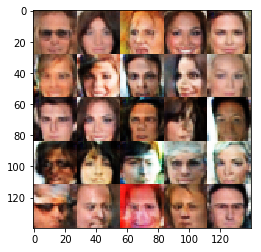

Epoch 2/3... Batch 4110  Discriminator Loss: 1.3415... Generator Loss: 0.7657
Epoch 2/3... Batch 4120  Discriminator Loss: 1.3927... Generator Loss: 0.7846
Epoch 2/3... Batch 4130  Discriminator Loss: 1.4705... Generator Loss: 0.7500
Epoch 2/3... Batch 4140  Discriminator Loss: 1.4160... Generator Loss: 0.7566
Epoch 2/3... Batch 4150  Discriminator Loss: 1.4048... Generator Loss: 0.7558
Epoch 2/3... Batch 4160  Discriminator Loss: 1.3938... Generator Loss: 0.7402
Epoch 2/3... Batch 4170  Discriminator Loss: 1.3840... Generator Loss: 0.7480
Epoch 2/3... Batch 4180  Discriminator Loss: 1.3176... Generator Loss: 0.7706
Epoch 2/3... Batch 4190  Discriminator Loss: 1.3959... Generator Loss: 0.8501
Epoch 2/3... Batch 4200  Discriminator Loss: 1.4576... Generator Loss: 0.8021


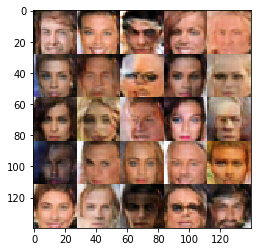

Epoch 2/3... Batch 4210  Discriminator Loss: 1.3471... Generator Loss: 0.8473
Epoch 2/3... Batch 4220  Discriminator Loss: 1.5003... Generator Loss: 0.7095
Epoch 2/3... Batch 4230  Discriminator Loss: 1.4199... Generator Loss: 0.8440
Epoch 2/3... Batch 4240  Discriminator Loss: 1.4045... Generator Loss: 0.7749
Epoch 2/3... Batch 4250  Discriminator Loss: 1.3783... Generator Loss: 0.8133
Epoch 2/3... Batch 4260  Discriminator Loss: 1.3644... Generator Loss: 0.8427
Epoch 2/3... Batch 4270  Discriminator Loss: 1.4226... Generator Loss: 0.7769
Epoch 2/3... Batch 4280  Discriminator Loss: 1.4011... Generator Loss: 0.8018
Epoch 2/3... Batch 4290  Discriminator Loss: 1.3870... Generator Loss: 0.7991
Epoch 2/3... Batch 4300  Discriminator Loss: 1.3925... Generator Loss: 0.7902


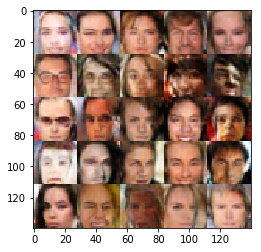

Epoch 2/3... Batch 4310  Discriminator Loss: 1.3923... Generator Loss: 0.7771
Epoch 2/3... Batch 4320  Discriminator Loss: 1.3863... Generator Loss: 0.7056
Epoch 2/3... Batch 4330  Discriminator Loss: 1.4421... Generator Loss: 0.6469
Epoch 2/3... Batch 4340  Discriminator Loss: 1.3288... Generator Loss: 0.8302
Epoch 2/3... Batch 4350  Discriminator Loss: 1.3687... Generator Loss: 0.7670
Epoch 2/3... Batch 4360  Discriminator Loss: 1.3783... Generator Loss: 0.6682
Epoch 2/3... Batch 4370  Discriminator Loss: 1.4356... Generator Loss: 0.7266
Epoch 2/3... Batch 4380  Discriminator Loss: 1.3952... Generator Loss: 0.7883
Epoch 2/3... Batch 4390  Discriminator Loss: 1.4806... Generator Loss: 0.7221
Epoch 2/3... Batch 4400  Discriminator Loss: 1.3787... Generator Loss: 0.7906


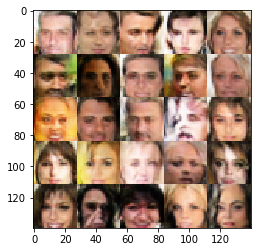

Epoch 2/3... Batch 4410  Discriminator Loss: 1.4232... Generator Loss: 0.7219
Epoch 2/3... Batch 4420  Discriminator Loss: 1.3314... Generator Loss: 0.8451
Epoch 2/3... Batch 4430  Discriminator Loss: 1.3909... Generator Loss: 0.8637
Epoch 2/3... Batch 4440  Discriminator Loss: 1.2968... Generator Loss: 0.7991
Epoch 2/3... Batch 4450  Discriminator Loss: 1.4235... Generator Loss: 0.7159
Epoch 2/3... Batch 4460  Discriminator Loss: 1.3964... Generator Loss: 0.7935
Epoch 2/3... Batch 4470  Discriminator Loss: 1.3866... Generator Loss: 0.8086
Epoch 2/3... Batch 4480  Discriminator Loss: 1.3514... Generator Loss: 0.7925
Epoch 2/3... Batch 4490  Discriminator Loss: 1.4358... Generator Loss: 0.6891
Epoch 2/3... Batch 4500  Discriminator Loss: 1.3410... Generator Loss: 0.7826


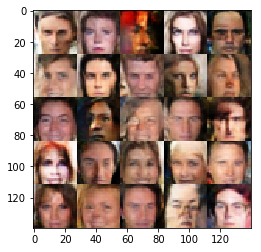

Epoch 2/3... Batch 4510  Discriminator Loss: 1.3874... Generator Loss: 0.9248
Epoch 2/3... Batch 4520  Discriminator Loss: 1.4912... Generator Loss: 0.7521
Epoch 2/3... Batch 4530  Discriminator Loss: 1.4567... Generator Loss: 0.7509
Epoch 2/3... Batch 4540  Discriminator Loss: 1.3685... Generator Loss: 0.7122
Epoch 2/3... Batch 4550  Discriminator Loss: 1.3508... Generator Loss: 0.8671
Epoch 2/3... Batch 4560  Discriminator Loss: 1.4648... Generator Loss: 0.7624
Epoch 2/3... Batch 4570  Discriminator Loss: 1.3582... Generator Loss: 0.8027
Epoch 2/3... Batch 4580  Discriminator Loss: 1.3072... Generator Loss: 0.7932
Epoch 2/3... Batch 4590  Discriminator Loss: 1.3945... Generator Loss: 0.8434
Epoch 2/3... Batch 4600  Discriminator Loss: 1.3469... Generator Loss: 0.7677


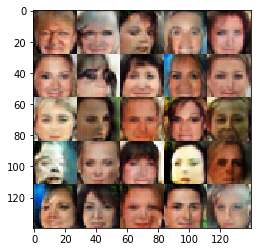

Epoch 2/3... Batch 4610  Discriminator Loss: 1.4441... Generator Loss: 0.6965
Epoch 2/3... Batch 4620  Discriminator Loss: 1.3443... Generator Loss: 0.8202
Epoch 2/3... Batch 4630  Discriminator Loss: 1.4344... Generator Loss: 0.7279
Epoch 2/3... Batch 4640  Discriminator Loss: 1.4185... Generator Loss: 0.7172
Epoch 2/3... Batch 4650  Discriminator Loss: 1.4408... Generator Loss: 0.7702
Epoch 2/3... Batch 4660  Discriminator Loss: 1.4182... Generator Loss: 0.7864
Epoch 2/3... Batch 4670  Discriminator Loss: 1.4183... Generator Loss: 0.7254
Epoch 2/3... Batch 4680  Discriminator Loss: 1.4615... Generator Loss: 0.6707
Epoch 2/3... Batch 4690  Discriminator Loss: 1.4010... Generator Loss: 0.7206
Epoch 2/3... Batch 4700  Discriminator Loss: 1.3924... Generator Loss: 0.7468


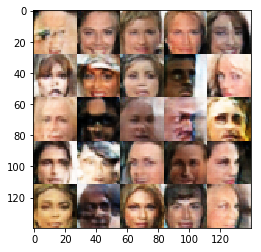

Epoch 2/3... Batch 4710  Discriminator Loss: 1.3246... Generator Loss: 0.8108
Epoch 2/3... Batch 4720  Discriminator Loss: 1.3702... Generator Loss: 0.7677
Epoch 2/3... Batch 4730  Discriminator Loss: 1.3755... Generator Loss: 0.8305
Epoch 2/3... Batch 4740  Discriminator Loss: 1.4071... Generator Loss: 0.7650
Epoch 2/3... Batch 4750  Discriminator Loss: 1.3367... Generator Loss: 0.7516
Epoch 2/3... Batch 4760  Discriminator Loss: 1.3687... Generator Loss: 0.8391
Epoch 2/3... Batch 4770  Discriminator Loss: 1.3874... Generator Loss: 0.8323
Epoch 2/3... Batch 4780  Discriminator Loss: 1.3761... Generator Loss: 0.7501
Epoch 2/3... Batch 4790  Discriminator Loss: 1.3826... Generator Loss: 0.7502
Epoch 2/3... Batch 4800  Discriminator Loss: 1.3931... Generator Loss: 0.7546


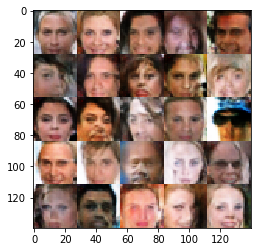

Epoch 2/3... Batch 4810  Discriminator Loss: 1.3915... Generator Loss: 0.8070
Epoch 2/3... Batch 4820  Discriminator Loss: 1.4270... Generator Loss: 0.8510
Epoch 2/3... Batch 4830  Discriminator Loss: 1.4016... Generator Loss: 0.7747
Epoch 2/3... Batch 4840  Discriminator Loss: 1.4382... Generator Loss: 0.7589
Epoch 2/3... Batch 4850  Discriminator Loss: 1.3980... Generator Loss: 0.6930
Epoch 2/3... Batch 4860  Discriminator Loss: 1.3558... Generator Loss: 0.6924
Epoch 2/3... Batch 4870  Discriminator Loss: 1.3876... Generator Loss: 0.8739
Epoch 2/3... Batch 4880  Discriminator Loss: 1.3773... Generator Loss: 0.9576
Epoch 2/3... Batch 4890  Discriminator Loss: 1.3916... Generator Loss: 0.8046
Epoch 2/3... Batch 4900  Discriminator Loss: 1.3880... Generator Loss: 0.7851


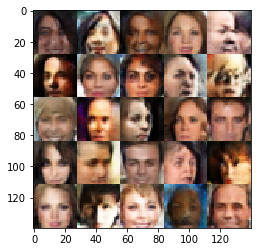

Epoch 2/3... Batch 4910  Discriminator Loss: 1.4346... Generator Loss: 0.6963
Epoch 2/3... Batch 4920  Discriminator Loss: 1.3899... Generator Loss: 0.8061
Epoch 2/3... Batch 4930  Discriminator Loss: 1.3593... Generator Loss: 0.8269
Epoch 2/3... Batch 4940  Discriminator Loss: 1.4257... Generator Loss: 0.6806
Epoch 2/3... Batch 4950  Discriminator Loss: 1.4758... Generator Loss: 0.7518
Epoch 2/3... Batch 4960  Discriminator Loss: 1.3164... Generator Loss: 0.7665
Epoch 2/3... Batch 4970  Discriminator Loss: 1.3858... Generator Loss: 0.7287
Epoch 2/3... Batch 4980  Discriminator Loss: 1.4158... Generator Loss: 0.8230
Epoch 2/3... Batch 4990  Discriminator Loss: 1.3695... Generator Loss: 0.8031
Epoch 2/3... Batch 5000  Discriminator Loss: 1.3745... Generator Loss: 0.7871


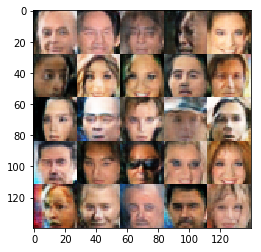

Epoch 2/3... Batch 5010  Discriminator Loss: 1.3703... Generator Loss: 0.6996
Epoch 2/3... Batch 5020  Discriminator Loss: 1.4541... Generator Loss: 0.6543
Epoch 2/3... Batch 5030  Discriminator Loss: 1.4090... Generator Loss: 0.6728
Epoch 2/3... Batch 5040  Discriminator Loss: 1.3874... Generator Loss: 0.7681
Epoch 2/3... Batch 5050  Discriminator Loss: 1.4380... Generator Loss: 0.7861
Epoch 2/3... Batch 5060  Discriminator Loss: 1.3988... Generator Loss: 0.8247
Epoch 2/3... Batch 5070  Discriminator Loss: 1.3566... Generator Loss: 0.8719
Epoch 2/3... Batch 5080  Discriminator Loss: 1.3897... Generator Loss: 0.7599
Epoch 2/3... Batch 5090  Discriminator Loss: 1.4078... Generator Loss: 0.6969
Epoch 2/3... Batch 5100  Discriminator Loss: 1.3647... Generator Loss: 0.7798


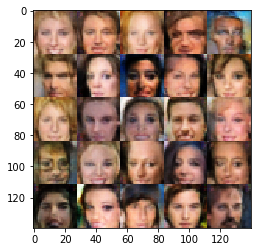

Epoch 2/3... Batch 5110  Discriminator Loss: 1.4091... Generator Loss: 0.6798
Epoch 2/3... Batch 5120  Discriminator Loss: 1.4606... Generator Loss: 0.6586
Epoch 2/3... Batch 5130  Discriminator Loss: 1.4089... Generator Loss: 0.7930
Epoch 2/3... Batch 5140  Discriminator Loss: 1.4604... Generator Loss: 0.7929
Epoch 2/3... Batch 5150  Discriminator Loss: 1.4016... Generator Loss: 0.8319
Epoch 2/3... Batch 5160  Discriminator Loss: 1.3204... Generator Loss: 0.7954
Epoch 2/3... Batch 5170  Discriminator Loss: 1.3854... Generator Loss: 0.7756
Epoch 2/3... Batch 5180  Discriminator Loss: 1.3752... Generator Loss: 0.7608
Epoch 2/3... Batch 5190  Discriminator Loss: 1.3474... Generator Loss: 0.8018
Epoch 2/3... Batch 5200  Discriminator Loss: 1.3634... Generator Loss: 0.7220


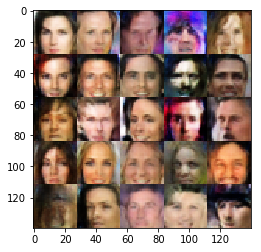

Epoch 2/3... Batch 5210  Discriminator Loss: 1.4644... Generator Loss: 0.8077
Epoch 2/3... Batch 5220  Discriminator Loss: 1.3811... Generator Loss: 0.7448
Epoch 2/3... Batch 5230  Discriminator Loss: 1.4047... Generator Loss: 0.6661
Epoch 2/3... Batch 5240  Discriminator Loss: 1.3823... Generator Loss: 0.7508
Epoch 2/3... Batch 5250  Discriminator Loss: 1.3231... Generator Loss: 0.8042
Epoch 2/3... Batch 5260  Discriminator Loss: 1.4207... Generator Loss: 0.7282
Epoch 2/3... Batch 5270  Discriminator Loss: 1.2795... Generator Loss: 0.8734
Epoch 2/3... Batch 5280  Discriminator Loss: 1.4110... Generator Loss: 0.7300
Epoch 2/3... Batch 5290  Discriminator Loss: 1.3478... Generator Loss: 0.6689
Epoch 2/3... Batch 5300  Discriminator Loss: 1.3914... Generator Loss: 0.7768


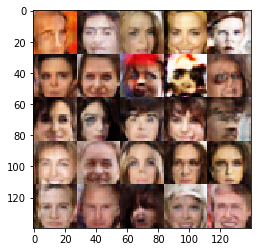

Epoch 2/3... Batch 5310  Discriminator Loss: 1.4252... Generator Loss: 0.7372
Epoch 2/3... Batch 5320  Discriminator Loss: 1.4030... Generator Loss: 0.8170
Epoch 2/3... Batch 5330  Discriminator Loss: 1.3704... Generator Loss: 0.7596
Epoch 2/3... Batch 5340  Discriminator Loss: 1.3614... Generator Loss: 0.8173
Epoch 2/3... Batch 5350  Discriminator Loss: 1.3217... Generator Loss: 0.8048
Epoch 2/3... Batch 5360  Discriminator Loss: 1.4205... Generator Loss: 0.6696
Epoch 2/3... Batch 5370  Discriminator Loss: 1.4074... Generator Loss: 0.7584
Epoch 2/3... Batch 5380  Discriminator Loss: 1.4132... Generator Loss: 0.7323
Epoch 2/3... Batch 5390  Discriminator Loss: 1.3821... Generator Loss: 0.7942
Epoch 2/3... Batch 5400  Discriminator Loss: 1.3298... Generator Loss: 0.7642


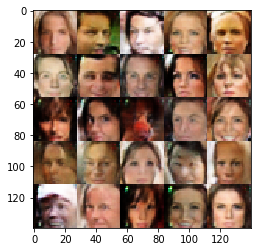

Epoch 2/3... Batch 5410  Discriminator Loss: 1.4207... Generator Loss: 0.8163
Epoch 2/3... Batch 5420  Discriminator Loss: 1.3906... Generator Loss: 0.8677
Epoch 2/3... Batch 5430  Discriminator Loss: 1.3098... Generator Loss: 0.7676
Epoch 2/3... Batch 5440  Discriminator Loss: 1.4158... Generator Loss: 0.7626
Epoch 2/3... Batch 5450  Discriminator Loss: 1.4799... Generator Loss: 0.6521
Epoch 2/3... Batch 5460  Discriminator Loss: 1.3998... Generator Loss: 0.7168
Epoch 2/3... Batch 5470  Discriminator Loss: 1.4142... Generator Loss: 0.7668
Epoch 2/3... Batch 5480  Discriminator Loss: 1.4047... Generator Loss: 0.6997
Epoch 2/3... Batch 5490  Discriminator Loss: 1.4195... Generator Loss: 0.6970
Epoch 2/3... Batch 5500  Discriminator Loss: 1.4228... Generator Loss: 0.6061


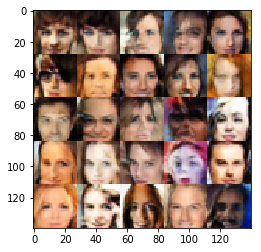

Epoch 2/3... Batch 5510  Discriminator Loss: 1.3463... Generator Loss: 0.7431
Epoch 2/3... Batch 5520  Discriminator Loss: 1.3839... Generator Loss: 0.7012
Epoch 2/3... Batch 5530  Discriminator Loss: 1.3742... Generator Loss: 0.7246
Epoch 2/3... Batch 5540  Discriminator Loss: 1.3660... Generator Loss: 0.7482
Epoch 2/3... Batch 5550  Discriminator Loss: 1.3946... Generator Loss: 0.7303
Epoch 2/3... Batch 5560  Discriminator Loss: 1.3629... Generator Loss: 0.8327
Epoch 2/3... Batch 5570  Discriminator Loss: 1.3528... Generator Loss: 0.8689
Epoch 2/3... Batch 5580  Discriminator Loss: 1.3770... Generator Loss: 0.7370
Epoch 2/3... Batch 5590  Discriminator Loss: 1.3953... Generator Loss: 0.7389
Epoch 2/3... Batch 5600  Discriminator Loss: 1.3989... Generator Loss: 0.7507


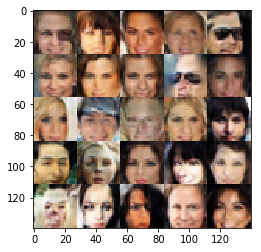

Epoch 2/3... Batch 5610  Discriminator Loss: 1.4390... Generator Loss: 0.7482
Epoch 2/3... Batch 5620  Discriminator Loss: 1.3966... Generator Loss: 0.7679
Epoch 2/3... Batch 5630  Discriminator Loss: 1.3953... Generator Loss: 0.7065
Epoch 2/3... Batch 5640  Discriminator Loss: 1.3650... Generator Loss: 0.7133
Epoch 2/3... Batch 5650  Discriminator Loss: 1.4269... Generator Loss: 0.7538
Epoch 2/3... Batch 5660  Discriminator Loss: 1.3534... Generator Loss: 0.7032
Epoch 2/3... Batch 5670  Discriminator Loss: 1.3491... Generator Loss: 0.7573
Epoch 2/3... Batch 5680  Discriminator Loss: 1.4098... Generator Loss: 0.8170
Epoch 2/3... Batch 5690  Discriminator Loss: 1.3731... Generator Loss: 0.7876
Epoch 2/3... Batch 5700  Discriminator Loss: 1.3421... Generator Loss: 0.7561


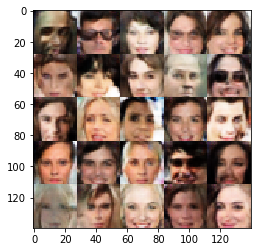

Epoch 2/3... Batch 5710  Discriminator Loss: 1.3992... Generator Loss: 0.8180
Epoch 2/3... Batch 5720  Discriminator Loss: 1.3881... Generator Loss: 0.7438
Epoch 2/3... Batch 5730  Discriminator Loss: 1.4448... Generator Loss: 0.6925
Epoch 2/3... Batch 5740  Discriminator Loss: 1.3370... Generator Loss: 0.8730
Epoch 2/3... Batch 5750  Discriminator Loss: 1.4276... Generator Loss: 0.7704
Epoch 2/3... Batch 5760  Discriminator Loss: 1.4289... Generator Loss: 0.7250
Epoch 2/3... Batch 5770  Discriminator Loss: 1.3804... Generator Loss: 0.7592
Epoch 2/3... Batch 5780  Discriminator Loss: 1.4037... Generator Loss: 0.7773
Epoch 2/3... Batch 5790  Discriminator Loss: 1.3805... Generator Loss: 0.7961
Epoch 2/3... Batch 5800  Discriminator Loss: 1.4260... Generator Loss: 0.7359


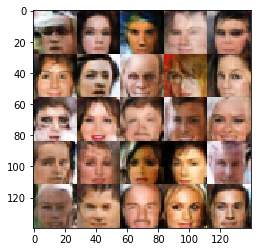

Epoch 2/3... Batch 5810  Discriminator Loss: 1.4616... Generator Loss: 0.7114
Epoch 2/3... Batch 5820  Discriminator Loss: 1.3846... Generator Loss: 0.8299
Epoch 2/3... Batch 5830  Discriminator Loss: 1.3277... Generator Loss: 0.7816
Epoch 2/3... Batch 5840  Discriminator Loss: 1.3837... Generator Loss: 0.8223
Epoch 2/3... Batch 5850  Discriminator Loss: 1.4335... Generator Loss: 0.6718
Epoch 2/3... Batch 5860  Discriminator Loss: 1.3645... Generator Loss: 0.7939
Epoch 2/3... Batch 5870  Discriminator Loss: 1.3840... Generator Loss: 0.8270
Epoch 2/3... Batch 5880  Discriminator Loss: 1.4011... Generator Loss: 0.7542
Epoch 2/3... Batch 5890  Discriminator Loss: 1.3523... Generator Loss: 0.8695
Epoch 2/3... Batch 5900  Discriminator Loss: 1.3879... Generator Loss: 0.7549


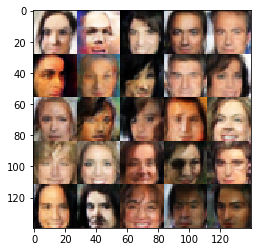

Epoch 2/3... Batch 5910  Discriminator Loss: 1.4191... Generator Loss: 0.7886
Epoch 2/3... Batch 5920  Discriminator Loss: 1.3303... Generator Loss: 0.8843
Epoch 2/3... Batch 5930  Discriminator Loss: 1.3856... Generator Loss: 0.7541
Epoch 2/3... Batch 5940  Discriminator Loss: 1.3512... Generator Loss: 0.8466
Epoch 2/3... Batch 5950  Discriminator Loss: 1.4268... Generator Loss: 0.7605
Epoch 2/3... Batch 5960  Discriminator Loss: 1.3232... Generator Loss: 0.8484
Epoch 2/3... Batch 5970  Discriminator Loss: 1.4205... Generator Loss: 0.7768
Epoch 2/3... Batch 5980  Discriminator Loss: 1.4642... Generator Loss: 0.6524
Epoch 2/3... Batch 5990  Discriminator Loss: 1.4302... Generator Loss: 0.7210
Epoch 2/3... Batch 6000  Discriminator Loss: 1.3452... Generator Loss: 0.7167


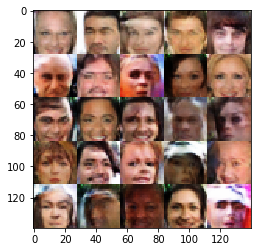

Epoch 2/3... Batch 6010  Discriminator Loss: 1.4168... Generator Loss: 0.7807
Epoch 2/3... Batch 6020  Discriminator Loss: 1.3259... Generator Loss: 0.7658
Epoch 2/3... Batch 6030  Discriminator Loss: 1.3476... Generator Loss: 0.6605
Epoch 2/3... Batch 6040  Discriminator Loss: 1.3845... Generator Loss: 0.7199
Epoch 2/3... Batch 6050  Discriminator Loss: 1.4246... Generator Loss: 0.8055
Epoch 2/3... Batch 6060  Discriminator Loss: 1.3835... Generator Loss: 0.7711
Epoch 2/3... Batch 6070  Discriminator Loss: 1.3679... Generator Loss: 0.8161
Epoch 2/3... Batch 6080  Discriminator Loss: 1.4759... Generator Loss: 0.7779
Epoch 2/3... Batch 6090  Discriminator Loss: 1.3734... Generator Loss: 0.7265
Epoch 2/3... Batch 6100  Discriminator Loss: 1.4355... Generator Loss: 0.7844


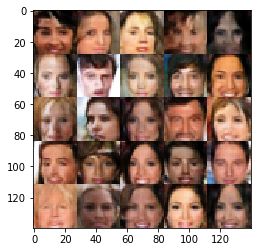

Epoch 2/3... Batch 6110  Discriminator Loss: 1.3704... Generator Loss: 0.7832
Epoch 2/3... Batch 6120  Discriminator Loss: 1.3643... Generator Loss: 0.7420
Epoch 2/3... Batch 6130  Discriminator Loss: 1.4301... Generator Loss: 0.7859
Epoch 2/3... Batch 6140  Discriminator Loss: 1.4319... Generator Loss: 0.7238
Epoch 2/3... Batch 6150  Discriminator Loss: 1.3663... Generator Loss: 0.8215
Epoch 2/3... Batch 6160  Discriminator Loss: 1.3847... Generator Loss: 0.6991
Epoch 2/3... Batch 6170  Discriminator Loss: 1.4666... Generator Loss: 0.6639
Epoch 2/3... Batch 6180  Discriminator Loss: 1.3313... Generator Loss: 0.7861
Epoch 2/3... Batch 6190  Discriminator Loss: 1.3450... Generator Loss: 0.7717
Epoch 2/3... Batch 6200  Discriminator Loss: 1.3509... Generator Loss: 0.7700


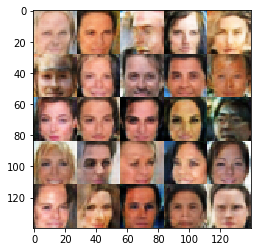

Epoch 2/3... Batch 6210  Discriminator Loss: 1.3790... Generator Loss: 0.7689
Epoch 2/3... Batch 6220  Discriminator Loss: 1.3257... Generator Loss: 0.7247
Epoch 2/3... Batch 6230  Discriminator Loss: 1.3781... Generator Loss: 0.6860
Epoch 2/3... Batch 6240  Discriminator Loss: 1.3602... Generator Loss: 0.8474
Epoch 2/3... Batch 6250  Discriminator Loss: 1.4149... Generator Loss: 0.6525
Epoch 2/3... Batch 6260  Discriminator Loss: 1.3914... Generator Loss: 0.7244
Epoch 2/3... Batch 6270  Discriminator Loss: 1.3464... Generator Loss: 0.7775
Epoch 2/3... Batch 6280  Discriminator Loss: 1.3758... Generator Loss: 0.8261
Epoch 2/3... Batch 6290  Discriminator Loss: 1.3952... Generator Loss: 0.9126
Epoch 2/3... Batch 6300  Discriminator Loss: 1.3721... Generator Loss: 0.7372


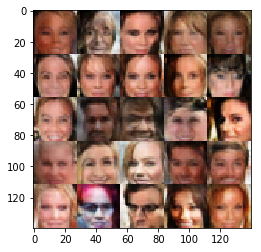

Epoch 2/3... Batch 6310  Discriminator Loss: 1.3966... Generator Loss: 0.8510
Epoch 2/3... Batch 6320  Discriminator Loss: 1.4356... Generator Loss: 0.7127
Epoch 2/3... Batch 6330  Discriminator Loss: 1.4024... Generator Loss: 0.7539
Epoch 3/3... Batch 10  Discriminator Loss: 1.4021... Generator Loss: 0.6810
Epoch 3/3... Batch 20  Discriminator Loss: 1.3978... Generator Loss: 0.9564
Epoch 3/3... Batch 30  Discriminator Loss: 1.3834... Generator Loss: 0.8341
Epoch 3/3... Batch 40  Discriminator Loss: 1.3454... Generator Loss: 0.8380
Epoch 3/3... Batch 50  Discriminator Loss: 1.4046... Generator Loss: 0.7576
Epoch 3/3... Batch 60  Discriminator Loss: 1.3286... Generator Loss: 0.8817
Epoch 3/3... Batch 70  Discriminator Loss: 1.3553... Generator Loss: 0.8155
Epoch 3/3... Batch 80  Discriminator Loss: 1.4620... Generator Loss: 0.6305
Epoch 3/3... Batch 90  Discriminator Loss: 1.4085... Generator Loss: 0.7856
Epoch 3/3... Batch 100  Discriminator Loss: 1.4243... Generator Loss: 0.6706


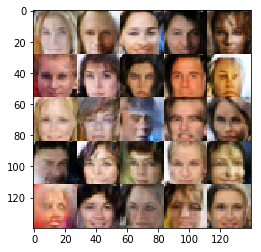

Epoch 3/3... Batch 110  Discriminator Loss: 1.3358... Generator Loss: 0.7051
Epoch 3/3... Batch 120  Discriminator Loss: 1.3841... Generator Loss: 0.7081
Epoch 3/3... Batch 130  Discriminator Loss: 1.3952... Generator Loss: 0.7019
Epoch 3/3... Batch 140  Discriminator Loss: 1.3825... Generator Loss: 0.7212
Epoch 3/3... Batch 150  Discriminator Loss: 1.4105... Generator Loss: 0.7148
Epoch 3/3... Batch 160  Discriminator Loss: 1.4172... Generator Loss: 0.7426
Epoch 3/3... Batch 170  Discriminator Loss: 1.3619... Generator Loss: 0.7321
Epoch 3/3... Batch 180  Discriminator Loss: 1.3918... Generator Loss: 0.7430
Epoch 3/3... Batch 190  Discriminator Loss: 1.4640... Generator Loss: 0.7635
Epoch 3/3... Batch 200  Discriminator Loss: 1.4433... Generator Loss: 0.6149


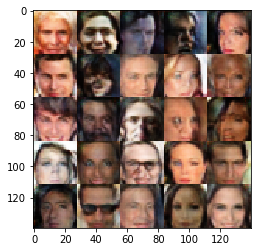

Epoch 3/3... Batch 210  Discriminator Loss: 1.3703... Generator Loss: 0.7482
Epoch 3/3... Batch 220  Discriminator Loss: 1.3631... Generator Loss: 0.8026
Epoch 3/3... Batch 230  Discriminator Loss: 1.3844... Generator Loss: 0.8973
Epoch 3/3... Batch 240  Discriminator Loss: 1.4047... Generator Loss: 0.8606
Epoch 3/3... Batch 250  Discriminator Loss: 1.3072... Generator Loss: 0.8767
Epoch 3/3... Batch 260  Discriminator Loss: 1.4945... Generator Loss: 0.6475
Epoch 3/3... Batch 270  Discriminator Loss: 1.3761... Generator Loss: 0.7870
Epoch 3/3... Batch 280  Discriminator Loss: 1.4298... Generator Loss: 0.7417
Epoch 3/3... Batch 290  Discriminator Loss: 1.3473... Generator Loss: 0.8161
Epoch 3/3... Batch 300  Discriminator Loss: 1.4070... Generator Loss: 0.8788


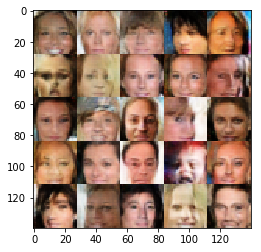

Epoch 3/3... Batch 310  Discriminator Loss: 1.3557... Generator Loss: 0.7435
Epoch 3/3... Batch 320  Discriminator Loss: 1.4921... Generator Loss: 0.6999
Epoch 3/3... Batch 330  Discriminator Loss: 1.4318... Generator Loss: 0.7756
Epoch 3/3... Batch 340  Discriminator Loss: 1.3399... Generator Loss: 0.8396
Epoch 3/3... Batch 350  Discriminator Loss: 1.3978... Generator Loss: 0.7781
Epoch 3/3... Batch 360  Discriminator Loss: 1.3341... Generator Loss: 0.7302
Epoch 3/3... Batch 370  Discriminator Loss: 1.3973... Generator Loss: 0.7685
Epoch 3/3... Batch 380  Discriminator Loss: 1.4535... Generator Loss: 0.7553
Epoch 3/3... Batch 390  Discriminator Loss: 1.3481... Generator Loss: 0.7625
Epoch 3/3... Batch 400  Discriminator Loss: 1.4189... Generator Loss: 0.8084


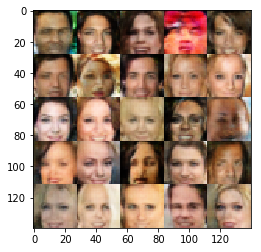

Epoch 3/3... Batch 410  Discriminator Loss: 1.3901... Generator Loss: 0.7809
Epoch 3/3... Batch 420  Discriminator Loss: 1.4119... Generator Loss: 0.7577
Epoch 3/3... Batch 430  Discriminator Loss: 1.4535... Generator Loss: 0.6529
Epoch 3/3... Batch 440  Discriminator Loss: 1.3936... Generator Loss: 0.9342
Epoch 3/3... Batch 450  Discriminator Loss: 1.3329... Generator Loss: 0.8601
Epoch 3/3... Batch 460  Discriminator Loss: 1.4757... Generator Loss: 0.7377
Epoch 3/3... Batch 470  Discriminator Loss: 1.4319... Generator Loss: 0.6877
Epoch 3/3... Batch 480  Discriminator Loss: 1.4425... Generator Loss: 0.7176
Epoch 3/3... Batch 490  Discriminator Loss: 1.5047... Generator Loss: 0.7518
Epoch 3/3... Batch 500  Discriminator Loss: 1.4008... Generator Loss: 0.8368


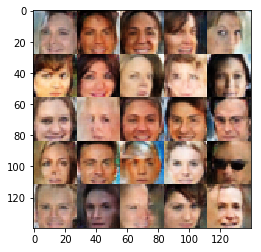

Epoch 3/3... Batch 510  Discriminator Loss: 1.2879... Generator Loss: 0.8160
Epoch 3/3... Batch 520  Discriminator Loss: 1.3948... Generator Loss: 0.6729
Epoch 3/3... Batch 530  Discriminator Loss: 1.2944... Generator Loss: 0.8461
Epoch 3/3... Batch 540  Discriminator Loss: 1.4224... Generator Loss: 0.7068
Epoch 3/3... Batch 550  Discriminator Loss: 1.2863... Generator Loss: 0.7986
Epoch 3/3... Batch 560  Discriminator Loss: 1.3863... Generator Loss: 0.7577
Epoch 3/3... Batch 570  Discriminator Loss: 1.3923... Generator Loss: 0.7015
Epoch 3/3... Batch 580  Discriminator Loss: 1.3255... Generator Loss: 0.8195
Epoch 3/3... Batch 590  Discriminator Loss: 1.4681... Generator Loss: 0.7221
Epoch 3/3... Batch 600  Discriminator Loss: 1.3563... Generator Loss: 0.6743


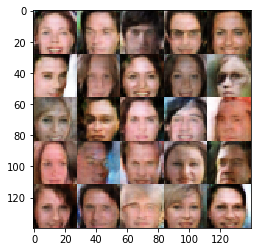

Epoch 3/3... Batch 610  Discriminator Loss: 1.3855... Generator Loss: 0.7813
Epoch 3/3... Batch 620  Discriminator Loss: 1.3599... Generator Loss: 0.8335
Epoch 3/3... Batch 630  Discriminator Loss: 1.3138... Generator Loss: 0.7415
Epoch 3/3... Batch 640  Discriminator Loss: 1.3187... Generator Loss: 0.8036
Epoch 3/3... Batch 650  Discriminator Loss: 1.2940... Generator Loss: 0.8115
Epoch 3/3... Batch 660  Discriminator Loss: 1.3583... Generator Loss: 0.7730
Epoch 3/3... Batch 670  Discriminator Loss: 1.4023... Generator Loss: 0.7334
Epoch 3/3... Batch 680  Discriminator Loss: 1.4220... Generator Loss: 0.6984
Epoch 3/3... Batch 690  Discriminator Loss: 1.4073... Generator Loss: 0.8172
Epoch 3/3... Batch 700  Discriminator Loss: 1.3492... Generator Loss: 0.8148


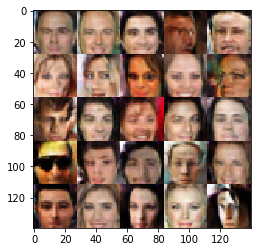

Epoch 3/3... Batch 710  Discriminator Loss: 1.3844... Generator Loss: 0.8424
Epoch 3/3... Batch 720  Discriminator Loss: 1.3294... Generator Loss: 0.8433
Epoch 3/3... Batch 730  Discriminator Loss: 1.4815... Generator Loss: 0.6945
Epoch 3/3... Batch 740  Discriminator Loss: 1.3617... Generator Loss: 0.8391
Epoch 3/3... Batch 750  Discriminator Loss: 1.3588... Generator Loss: 0.9156
Epoch 3/3... Batch 760  Discriminator Loss: 1.4523... Generator Loss: 0.7321
Epoch 3/3... Batch 770  Discriminator Loss: 1.3634... Generator Loss: 0.7966
Epoch 3/3... Batch 780  Discriminator Loss: 1.3926... Generator Loss: 0.7419
Epoch 3/3... Batch 790  Discriminator Loss: 1.4472... Generator Loss: 0.7365
Epoch 3/3... Batch 800  Discriminator Loss: 1.3586... Generator Loss: 0.8821


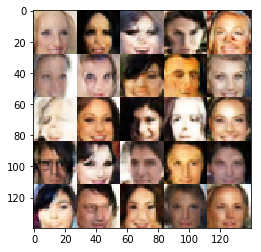

Epoch 3/3... Batch 810  Discriminator Loss: 1.3993... Generator Loss: 0.8551
Epoch 3/3... Batch 820  Discriminator Loss: 1.3769... Generator Loss: 0.7672
Epoch 3/3... Batch 830  Discriminator Loss: 1.3414... Generator Loss: 0.8644
Epoch 3/3... Batch 840  Discriminator Loss: 1.3845... Generator Loss: 0.7740
Epoch 3/3... Batch 850  Discriminator Loss: 1.3400... Generator Loss: 0.8332
Epoch 3/3... Batch 860  Discriminator Loss: 1.4444... Generator Loss: 0.8620
Epoch 3/3... Batch 870  Discriminator Loss: 1.4204... Generator Loss: 0.7740
Epoch 3/3... Batch 880  Discriminator Loss: 1.4255... Generator Loss: 0.8490
Epoch 3/3... Batch 890  Discriminator Loss: 1.3478... Generator Loss: 0.7448
Epoch 3/3... Batch 900  Discriminator Loss: 1.4246... Generator Loss: 0.7672


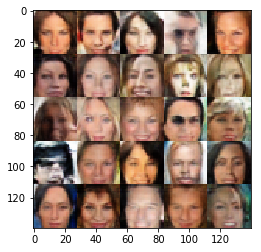

Epoch 3/3... Batch 910  Discriminator Loss: 1.3234... Generator Loss: 0.7886
Epoch 3/3... Batch 920  Discriminator Loss: 1.3852... Generator Loss: 0.7267
Epoch 3/3... Batch 930  Discriminator Loss: 1.4568... Generator Loss: 0.7430
Epoch 3/3... Batch 940  Discriminator Loss: 1.3385... Generator Loss: 0.8216
Epoch 3/3... Batch 950  Discriminator Loss: 1.2767... Generator Loss: 0.8005
Epoch 3/3... Batch 960  Discriminator Loss: 1.4215... Generator Loss: 0.7551
Epoch 3/3... Batch 970  Discriminator Loss: 1.4118... Generator Loss: 0.7104
Epoch 3/3... Batch 980  Discriminator Loss: 1.3750... Generator Loss: 0.7419
Epoch 3/3... Batch 990  Discriminator Loss: 1.4070... Generator Loss: 0.7709
Epoch 3/3... Batch 1000  Discriminator Loss: 1.3513... Generator Loss: 0.7671


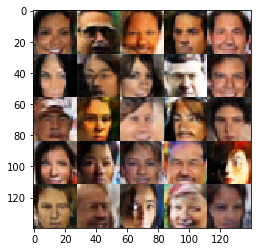

Epoch 3/3... Batch 1010  Discriminator Loss: 1.3279... Generator Loss: 0.8542
Epoch 3/3... Batch 1020  Discriminator Loss: 1.4138... Generator Loss: 0.7224
Epoch 3/3... Batch 1030  Discriminator Loss: 1.4006... Generator Loss: 0.8151
Epoch 3/3... Batch 1040  Discriminator Loss: 1.3629... Generator Loss: 0.8730
Epoch 3/3... Batch 1050  Discriminator Loss: 1.4064... Generator Loss: 0.7721
Epoch 3/3... Batch 1060  Discriminator Loss: 1.3870... Generator Loss: 0.6808
Epoch 3/3... Batch 1070  Discriminator Loss: 1.4126... Generator Loss: 0.7829
Epoch 3/3... Batch 1080  Discriminator Loss: 1.3939... Generator Loss: 0.7367
Epoch 3/3... Batch 1090  Discriminator Loss: 1.3641... Generator Loss: 0.7957
Epoch 3/3... Batch 1100  Discriminator Loss: 1.4228... Generator Loss: 0.6299


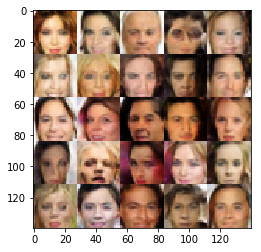

Epoch 3/3... Batch 1110  Discriminator Loss: 1.4839... Generator Loss: 0.8734
Epoch 3/3... Batch 1120  Discriminator Loss: 1.3208... Generator Loss: 0.7914
Epoch 3/3... Batch 1130  Discriminator Loss: 1.3761... Generator Loss: 0.7145
Epoch 3/3... Batch 1140  Discriminator Loss: 1.3829... Generator Loss: 0.7977
Epoch 3/3... Batch 1150  Discriminator Loss: 1.3464... Generator Loss: 0.7721
Epoch 3/3... Batch 1160  Discriminator Loss: 1.3535... Generator Loss: 0.6897
Epoch 3/3... Batch 1170  Discriminator Loss: 1.3915... Generator Loss: 0.7001
Epoch 3/3... Batch 1180  Discriminator Loss: 1.3784... Generator Loss: 0.7505
Epoch 3/3... Batch 1190  Discriminator Loss: 1.3918... Generator Loss: 0.8393
Epoch 3/3... Batch 1200  Discriminator Loss: 1.3510... Generator Loss: 0.7981


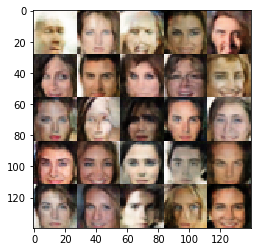

Epoch 3/3... Batch 1210  Discriminator Loss: 1.3360... Generator Loss: 0.8517
Epoch 3/3... Batch 1220  Discriminator Loss: 1.4102... Generator Loss: 0.7017
Epoch 3/3... Batch 1230  Discriminator Loss: 1.3899... Generator Loss: 0.7441
Epoch 3/3... Batch 1240  Discriminator Loss: 1.3998... Generator Loss: 0.7280
Epoch 3/3... Batch 1250  Discriminator Loss: 1.3956... Generator Loss: 0.7040
Epoch 3/3... Batch 1260  Discriminator Loss: 1.3428... Generator Loss: 0.8773
Epoch 3/3... Batch 1270  Discriminator Loss: 1.4033... Generator Loss: 0.8017
Epoch 3/3... Batch 1280  Discriminator Loss: 1.3659... Generator Loss: 0.7791
Epoch 3/3... Batch 1290  Discriminator Loss: 1.4435... Generator Loss: 0.6756
Epoch 3/3... Batch 1300  Discriminator Loss: 1.3433... Generator Loss: 0.6953


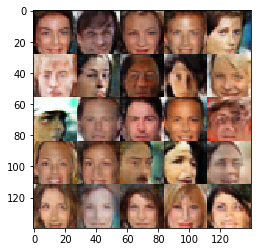

Epoch 3/3... Batch 1310  Discriminator Loss: 1.3569... Generator Loss: 0.8027
Epoch 3/3... Batch 1320  Discriminator Loss: 1.3711... Generator Loss: 0.7922
Epoch 3/3... Batch 1330  Discriminator Loss: 1.3073... Generator Loss: 0.8472
Epoch 3/3... Batch 1340  Discriminator Loss: 1.4145... Generator Loss: 0.7335
Epoch 3/3... Batch 1350  Discriminator Loss: 1.3752... Generator Loss: 0.7953
Epoch 3/3... Batch 1360  Discriminator Loss: 1.3694... Generator Loss: 0.7767
Epoch 3/3... Batch 1370  Discriminator Loss: 1.3205... Generator Loss: 0.8438
Epoch 3/3... Batch 1380  Discriminator Loss: 1.3534... Generator Loss: 0.7741
Epoch 3/3... Batch 1390  Discriminator Loss: 1.4767... Generator Loss: 0.7208
Epoch 3/3... Batch 1400  Discriminator Loss: 1.4360... Generator Loss: 0.7133


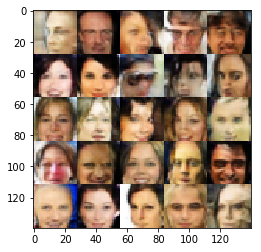

Epoch 3/3... Batch 1410  Discriminator Loss: 1.4245... Generator Loss: 0.7466
Epoch 3/3... Batch 1420  Discriminator Loss: 1.3803... Generator Loss: 0.8137
Epoch 3/3... Batch 1430  Discriminator Loss: 1.3560... Generator Loss: 0.8344
Epoch 3/3... Batch 1440  Discriminator Loss: 1.4407... Generator Loss: 0.7111
Epoch 3/3... Batch 1450  Discriminator Loss: 1.3445... Generator Loss: 0.8228
Epoch 3/3... Batch 1460  Discriminator Loss: 1.3416... Generator Loss: 0.7529
Epoch 3/3... Batch 1470  Discriminator Loss: 1.4326... Generator Loss: 0.7350
Epoch 3/3... Batch 1480  Discriminator Loss: 1.3898... Generator Loss: 0.8221
Epoch 3/3... Batch 1490  Discriminator Loss: 1.3827... Generator Loss: 0.7137
Epoch 3/3... Batch 1500  Discriminator Loss: 1.3971... Generator Loss: 0.8057


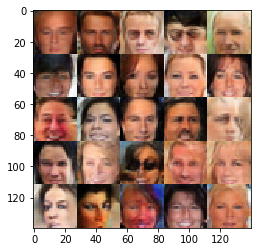

Epoch 3/3... Batch 1510  Discriminator Loss: 1.4100... Generator Loss: 0.7052
Epoch 3/3... Batch 1520  Discriminator Loss: 1.4498... Generator Loss: 0.8479
Epoch 3/3... Batch 1530  Discriminator Loss: 1.3127... Generator Loss: 0.7663
Epoch 3/3... Batch 1540  Discriminator Loss: 1.3674... Generator Loss: 0.8439
Epoch 3/3... Batch 1550  Discriminator Loss: 1.3347... Generator Loss: 0.7447
Epoch 3/3... Batch 1560  Discriminator Loss: 1.3934... Generator Loss: 0.8677
Epoch 3/3... Batch 1570  Discriminator Loss: 1.3187... Generator Loss: 0.7762
Epoch 3/3... Batch 1580  Discriminator Loss: 1.4204... Generator Loss: 0.7801
Epoch 3/3... Batch 1590  Discriminator Loss: 1.3922... Generator Loss: 0.7581
Epoch 3/3... Batch 1600  Discriminator Loss: 1.4603... Generator Loss: 0.7883


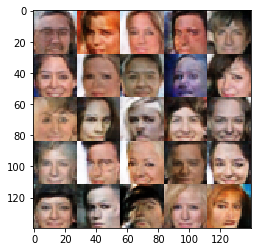

Epoch 3/3... Batch 1610  Discriminator Loss: 1.3702... Generator Loss: 0.7556
Epoch 3/3... Batch 1620  Discriminator Loss: 1.4366... Generator Loss: 0.7726
Epoch 3/3... Batch 1630  Discriminator Loss: 1.3826... Generator Loss: 0.7090
Epoch 3/3... Batch 1640  Discriminator Loss: 1.3686... Generator Loss: 0.7140
Epoch 3/3... Batch 1650  Discriminator Loss: 1.4102... Generator Loss: 0.7846
Epoch 3/3... Batch 1660  Discriminator Loss: 1.4405... Generator Loss: 0.7519
Epoch 3/3... Batch 1670  Discriminator Loss: 1.3563... Generator Loss: 0.8037
Epoch 3/3... Batch 1680  Discriminator Loss: 1.4585... Generator Loss: 0.7834
Epoch 3/3... Batch 1690  Discriminator Loss: 1.3862... Generator Loss: 0.7735
Epoch 3/3... Batch 1700  Discriminator Loss: 1.4185... Generator Loss: 0.7337


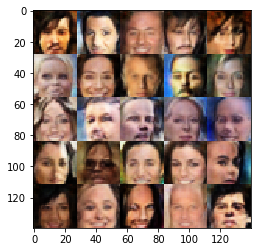

Epoch 3/3... Batch 1710  Discriminator Loss: 1.2900... Generator Loss: 0.8146
Epoch 3/3... Batch 1720  Discriminator Loss: 1.3425... Generator Loss: 0.7673
Epoch 3/3... Batch 1730  Discriminator Loss: 1.3077... Generator Loss: 0.7978
Epoch 3/3... Batch 1740  Discriminator Loss: 1.3641... Generator Loss: 0.8103
Epoch 3/3... Batch 1750  Discriminator Loss: 1.3402... Generator Loss: 0.7842
Epoch 3/3... Batch 1760  Discriminator Loss: 1.3163... Generator Loss: 0.9478
Epoch 3/3... Batch 1770  Discriminator Loss: 1.4325... Generator Loss: 0.6886
Epoch 3/3... Batch 1780  Discriminator Loss: 1.3718... Generator Loss: 0.8277
Epoch 3/3... Batch 1790  Discriminator Loss: 1.3676... Generator Loss: 0.7162
Epoch 3/3... Batch 1800  Discriminator Loss: 1.3500... Generator Loss: 0.8288


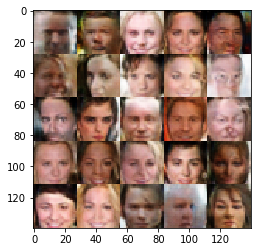

Epoch 3/3... Batch 1810  Discriminator Loss: 1.5068... Generator Loss: 0.6441
Epoch 3/3... Batch 1820  Discriminator Loss: 1.4313... Generator Loss: 0.8432
Epoch 3/3... Batch 1830  Discriminator Loss: 1.4772... Generator Loss: 0.7093
Epoch 3/3... Batch 1840  Discriminator Loss: 1.3731... Generator Loss: 0.8192
Epoch 3/3... Batch 1850  Discriminator Loss: 1.3590... Generator Loss: 0.7975
Epoch 3/3... Batch 1860  Discriminator Loss: 1.2948... Generator Loss: 0.9881
Epoch 3/3... Batch 1870  Discriminator Loss: 1.3392... Generator Loss: 0.8159
Epoch 3/3... Batch 1880  Discriminator Loss: 1.3376... Generator Loss: 0.8142
Epoch 3/3... Batch 1890  Discriminator Loss: 1.3888... Generator Loss: 0.6992
Epoch 3/3... Batch 1900  Discriminator Loss: 1.3570... Generator Loss: 0.7583


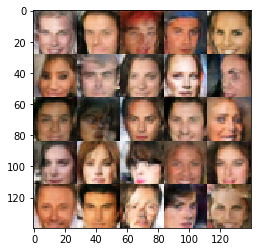

Epoch 3/3... Batch 1910  Discriminator Loss: 1.4277... Generator Loss: 0.8084
Epoch 3/3... Batch 1920  Discriminator Loss: 1.3764... Generator Loss: 0.9003
Epoch 3/3... Batch 1930  Discriminator Loss: 1.3978... Generator Loss: 0.6611
Epoch 3/3... Batch 1940  Discriminator Loss: 1.4015... Generator Loss: 0.6973
Epoch 3/3... Batch 1950  Discriminator Loss: 1.3327... Generator Loss: 0.8197
Epoch 3/3... Batch 1960  Discriminator Loss: 1.4322... Generator Loss: 0.8493
Epoch 3/3... Batch 1970  Discriminator Loss: 1.3021... Generator Loss: 0.9148
Epoch 3/3... Batch 1980  Discriminator Loss: 1.3488... Generator Loss: 0.9285
Epoch 3/3... Batch 1990  Discriminator Loss: 1.4150... Generator Loss: 0.7481
Epoch 3/3... Batch 2000  Discriminator Loss: 1.4759... Generator Loss: 0.6673


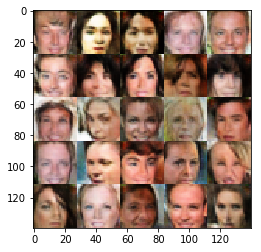

Epoch 3/3... Batch 2010  Discriminator Loss: 1.3973... Generator Loss: 0.7651
Epoch 3/3... Batch 2020  Discriminator Loss: 1.3797... Generator Loss: 0.7665
Epoch 3/3... Batch 2030  Discriminator Loss: 1.4317... Generator Loss: 0.7400
Epoch 3/3... Batch 2040  Discriminator Loss: 1.3686... Generator Loss: 0.8643
Epoch 3/3... Batch 2050  Discriminator Loss: 1.3700... Generator Loss: 0.7096
Epoch 3/3... Batch 2060  Discriminator Loss: 1.3576... Generator Loss: 0.7183
Epoch 3/3... Batch 2070  Discriminator Loss: 1.3852... Generator Loss: 0.8176
Epoch 3/3... Batch 2080  Discriminator Loss: 1.4084... Generator Loss: 0.7197
Epoch 3/3... Batch 2090  Discriminator Loss: 1.3447... Generator Loss: 0.8645
Epoch 3/3... Batch 2100  Discriminator Loss: 1.4453... Generator Loss: 0.6947


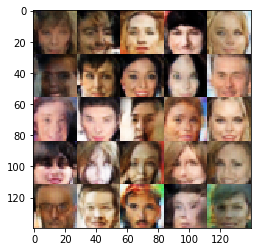

Epoch 3/3... Batch 2110  Discriminator Loss: 1.3511... Generator Loss: 0.8284
Epoch 3/3... Batch 2120  Discriminator Loss: 1.4131... Generator Loss: 0.7315
Epoch 3/3... Batch 2130  Discriminator Loss: 1.3740... Generator Loss: 0.7092
Epoch 3/3... Batch 2140  Discriminator Loss: 1.3684... Generator Loss: 0.7452
Epoch 3/3... Batch 2150  Discriminator Loss: 1.3645... Generator Loss: 0.7705
Epoch 3/3... Batch 2160  Discriminator Loss: 1.3505... Generator Loss: 0.7722
Epoch 3/3... Batch 2170  Discriminator Loss: 1.3433... Generator Loss: 0.8876
Epoch 3/3... Batch 2180  Discriminator Loss: 1.3638... Generator Loss: 0.7775
Epoch 3/3... Batch 2190  Discriminator Loss: 1.4386... Generator Loss: 0.6700
Epoch 3/3... Batch 2200  Discriminator Loss: 1.5350... Generator Loss: 0.7086


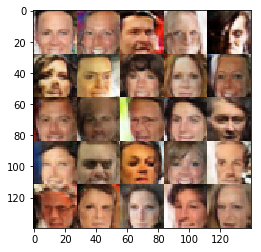

Epoch 3/3... Batch 2210  Discriminator Loss: 1.3915... Generator Loss: 0.8159
Epoch 3/3... Batch 2220  Discriminator Loss: 1.3962... Generator Loss: 0.8422
Epoch 3/3... Batch 2230  Discriminator Loss: 1.3268... Generator Loss: 0.7970
Epoch 3/3... Batch 2240  Discriminator Loss: 1.4211... Generator Loss: 0.8120
Epoch 3/3... Batch 2250  Discriminator Loss: 1.4119... Generator Loss: 0.7184
Epoch 3/3... Batch 2260  Discriminator Loss: 1.4197... Generator Loss: 0.7231
Epoch 3/3... Batch 2270  Discriminator Loss: 1.3534... Generator Loss: 0.7725
Epoch 3/3... Batch 2280  Discriminator Loss: 1.4893... Generator Loss: 0.7363
Epoch 3/3... Batch 2290  Discriminator Loss: 1.4123... Generator Loss: 0.7792
Epoch 3/3... Batch 2300  Discriminator Loss: 1.3874... Generator Loss: 0.8009


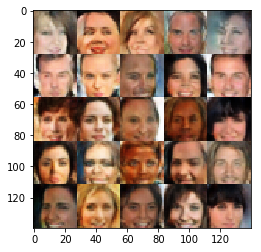

Epoch 3/3... Batch 2310  Discriminator Loss: 1.4683... Generator Loss: 0.8193
Epoch 3/3... Batch 2320  Discriminator Loss: 1.4189... Generator Loss: 0.8218
Epoch 3/3... Batch 2330  Discriminator Loss: 1.3622... Generator Loss: 0.7580
Epoch 3/3... Batch 2340  Discriminator Loss: 1.3988... Generator Loss: 0.7975
Epoch 3/3... Batch 2350  Discriminator Loss: 1.3806... Generator Loss: 0.7075
Epoch 3/3... Batch 2360  Discriminator Loss: 1.3864... Generator Loss: 0.7051
Epoch 3/3... Batch 2370  Discriminator Loss: 1.3440... Generator Loss: 0.7534
Epoch 3/3... Batch 2380  Discriminator Loss: 1.3691... Generator Loss: 0.8381
Epoch 3/3... Batch 2390  Discriminator Loss: 1.3903... Generator Loss: 0.7517
Epoch 3/3... Batch 2400  Discriminator Loss: 1.2721... Generator Loss: 0.8016


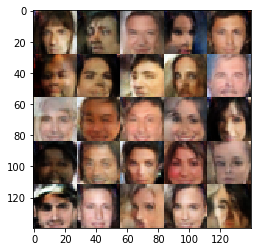

Epoch 3/3... Batch 2410  Discriminator Loss: 1.3427... Generator Loss: 0.7449
Epoch 3/3... Batch 2420  Discriminator Loss: 1.4863... Generator Loss: 0.7116
Epoch 3/3... Batch 2430  Discriminator Loss: 1.3644... Generator Loss: 0.7869
Epoch 3/3... Batch 2440  Discriminator Loss: 1.3551... Generator Loss: 0.6628
Epoch 3/3... Batch 2450  Discriminator Loss: 1.2913... Generator Loss: 0.7801
Epoch 3/3... Batch 2460  Discriminator Loss: 1.4143... Generator Loss: 0.7434
Epoch 3/3... Batch 2470  Discriminator Loss: 1.3573... Generator Loss: 0.7909
Epoch 3/3... Batch 2480  Discriminator Loss: 1.3681... Generator Loss: 0.7841
Epoch 3/3... Batch 2490  Discriminator Loss: 1.4259... Generator Loss: 0.7790
Epoch 3/3... Batch 2500  Discriminator Loss: 1.4437... Generator Loss: 0.7872


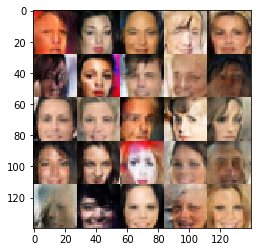

Epoch 3/3... Batch 2510  Discriminator Loss: 1.4074... Generator Loss: 0.8156
Epoch 3/3... Batch 2520  Discriminator Loss: 1.3203... Generator Loss: 0.8196
Epoch 3/3... Batch 2530  Discriminator Loss: 1.3547... Generator Loss: 0.7664
Epoch 3/3... Batch 2540  Discriminator Loss: 1.4275... Generator Loss: 0.7637
Epoch 3/3... Batch 2550  Discriminator Loss: 1.3349... Generator Loss: 0.8353
Epoch 3/3... Batch 2560  Discriminator Loss: 1.4053... Generator Loss: 0.7519
Epoch 3/3... Batch 2570  Discriminator Loss: 1.4181... Generator Loss: 0.7371
Epoch 3/3... Batch 2580  Discriminator Loss: 1.4883... Generator Loss: 0.7993
Epoch 3/3... Batch 2590  Discriminator Loss: 1.3347... Generator Loss: 0.8396
Epoch 3/3... Batch 2600  Discriminator Loss: 1.3726... Generator Loss: 0.8170


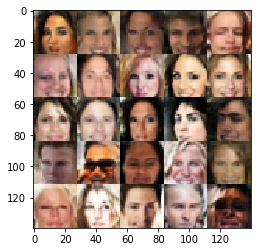

Epoch 3/3... Batch 2610  Discriminator Loss: 1.3987... Generator Loss: 0.6889
Epoch 3/3... Batch 2620  Discriminator Loss: 1.4406... Generator Loss: 0.8101
Epoch 3/3... Batch 2630  Discriminator Loss: 1.2689... Generator Loss: 0.9685
Epoch 3/3... Batch 2640  Discriminator Loss: 1.4847... Generator Loss: 0.8190
Epoch 3/3... Batch 2650  Discriminator Loss: 1.4138... Generator Loss: 0.7687
Epoch 3/3... Batch 2660  Discriminator Loss: 1.4045... Generator Loss: 0.6924
Epoch 3/3... Batch 2670  Discriminator Loss: 1.3252... Generator Loss: 0.7956
Epoch 3/3... Batch 2680  Discriminator Loss: 1.3505... Generator Loss: 0.8172
Epoch 3/3... Batch 2690  Discriminator Loss: 1.3061... Generator Loss: 0.7667
Epoch 3/3... Batch 2700  Discriminator Loss: 1.3912... Generator Loss: 0.7935


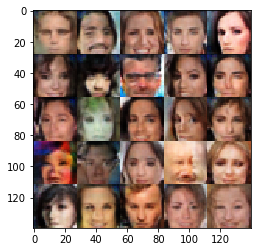

Epoch 3/3... Batch 2710  Discriminator Loss: 1.3154... Generator Loss: 0.7926
Epoch 3/3... Batch 2720  Discriminator Loss: 1.3697... Generator Loss: 0.8632
Epoch 3/3... Batch 2730  Discriminator Loss: 1.4061... Generator Loss: 0.7130
Epoch 3/3... Batch 2740  Discriminator Loss: 1.3953... Generator Loss: 0.8116
Epoch 3/3... Batch 2750  Discriminator Loss: 1.3274... Generator Loss: 0.7626
Epoch 3/3... Batch 2760  Discriminator Loss: 1.4016... Generator Loss: 0.7323
Epoch 3/3... Batch 2770  Discriminator Loss: 1.3969... Generator Loss: 0.7715
Epoch 3/3... Batch 2780  Discriminator Loss: 1.3773... Generator Loss: 0.8275
Epoch 3/3... Batch 2790  Discriminator Loss: 1.3760... Generator Loss: 0.7829
Epoch 3/3... Batch 2800  Discriminator Loss: 1.3620... Generator Loss: 0.7271


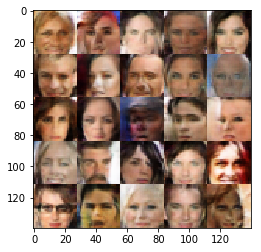

Epoch 3/3... Batch 2810  Discriminator Loss: 1.3596... Generator Loss: 0.7851
Epoch 3/3... Batch 2820  Discriminator Loss: 1.3594... Generator Loss: 0.7874
Epoch 3/3... Batch 2830  Discriminator Loss: 1.3866... Generator Loss: 0.7896
Epoch 3/3... Batch 2840  Discriminator Loss: 1.3727... Generator Loss: 0.8026
Epoch 3/3... Batch 2850  Discriminator Loss: 1.3547... Generator Loss: 0.7100
Epoch 3/3... Batch 2860  Discriminator Loss: 1.3358... Generator Loss: 0.7195
Epoch 3/3... Batch 2870  Discriminator Loss: 1.4097... Generator Loss: 0.8027
Epoch 3/3... Batch 2880  Discriminator Loss: 1.4214... Generator Loss: 0.7784
Epoch 3/3... Batch 2890  Discriminator Loss: 1.3933... Generator Loss: 0.7294
Epoch 3/3... Batch 2900  Discriminator Loss: 1.3607... Generator Loss: 0.7813


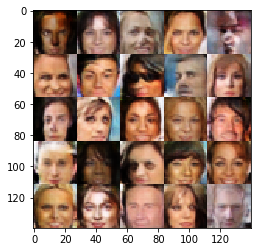

Epoch 3/3... Batch 2910  Discriminator Loss: 1.4252... Generator Loss: 0.7339
Epoch 3/3... Batch 2920  Discriminator Loss: 1.3952... Generator Loss: 0.7526
Epoch 3/3... Batch 2930  Discriminator Loss: 1.3494... Generator Loss: 0.7828
Epoch 3/3... Batch 2940  Discriminator Loss: 1.2954... Generator Loss: 0.8073
Epoch 3/3... Batch 2950  Discriminator Loss: 1.3593... Generator Loss: 0.8370
Epoch 3/3... Batch 2960  Discriminator Loss: 1.3592... Generator Loss: 0.9360
Epoch 3/3... Batch 2970  Discriminator Loss: 1.4187... Generator Loss: 0.8006
Epoch 3/3... Batch 2980  Discriminator Loss: 1.3185... Generator Loss: 0.8566
Epoch 3/3... Batch 2990  Discriminator Loss: 1.3388... Generator Loss: 0.7558
Epoch 3/3... Batch 3000  Discriminator Loss: 1.3591... Generator Loss: 0.7801


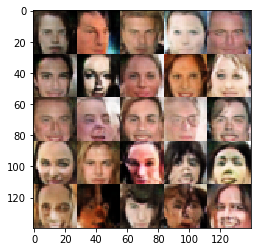

Epoch 3/3... Batch 3010  Discriminator Loss: 1.3408... Generator Loss: 0.8104
Epoch 3/3... Batch 3020  Discriminator Loss: 1.3710... Generator Loss: 0.7928
Epoch 3/3... Batch 3030  Discriminator Loss: 1.3463... Generator Loss: 0.8730
Epoch 3/3... Batch 3040  Discriminator Loss: 1.3257... Generator Loss: 0.7325
Epoch 3/3... Batch 3050  Discriminator Loss: 1.4274... Generator Loss: 0.7550
Epoch 3/3... Batch 3060  Discriminator Loss: 1.3192... Generator Loss: 0.7957
Epoch 3/3... Batch 3070  Discriminator Loss: 1.3919... Generator Loss: 0.7640
Epoch 3/3... Batch 3080  Discriminator Loss: 1.3786... Generator Loss: 0.8312
Epoch 3/3... Batch 3090  Discriminator Loss: 1.4105... Generator Loss: 0.6649
Epoch 3/3... Batch 3100  Discriminator Loss: 1.3148... Generator Loss: 0.7945


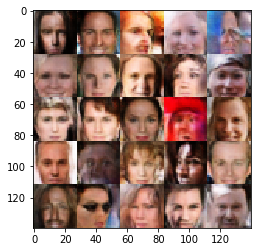

Epoch 3/3... Batch 3110  Discriminator Loss: 1.3710... Generator Loss: 0.7415
Epoch 3/3... Batch 3120  Discriminator Loss: 1.4585... Generator Loss: 0.7650
Epoch 3/3... Batch 3130  Discriminator Loss: 1.3638... Generator Loss: 0.9598
Epoch 3/3... Batch 3140  Discriminator Loss: 1.2540... Generator Loss: 0.8211
Epoch 3/3... Batch 3150  Discriminator Loss: 1.3110... Generator Loss: 0.7876
Epoch 3/3... Batch 3160  Discriminator Loss: 1.3739... Generator Loss: 0.7451
Epoch 3/3... Batch 3170  Discriminator Loss: 1.3444... Generator Loss: 0.7871
Epoch 3/3... Batch 3180  Discriminator Loss: 1.3893... Generator Loss: 0.7293
Epoch 3/3... Batch 3190  Discriminator Loss: 1.5370... Generator Loss: 0.7073
Epoch 3/3... Batch 3200  Discriminator Loss: 1.3761... Generator Loss: 0.7428


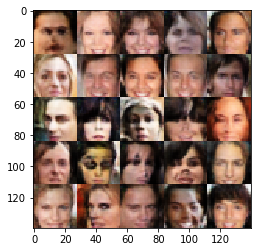

Epoch 3/3... Batch 3210  Discriminator Loss: 1.3341... Generator Loss: 0.8099
Epoch 3/3... Batch 3220  Discriminator Loss: 1.4465... Generator Loss: 0.7811
Epoch 3/3... Batch 3230  Discriminator Loss: 1.4026... Generator Loss: 0.7168
Epoch 3/3... Batch 3240  Discriminator Loss: 1.4014... Generator Loss: 0.7228
Epoch 3/3... Batch 3250  Discriminator Loss: 1.3416... Generator Loss: 0.8075
Epoch 3/3... Batch 3260  Discriminator Loss: 1.4001... Generator Loss: 0.7950
Epoch 3/3... Batch 3270  Discriminator Loss: 1.3473... Generator Loss: 0.8217
Epoch 3/3... Batch 3280  Discriminator Loss: 1.3715... Generator Loss: 0.8387
Epoch 3/3... Batch 3290  Discriminator Loss: 1.3760... Generator Loss: 0.8506
Epoch 3/3... Batch 3300  Discriminator Loss: 1.4118... Generator Loss: 0.7277


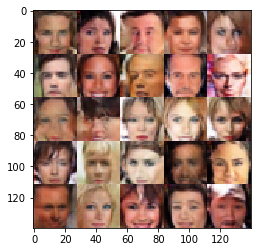

Epoch 3/3... Batch 3310  Discriminator Loss: 1.4583... Generator Loss: 0.8621
Epoch 3/3... Batch 3320  Discriminator Loss: 1.3907... Generator Loss: 0.8318
Epoch 3/3... Batch 3330  Discriminator Loss: 1.3971... Generator Loss: 0.8496
Epoch 3/3... Batch 3340  Discriminator Loss: 1.3441... Generator Loss: 0.7843
Epoch 3/3... Batch 3350  Discriminator Loss: 1.4032... Generator Loss: 0.7310
Epoch 3/3... Batch 3360  Discriminator Loss: 1.3728... Generator Loss: 0.7977
Epoch 3/3... Batch 3370  Discriminator Loss: 1.3982... Generator Loss: 0.6635
Epoch 3/3... Batch 3380  Discriminator Loss: 1.3510... Generator Loss: 0.8165
Epoch 3/3... Batch 3390  Discriminator Loss: 1.3403... Generator Loss: 0.7999
Epoch 3/3... Batch 3400  Discriminator Loss: 1.3830... Generator Loss: 0.7632


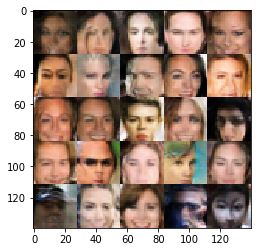

Epoch 3/3... Batch 3410  Discriminator Loss: 1.3558... Generator Loss: 0.6755
Epoch 3/3... Batch 3420  Discriminator Loss: 1.2933... Generator Loss: 0.7905
Epoch 3/3... Batch 3430  Discriminator Loss: 1.3853... Generator Loss: 0.7629
Epoch 3/3... Batch 3440  Discriminator Loss: 1.3354... Generator Loss: 0.7323
Epoch 3/3... Batch 3450  Discriminator Loss: 1.3554... Generator Loss: 0.7657
Epoch 3/3... Batch 3460  Discriminator Loss: 1.3924... Generator Loss: 0.7689
Epoch 3/3... Batch 3470  Discriminator Loss: 1.3606... Generator Loss: 0.8312
Epoch 3/3... Batch 3480  Discriminator Loss: 1.3750... Generator Loss: 0.8104
Epoch 3/3... Batch 3490  Discriminator Loss: 1.3629... Generator Loss: 0.7911
Epoch 3/3... Batch 3500  Discriminator Loss: 1.3865... Generator Loss: 0.7584


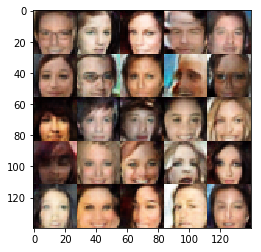

Epoch 3/3... Batch 3510  Discriminator Loss: 1.3864... Generator Loss: 0.7429
Epoch 3/3... Batch 3520  Discriminator Loss: 1.3585... Generator Loss: 0.8379
Epoch 3/3... Batch 3530  Discriminator Loss: 1.3215... Generator Loss: 0.8110
Epoch 3/3... Batch 3540  Discriminator Loss: 1.4286... Generator Loss: 0.8167
Epoch 3/3... Batch 3550  Discriminator Loss: 1.3661... Generator Loss: 0.8571
Epoch 3/3... Batch 3560  Discriminator Loss: 1.4178... Generator Loss: 0.7805
Epoch 3/3... Batch 3570  Discriminator Loss: 1.3033... Generator Loss: 0.7841
Epoch 3/3... Batch 3580  Discriminator Loss: 1.3390... Generator Loss: 0.7834
Epoch 3/3... Batch 3590  Discriminator Loss: 1.3892... Generator Loss: 0.7836
Epoch 3/3... Batch 3600  Discriminator Loss: 1.3502... Generator Loss: 0.7859


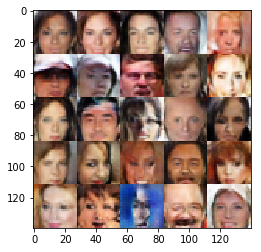

Epoch 3/3... Batch 3610  Discriminator Loss: 1.3536... Generator Loss: 0.7683
Epoch 3/3... Batch 3620  Discriminator Loss: 1.3992... Generator Loss: 0.8139
Epoch 3/3... Batch 3630  Discriminator Loss: 1.3208... Generator Loss: 0.7756
Epoch 3/3... Batch 3640  Discriminator Loss: 1.4022... Generator Loss: 0.6861
Epoch 3/3... Batch 3650  Discriminator Loss: 1.4003... Generator Loss: 0.7013
Epoch 3/3... Batch 3660  Discriminator Loss: 1.3722... Generator Loss: 0.7824
Epoch 3/3... Batch 3670  Discriminator Loss: 1.3680... Generator Loss: 0.8558
Epoch 3/3... Batch 3680  Discriminator Loss: 1.4175... Generator Loss: 0.7022
Epoch 3/3... Batch 3690  Discriminator Loss: 1.3273... Generator Loss: 0.7981
Epoch 3/3... Batch 3700  Discriminator Loss: 1.3159... Generator Loss: 0.8549


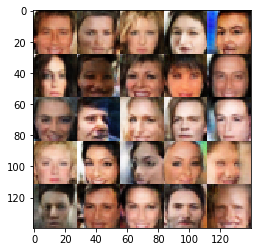

Epoch 3/3... Batch 3710  Discriminator Loss: 1.3091... Generator Loss: 0.6766
Epoch 3/3... Batch 3720  Discriminator Loss: 1.3846... Generator Loss: 0.8550
Epoch 3/3... Batch 3730  Discriminator Loss: 1.3192... Generator Loss: 0.9497
Epoch 3/3... Batch 3740  Discriminator Loss: 1.3732... Generator Loss: 0.7752
Epoch 3/3... Batch 3750  Discriminator Loss: 1.3572... Generator Loss: 0.7408
Epoch 3/3... Batch 3760  Discriminator Loss: 1.3606... Generator Loss: 0.7868
Epoch 3/3... Batch 3770  Discriminator Loss: 1.3867... Generator Loss: 0.8805
Epoch 3/3... Batch 3780  Discriminator Loss: 1.3546... Generator Loss: 0.7936
Epoch 3/3... Batch 3790  Discriminator Loss: 1.4282... Generator Loss: 0.6707
Epoch 3/3... Batch 3800  Discriminator Loss: 1.4126... Generator Loss: 0.7529


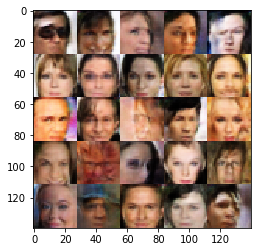

Epoch 3/3... Batch 3810  Discriminator Loss: 1.3551... Generator Loss: 0.6774
Epoch 3/3... Batch 3820  Discriminator Loss: 1.3641... Generator Loss: 0.8780
Epoch 3/3... Batch 3830  Discriminator Loss: 1.2927... Generator Loss: 0.7654
Epoch 3/3... Batch 3840  Discriminator Loss: 1.3298... Generator Loss: 0.7053
Epoch 3/3... Batch 3850  Discriminator Loss: 1.3557... Generator Loss: 0.7698
Epoch 3/3... Batch 3860  Discriminator Loss: 1.3498... Generator Loss: 0.9206
Epoch 3/3... Batch 3870  Discriminator Loss: 1.4097... Generator Loss: 0.7792
Epoch 3/3... Batch 3880  Discriminator Loss: 1.4394... Generator Loss: 0.6143
Epoch 3/3... Batch 3890  Discriminator Loss: 1.2809... Generator Loss: 0.8876
Epoch 3/3... Batch 3900  Discriminator Loss: 1.3385... Generator Loss: 0.7444


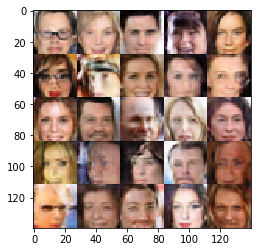

Epoch 3/3... Batch 3910  Discriminator Loss: 1.3102... Generator Loss: 0.9057
Epoch 3/3... Batch 3920  Discriminator Loss: 1.3550... Generator Loss: 0.7062
Epoch 3/3... Batch 3930  Discriminator Loss: 1.3717... Generator Loss: 0.7335
Epoch 3/3... Batch 3940  Discriminator Loss: 1.3906... Generator Loss: 0.7727
Epoch 3/3... Batch 3950  Discriminator Loss: 1.3132... Generator Loss: 0.8509
Epoch 3/3... Batch 3960  Discriminator Loss: 1.3018... Generator Loss: 0.8479
Epoch 3/3... Batch 3970  Discriminator Loss: 1.3147... Generator Loss: 0.9526
Epoch 3/3... Batch 3980  Discriminator Loss: 1.4070... Generator Loss: 0.9108
Epoch 3/3... Batch 3990  Discriminator Loss: 1.3082... Generator Loss: 0.8708
Epoch 3/3... Batch 4000  Discriminator Loss: 1.3495... Generator Loss: 0.8972


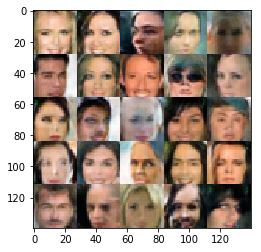

Epoch 3/3... Batch 4010  Discriminator Loss: 1.3818... Generator Loss: 0.8040
Epoch 3/3... Batch 4020  Discriminator Loss: 1.3472... Generator Loss: 0.7977
Epoch 3/3... Batch 4030  Discriminator Loss: 1.3864... Generator Loss: 0.7923
Epoch 3/3... Batch 4040  Discriminator Loss: 1.3038... Generator Loss: 0.8457
Epoch 3/3... Batch 4050  Discriminator Loss: 1.3883... Generator Loss: 0.7139
Epoch 3/3... Batch 4060  Discriminator Loss: 1.4307... Generator Loss: 0.9030
Epoch 3/3... Batch 4070  Discriminator Loss: 1.3094... Generator Loss: 0.8089
Epoch 3/3... Batch 4080  Discriminator Loss: 1.3690... Generator Loss: 0.7605
Epoch 3/3... Batch 4090  Discriminator Loss: 1.3378... Generator Loss: 0.7627
Epoch 3/3... Batch 4100  Discriminator Loss: 1.2612... Generator Loss: 0.8154


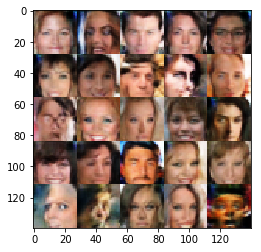

Epoch 3/3... Batch 4110  Discriminator Loss: 1.3245... Generator Loss: 0.8187
Epoch 3/3... Batch 4120  Discriminator Loss: 1.3930... Generator Loss: 0.8066
Epoch 3/3... Batch 4130  Discriminator Loss: 1.3497... Generator Loss: 0.9110
Epoch 3/3... Batch 4140  Discriminator Loss: 1.4065... Generator Loss: 0.7007
Epoch 3/3... Batch 4150  Discriminator Loss: 1.3529... Generator Loss: 0.8106
Epoch 3/3... Batch 4160  Discriminator Loss: 1.3498... Generator Loss: 0.8043
Epoch 3/3... Batch 4170  Discriminator Loss: 1.3633... Generator Loss: 0.7917
Epoch 3/3... Batch 4180  Discriminator Loss: 1.4095... Generator Loss: 0.7972
Epoch 3/3... Batch 4190  Discriminator Loss: 1.3605... Generator Loss: 0.7623
Epoch 3/3... Batch 4200  Discriminator Loss: 1.3813... Generator Loss: 0.8358


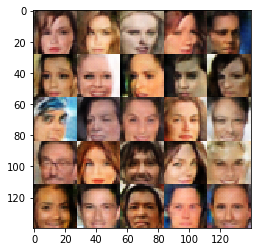

Epoch 3/3... Batch 4210  Discriminator Loss: 1.3393... Generator Loss: 0.8247
Epoch 3/3... Batch 4220  Discriminator Loss: 1.3449... Generator Loss: 0.8104
Epoch 3/3... Batch 4230  Discriminator Loss: 1.3751... Generator Loss: 0.8754
Epoch 3/3... Batch 4240  Discriminator Loss: 1.4057... Generator Loss: 0.6953
Epoch 3/3... Batch 4250  Discriminator Loss: 1.2417... Generator Loss: 0.8857
Epoch 3/3... Batch 4260  Discriminator Loss: 1.4007... Generator Loss: 0.7018
Epoch 3/3... Batch 4270  Discriminator Loss: 1.3699... Generator Loss: 0.7111
Epoch 3/3... Batch 4280  Discriminator Loss: 1.4012... Generator Loss: 0.7438
Epoch 3/3... Batch 4290  Discriminator Loss: 1.3091... Generator Loss: 0.8678
Epoch 3/3... Batch 4300  Discriminator Loss: 1.3837... Generator Loss: 0.7609


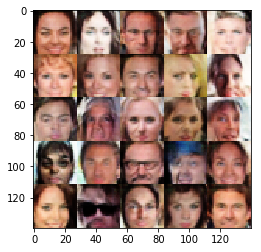

Epoch 3/3... Batch 4310  Discriminator Loss: 1.3149... Generator Loss: 0.8448
Epoch 3/3... Batch 4320  Discriminator Loss: 1.4186... Generator Loss: 0.8490
Epoch 3/3... Batch 4330  Discriminator Loss: 1.3924... Generator Loss: 0.8175
Epoch 3/3... Batch 4340  Discriminator Loss: 1.2271... Generator Loss: 0.8119
Epoch 3/3... Batch 4350  Discriminator Loss: 1.3829... Generator Loss: 0.7804
Epoch 3/3... Batch 4360  Discriminator Loss: 1.3803... Generator Loss: 0.7645
Epoch 3/3... Batch 4370  Discriminator Loss: 1.3504... Generator Loss: 0.8457
Epoch 3/3... Batch 4380  Discriminator Loss: 1.3275... Generator Loss: 0.7885
Epoch 3/3... Batch 4390  Discriminator Loss: 1.4372... Generator Loss: 0.8262
Epoch 3/3... Batch 4400  Discriminator Loss: 1.3148... Generator Loss: 0.8472


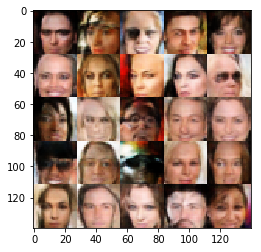

Epoch 3/3... Batch 4410  Discriminator Loss: 1.3088... Generator Loss: 0.8564
Epoch 3/3... Batch 4420  Discriminator Loss: 1.2573... Generator Loss: 0.8529
Epoch 3/3... Batch 4430  Discriminator Loss: 1.3361... Generator Loss: 0.7680
Epoch 3/3... Batch 4440  Discriminator Loss: 1.3918... Generator Loss: 0.8235
Epoch 3/3... Batch 4450  Discriminator Loss: 1.3790... Generator Loss: 0.7466
Epoch 3/3... Batch 4460  Discriminator Loss: 1.3706... Generator Loss: 0.7858
Epoch 3/3... Batch 4470  Discriminator Loss: 1.2682... Generator Loss: 0.8662
Epoch 3/3... Batch 4480  Discriminator Loss: 1.3515... Generator Loss: 0.8557
Epoch 3/3... Batch 4490  Discriminator Loss: 1.4191... Generator Loss: 0.7976
Epoch 3/3... Batch 4500  Discriminator Loss: 1.3643... Generator Loss: 0.8171


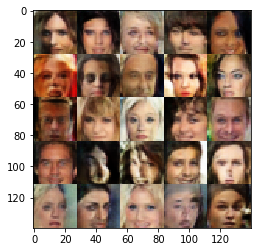

Epoch 3/3... Batch 4510  Discriminator Loss: 1.3690... Generator Loss: 0.7481
Epoch 3/3... Batch 4520  Discriminator Loss: 1.4146... Generator Loss: 0.8172
Epoch 3/3... Batch 4530  Discriminator Loss: 1.3365... Generator Loss: 0.8037
Epoch 3/3... Batch 4540  Discriminator Loss: 1.4100... Generator Loss: 0.8421
Epoch 3/3... Batch 4550  Discriminator Loss: 1.3692... Generator Loss: 0.8122
Epoch 3/3... Batch 4560  Discriminator Loss: 1.4285... Generator Loss: 0.7675
Epoch 3/3... Batch 4570  Discriminator Loss: 1.2763... Generator Loss: 0.9535
Epoch 3/3... Batch 4580  Discriminator Loss: 1.2794... Generator Loss: 0.9277
Epoch 3/3... Batch 4590  Discriminator Loss: 1.2902... Generator Loss: 0.8853
Epoch 3/3... Batch 4600  Discriminator Loss: 1.2602... Generator Loss: 0.8855


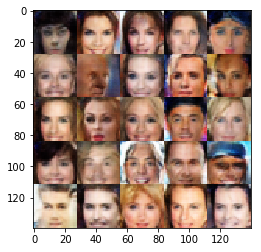

Epoch 3/3... Batch 4610  Discriminator Loss: 1.3042... Generator Loss: 0.7990
Epoch 3/3... Batch 4620  Discriminator Loss: 1.3640... Generator Loss: 0.7798
Epoch 3/3... Batch 4630  Discriminator Loss: 1.4128... Generator Loss: 0.8054
Epoch 3/3... Batch 4640  Discriminator Loss: 1.3595... Generator Loss: 0.8220
Epoch 3/3... Batch 4650  Discriminator Loss: 1.3189... Generator Loss: 0.8921
Epoch 3/3... Batch 4660  Discriminator Loss: 1.3468... Generator Loss: 0.7120
Epoch 3/3... Batch 4670  Discriminator Loss: 1.3081... Generator Loss: 0.7746
Epoch 3/3... Batch 4680  Discriminator Loss: 1.3509... Generator Loss: 0.8340
Epoch 3/3... Batch 4690  Discriminator Loss: 1.4001... Generator Loss: 0.6942
Epoch 3/3... Batch 4700  Discriminator Loss: 1.4394... Generator Loss: 0.6638


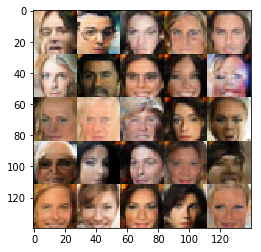

Epoch 3/3... Batch 4710  Discriminator Loss: 1.3697... Generator Loss: 0.7603
Epoch 3/3... Batch 4720  Discriminator Loss: 1.3590... Generator Loss: 0.8201
Epoch 3/3... Batch 4730  Discriminator Loss: 1.3471... Generator Loss: 0.8186
Epoch 3/3... Batch 4740  Discriminator Loss: 1.3369... Generator Loss: 0.7404
Epoch 3/3... Batch 4750  Discriminator Loss: 1.3747... Generator Loss: 0.8117
Epoch 3/3... Batch 4760  Discriminator Loss: 1.3719... Generator Loss: 0.7050
Epoch 3/3... Batch 4770  Discriminator Loss: 1.3758... Generator Loss: 0.8023
Epoch 3/3... Batch 4780  Discriminator Loss: 1.2905... Generator Loss: 0.8006
Epoch 3/3... Batch 4790  Discriminator Loss: 1.3245... Generator Loss: 0.8630
Epoch 3/3... Batch 4800  Discriminator Loss: 1.4071... Generator Loss: 0.7770


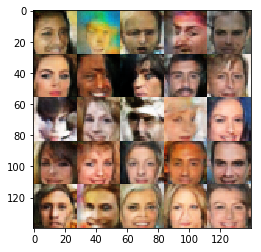

Epoch 3/3... Batch 4810  Discriminator Loss: 1.3381... Generator Loss: 0.8434
Epoch 3/3... Batch 4820  Discriminator Loss: 1.3143... Generator Loss: 0.8851
Epoch 3/3... Batch 4830  Discriminator Loss: 1.2993... Generator Loss: 0.7692
Epoch 3/3... Batch 4840  Discriminator Loss: 1.3106... Generator Loss: 0.8094
Epoch 3/3... Batch 4850  Discriminator Loss: 1.3691... Generator Loss: 0.6760
Epoch 3/3... Batch 4860  Discriminator Loss: 1.4096... Generator Loss: 0.7065
Epoch 3/3... Batch 4870  Discriminator Loss: 1.3467... Generator Loss: 0.6914
Epoch 3/3... Batch 4880  Discriminator Loss: 1.3353... Generator Loss: 0.8273
Epoch 3/3... Batch 4890  Discriminator Loss: 1.3718... Generator Loss: 0.8320
Epoch 3/3... Batch 4900  Discriminator Loss: 1.3063... Generator Loss: 0.7564


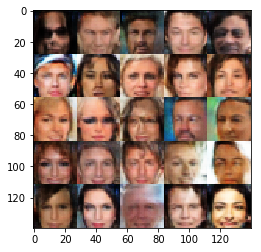

Epoch 3/3... Batch 4910  Discriminator Loss: 1.3103... Generator Loss: 0.6990
Epoch 3/3... Batch 4920  Discriminator Loss: 1.4426... Generator Loss: 0.7326
Epoch 3/3... Batch 4930  Discriminator Loss: 1.2893... Generator Loss: 0.8577
Epoch 3/3... Batch 4940  Discriminator Loss: 1.3587... Generator Loss: 0.7932
Epoch 3/3... Batch 4950  Discriminator Loss: 1.3823... Generator Loss: 0.7669
Epoch 3/3... Batch 4960  Discriminator Loss: 1.3579... Generator Loss: 0.7488
Epoch 3/3... Batch 4970  Discriminator Loss: 1.3510... Generator Loss: 0.7558
Epoch 3/3... Batch 4980  Discriminator Loss: 1.3543... Generator Loss: 0.7796
Epoch 3/3... Batch 4990  Discriminator Loss: 1.3063... Generator Loss: 0.7385
Epoch 3/3... Batch 5000  Discriminator Loss: 1.3234... Generator Loss: 0.8795


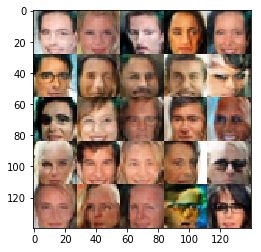

Epoch 3/3... Batch 5010  Discriminator Loss: 1.4628... Generator Loss: 0.5927
Epoch 3/3... Batch 5020  Discriminator Loss: 1.3813... Generator Loss: 0.7516
Epoch 3/3... Batch 5030  Discriminator Loss: 1.3442... Generator Loss: 0.7515
Epoch 3/3... Batch 5040  Discriminator Loss: 1.3957... Generator Loss: 0.7619
Epoch 3/3... Batch 5050  Discriminator Loss: 1.3150... Generator Loss: 0.7575
Epoch 3/3... Batch 5060  Discriminator Loss: 1.3727... Generator Loss: 0.7795
Epoch 3/3... Batch 5070  Discriminator Loss: 1.3429... Generator Loss: 0.8424
Epoch 3/3... Batch 5080  Discriminator Loss: 1.3107... Generator Loss: 0.8516
Epoch 3/3... Batch 5090  Discriminator Loss: 1.4198... Generator Loss: 0.6807
Epoch 3/3... Batch 5100  Discriminator Loss: 1.4198... Generator Loss: 0.8332


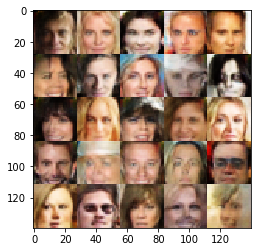

Epoch 3/3... Batch 5110  Discriminator Loss: 1.3854... Generator Loss: 0.8003
Epoch 3/3... Batch 5120  Discriminator Loss: 1.3213... Generator Loss: 0.8253
Epoch 3/3... Batch 5130  Discriminator Loss: 1.3014... Generator Loss: 0.8030
Epoch 3/3... Batch 5140  Discriminator Loss: 1.3750... Generator Loss: 0.7737
Epoch 3/3... Batch 5150  Discriminator Loss: 1.3024... Generator Loss: 0.8635
Epoch 3/3... Batch 5160  Discriminator Loss: 1.3539... Generator Loss: 0.9118
Epoch 3/3... Batch 5170  Discriminator Loss: 1.3886... Generator Loss: 0.7355
Epoch 3/3... Batch 5180  Discriminator Loss: 1.3880... Generator Loss: 0.8580
Epoch 3/3... Batch 5190  Discriminator Loss: 1.3809... Generator Loss: 0.7164
Epoch 3/3... Batch 5200  Discriminator Loss: 1.4733... Generator Loss: 0.7845


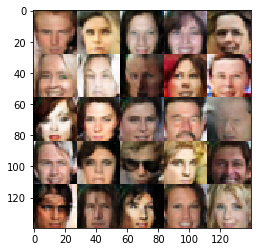

Epoch 3/3... Batch 5210  Discriminator Loss: 1.3895... Generator Loss: 0.8481
Epoch 3/3... Batch 5220  Discriminator Loss: 1.2698... Generator Loss: 0.8256
Epoch 3/3... Batch 5230  Discriminator Loss: 1.3348... Generator Loss: 0.7895
Epoch 3/3... Batch 5240  Discriminator Loss: 1.3924... Generator Loss: 0.9258
Epoch 3/3... Batch 5250  Discriminator Loss: 1.3224... Generator Loss: 0.8774
Epoch 3/3... Batch 5260  Discriminator Loss: 1.3886... Generator Loss: 0.7996
Epoch 3/3... Batch 5270  Discriminator Loss: 1.2291... Generator Loss: 0.8816
Epoch 3/3... Batch 5280  Discriminator Loss: 1.3842... Generator Loss: 0.8306
Epoch 3/3... Batch 5290  Discriminator Loss: 1.3238... Generator Loss: 0.7487
Epoch 3/3... Batch 5300  Discriminator Loss: 1.3761... Generator Loss: 0.7745


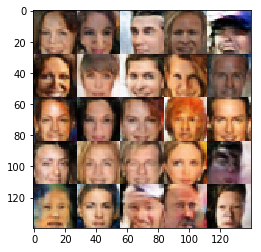

Epoch 3/3... Batch 5310  Discriminator Loss: 1.3768... Generator Loss: 0.7770
Epoch 3/3... Batch 5320  Discriminator Loss: 1.3987... Generator Loss: 0.8064
Epoch 3/3... Batch 5330  Discriminator Loss: 1.3499... Generator Loss: 0.7758
Epoch 3/3... Batch 5340  Discriminator Loss: 1.3895... Generator Loss: 0.7567
Epoch 3/3... Batch 5350  Discriminator Loss: 1.3585... Generator Loss: 0.8556
Epoch 3/3... Batch 5360  Discriminator Loss: 1.3364... Generator Loss: 0.7425
Epoch 3/3... Batch 5370  Discriminator Loss: 1.3210... Generator Loss: 0.8124
Epoch 3/3... Batch 5380  Discriminator Loss: 1.3214... Generator Loss: 0.7627
Epoch 3/3... Batch 5390  Discriminator Loss: 1.3332... Generator Loss: 0.7890
Epoch 3/3... Batch 5400  Discriminator Loss: 1.2923... Generator Loss: 0.7499


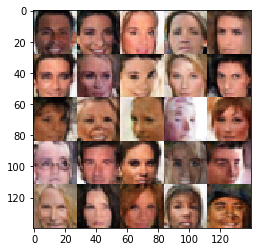

Epoch 3/3... Batch 5410  Discriminator Loss: 1.3599... Generator Loss: 0.7642
Epoch 3/3... Batch 5420  Discriminator Loss: 1.3167... Generator Loss: 0.8242
Epoch 3/3... Batch 5430  Discriminator Loss: 1.3025... Generator Loss: 0.8374
Epoch 3/3... Batch 5440  Discriminator Loss: 1.3547... Generator Loss: 0.7429
Epoch 3/3... Batch 5450  Discriminator Loss: 1.3599... Generator Loss: 0.7186
Epoch 3/3... Batch 5460  Discriminator Loss: 1.3911... Generator Loss: 0.7845
Epoch 3/3... Batch 5470  Discriminator Loss: 1.3616... Generator Loss: 0.8009
Epoch 3/3... Batch 5480  Discriminator Loss: 1.4563... Generator Loss: 0.6350
Epoch 3/3... Batch 5490  Discriminator Loss: 1.2903... Generator Loss: 0.7022
Epoch 3/3... Batch 5500  Discriminator Loss: 1.3358... Generator Loss: 0.8405


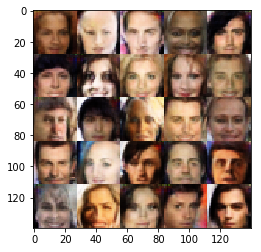

Epoch 3/3... Batch 5510  Discriminator Loss: 1.3283... Generator Loss: 0.8336
Epoch 3/3... Batch 5520  Discriminator Loss: 1.3875... Generator Loss: 0.7609
Epoch 3/3... Batch 5530  Discriminator Loss: 1.4157... Generator Loss: 0.8319
Epoch 3/3... Batch 5540  Discriminator Loss: 1.4074... Generator Loss: 0.7407
Epoch 3/3... Batch 5550  Discriminator Loss: 1.3542... Generator Loss: 0.6986
Epoch 3/3... Batch 5560  Discriminator Loss: 1.3533... Generator Loss: 0.8630
Epoch 3/3... Batch 5570  Discriminator Loss: 1.3136... Generator Loss: 0.7667
Epoch 3/3... Batch 5580  Discriminator Loss: 1.3382... Generator Loss: 0.7136
Epoch 3/3... Batch 5590  Discriminator Loss: 1.3425... Generator Loss: 0.9166
Epoch 3/3... Batch 5600  Discriminator Loss: 1.4396... Generator Loss: 0.7564


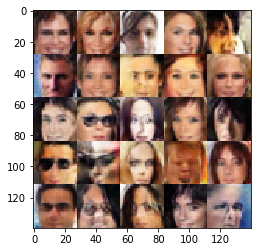

Epoch 3/3... Batch 5610  Discriminator Loss: 1.3925... Generator Loss: 0.7171
Epoch 3/3... Batch 5620  Discriminator Loss: 1.4361... Generator Loss: 0.6385
Epoch 3/3... Batch 5630  Discriminator Loss: 1.4864... Generator Loss: 0.6626
Epoch 3/3... Batch 5640  Discriminator Loss: 1.3349... Generator Loss: 0.8200
Epoch 3/3... Batch 5650  Discriminator Loss: 1.3486... Generator Loss: 0.8711
Epoch 3/3... Batch 5660  Discriminator Loss: 1.3591... Generator Loss: 0.7830
Epoch 3/3... Batch 5670  Discriminator Loss: 1.3741... Generator Loss: 0.6527
Epoch 3/3... Batch 5680  Discriminator Loss: 1.3179... Generator Loss: 0.7240
Epoch 3/3... Batch 5690  Discriminator Loss: 1.4493... Generator Loss: 0.7122
Epoch 3/3... Batch 5700  Discriminator Loss: 1.3978... Generator Loss: 0.7587


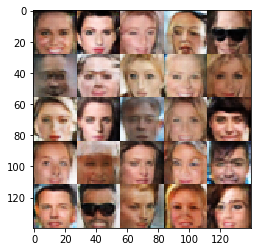

Epoch 3/3... Batch 5710  Discriminator Loss: 1.3018... Generator Loss: 0.7631
Epoch 3/3... Batch 5720  Discriminator Loss: 1.4016... Generator Loss: 0.7636
Epoch 3/3... Batch 5730  Discriminator Loss: 1.4093... Generator Loss: 0.6423
Epoch 3/3... Batch 5740  Discriminator Loss: 1.3701... Generator Loss: 0.9121
Epoch 3/3... Batch 5750  Discriminator Loss: 1.3783... Generator Loss: 0.6900
Epoch 3/3... Batch 5760  Discriminator Loss: 1.2920... Generator Loss: 0.9079
Epoch 3/3... Batch 5770  Discriminator Loss: 1.3388... Generator Loss: 0.8461
Epoch 3/3... Batch 5780  Discriminator Loss: 1.4213... Generator Loss: 0.6879
Epoch 3/3... Batch 5790  Discriminator Loss: 1.3679... Generator Loss: 0.7395
Epoch 3/3... Batch 5800  Discriminator Loss: 1.4861... Generator Loss: 0.7474


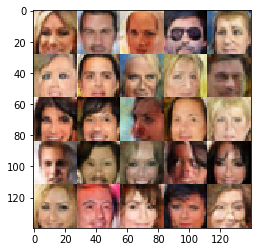

Epoch 3/3... Batch 5810  Discriminator Loss: 1.4557... Generator Loss: 0.7325
Epoch 3/3... Batch 5820  Discriminator Loss: 1.3638... Generator Loss: 0.7195
Epoch 3/3... Batch 5830  Discriminator Loss: 1.3620... Generator Loss: 0.9186
Epoch 3/3... Batch 5840  Discriminator Loss: 1.2846... Generator Loss: 0.8308
Epoch 3/3... Batch 5850  Discriminator Loss: 1.2929... Generator Loss: 0.8521
Epoch 3/3... Batch 5860  Discriminator Loss: 1.3209... Generator Loss: 0.7955
Epoch 3/3... Batch 5870  Discriminator Loss: 1.4015... Generator Loss: 0.8977
Epoch 3/3... Batch 5880  Discriminator Loss: 1.4093... Generator Loss: 0.8676
Epoch 3/3... Batch 5890  Discriminator Loss: 1.4737... Generator Loss: 0.7873
Epoch 3/3... Batch 5900  Discriminator Loss: 1.3851... Generator Loss: 0.8085


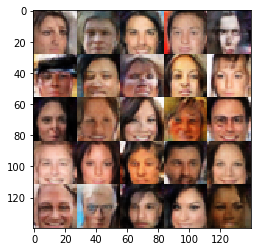

Epoch 3/3... Batch 5910  Discriminator Loss: 1.2939... Generator Loss: 0.8627
Epoch 3/3... Batch 5920  Discriminator Loss: 1.3556... Generator Loss: 0.7777
Epoch 3/3... Batch 5930  Discriminator Loss: 1.3153... Generator Loss: 0.7642
Epoch 3/3... Batch 5940  Discriminator Loss: 1.5369... Generator Loss: 0.7006
Epoch 3/3... Batch 5950  Discriminator Loss: 1.3820... Generator Loss: 0.7469
Epoch 3/3... Batch 5960  Discriminator Loss: 1.3663... Generator Loss: 0.7304
Epoch 3/3... Batch 5970  Discriminator Loss: 1.2976... Generator Loss: 0.7988
Epoch 3/3... Batch 5980  Discriminator Loss: 1.3225... Generator Loss: 0.7702
Epoch 3/3... Batch 5990  Discriminator Loss: 1.3789... Generator Loss: 0.7891
Epoch 3/3... Batch 6000  Discriminator Loss: 1.3555... Generator Loss: 0.6694


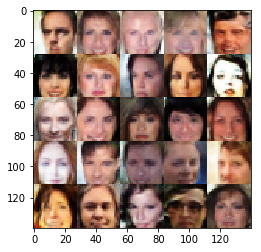

Epoch 3/3... Batch 6010  Discriminator Loss: 1.5401... Generator Loss: 0.6526
Epoch 3/3... Batch 6020  Discriminator Loss: 1.3030... Generator Loss: 0.7078
Epoch 3/3... Batch 6030  Discriminator Loss: 1.3440... Generator Loss: 0.7601
Epoch 3/3... Batch 6040  Discriminator Loss: 1.4464... Generator Loss: 0.6134
Epoch 3/3... Batch 6050  Discriminator Loss: 1.3653... Generator Loss: 0.7781
Epoch 3/3... Batch 6060  Discriminator Loss: 1.3756... Generator Loss: 0.7449
Epoch 3/3... Batch 6070  Discriminator Loss: 1.4333... Generator Loss: 0.7810
Epoch 3/3... Batch 6080  Discriminator Loss: 1.3840... Generator Loss: 0.7483
Epoch 3/3... Batch 6090  Discriminator Loss: 1.2651... Generator Loss: 0.7890
Epoch 3/3... Batch 6100  Discriminator Loss: 1.3259... Generator Loss: 0.8495


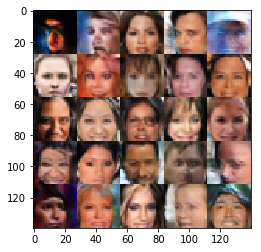

Epoch 3/3... Batch 6110  Discriminator Loss: 1.3081... Generator Loss: 0.9081
Epoch 3/3... Batch 6120  Discriminator Loss: 1.4013... Generator Loss: 0.7745
Epoch 3/3... Batch 6130  Discriminator Loss: 1.3493... Generator Loss: 0.7810
Epoch 3/3... Batch 6140  Discriminator Loss: 1.3506... Generator Loss: 0.6834
Epoch 3/3... Batch 6150  Discriminator Loss: 1.3416... Generator Loss: 0.8278
Epoch 3/3... Batch 6160  Discriminator Loss: 1.3318... Generator Loss: 0.8506
Epoch 3/3... Batch 6170  Discriminator Loss: 1.4702... Generator Loss: 0.6981
Epoch 3/3... Batch 6180  Discriminator Loss: 1.3480... Generator Loss: 0.9864
Epoch 3/3... Batch 6190  Discriminator Loss: 1.2880... Generator Loss: 0.8674
Epoch 3/3... Batch 6200  Discriminator Loss: 1.3409... Generator Loss: 0.7028


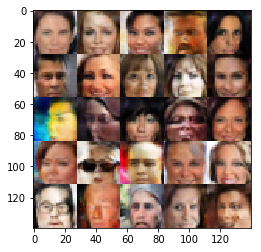

Epoch 3/3... Batch 6210  Discriminator Loss: 1.3258... Generator Loss: 0.7409
Epoch 3/3... Batch 6220  Discriminator Loss: 1.3209... Generator Loss: 0.7647
Epoch 3/3... Batch 6230  Discriminator Loss: 1.3357... Generator Loss: 0.8259
Epoch 3/3... Batch 6240  Discriminator Loss: 1.3079... Generator Loss: 0.8700
Epoch 3/3... Batch 6250  Discriminator Loss: 1.3190... Generator Loss: 0.8684
Epoch 3/3... Batch 6260  Discriminator Loss: 1.2738... Generator Loss: 0.8363
Epoch 3/3... Batch 6270  Discriminator Loss: 1.2693... Generator Loss: 0.8247
Epoch 3/3... Batch 6280  Discriminator Loss: 1.2598... Generator Loss: 0.8434
Epoch 3/3... Batch 6290  Discriminator Loss: 1.3252... Generator Loss: 0.7527
Epoch 3/3... Batch 6300  Discriminator Loss: 1.3182... Generator Loss: 0.8886


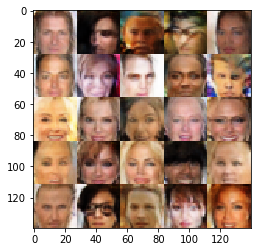

Epoch 3/3... Batch 6310  Discriminator Loss: 1.2273... Generator Loss: 1.0032
Epoch 3/3... Batch 6320  Discriminator Loss: 1.4430... Generator Loss: 0.8374
Epoch 3/3... Batch 6330  Discriminator Loss: 1.2891... Generator Loss: 0.8015


In [21]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    loss_d, loss_g = train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
                           celeba_dataset.shape, celeba_dataset.image_mode)

In [12]:
from bokeh.plotting import figure, show
from bokeh.io import push_notebook, show, output_notebook
output_notebook() 

Loading BokehJS ...

In [27]:
x_range = [i for i in range(len(loss_d))]
x_range_large = [i for i in range(len(loss_d)) if i % 50 == 0]
loss_d_large = [loss_d[i] for i in x_range_large]
loss_g_large = [loss_g[i] for i in x_range_large]
p = figure(tools = 'save', title='loss_beat1')
p.line(x_range, loss_d, color='#A6CEE3', legend='loss_d')
p.line(x_range, loss_g, color='#FB9A99', legend='loss_g')
p.line(x_range_large, loss_d_large, color='red', legend='loss_d_50')
p.line(x_range_large, loss_g_large, color='blue', legend='loss_g_50')
p.legend.location = "top_left"
show(p)

In [28]:
import numpy as np
print('loss_d mean: ', np.mean(loss_d))
print('loss_g mean: ', np.mean(loss_g))
print('loss_d std: ', np.std(loss_d))
print('loss_g std: ', np.std(loss_g))

loss_d mean:  1.40156
loss_g mean:  0.779231
loss_d std:  0.11954
loss_g std:  0.148314


### 调参记录

更改了模型结构：

* Generator: 7x7x512 ---> 14x14x256 ---> 28x28x128 ---> 28x28x3
* Discriminator：28x28x3 ---> 14x14x64 ---> 7x7x128 ---> 7x7x256
* 学习率 0.00025 ---> Discriminator Loss: 0.4439... Generator Loss: 1.4835 感觉很一般，在2000个batch后，g_loss突然上升了

尝试加入dropout：Discriminator Loss: 1.3863... Generator Loss: 0.4561

最后的模型结构：
* Generator: 7x7x512 ---> 14x14x256 ---> 28x28x128 ---> 28x28x3
* Discriminator：28x28x3 ---> 14x14x64 ---> 7x7x128 ---> 4x4x256

为了查看下模型的最终效果，将迭代次数调整到2次，效果不错，基本看到了人的五官

迭代次数继续增加，应该会得到更好的结果

修改了一些细节，再次训练，为了加快运行，将学习率调整为0.001

batch_size调整：
* 32 ---> Discriminator Loss: 1.4156... Generator Loss: 0.7807
* 16 ---> loss没有太多的差异，但是感觉没有32的清晰

beta1调整：
* 0.4 ---> 
* 0.3 ---> 感觉看不出什么差异，决定把loss值画一个折线图

loss平均值
* 0.5 ---> loss_d:1.47411, loss_g:0.782833
* 0.4 ---> loss_d:1.46574, loss_g:0.763507
* 0.3 ---> loss_d:1.47147, loss_g:0.761641 在第3000个batch出现异常值
* 感觉差别不大，仍旧沿用beta1参数为0.5

最后来一次epoch=3，学习率为0.0002的，可以看到比较清晰的人脸图像了


### 提交项目
提交本项目前，确保运行所有 cells 后保存该文件。

保存该文件为 "dlnd_face_generation.ipynb"， 并另存为 HTML 格式 "File" -> "Download as"。提交项目时请附带 "helper.py" 和 "problem_unittests.py" 文件。